In [1]:
import os
import re
from math import sqrt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

def get_concurrency_parallelism(cc_value):
    value = int(sqrt(cc_value))
    return value, value

def process_log_files(directory,string):
    dataframes = []
    for filename in os.listdir(directory):
        if filename.startswith(string) and filename.endswith(".log"):
            full_path = os.path.join(directory, filename)
            if os.stat(full_path).st_size == 0:
                print(f"Skipping empty file: {filename}")
                continue
            with open(full_path, 'r') as file:
                data = []
                last_non_zero_throughput = None
                for line in file:
                    match = re.search(r'(\d+\.\d+).*Throughput @(\d+\.\d+)s:\s+(\d+\.\d+)Gbps, lossRate: (\d+\.\d+|\d+)\s+parallelism:(\d+)\s+concurrency:(\d+)\s+score:(-?\d+\.\d+)\s+rtt:(\d+\.\d+) ms energy:(\d+\.\d+) Jules s-plr:([\deE.-]+)', line)
                    if match:
                        time = datetime.fromtimestamp(float(match.group(1)))
                        throughput = float(match.group(3))
                        loss_rate = float(match.group(4))
                        parallelism = int(match.group(5))
                        concurrency = int(match.group(6))
                        score = float(match.group(7))
                        rtt = float(match.group(8))
                        energy = float(match.group(9))
                        sender_lr = float(match.group(10))
                        data.append([time, throughput, loss_rate, parallelism, concurrency, score, rtt, energy, sender_lr])

                if data:
                    df = pd.DataFrame(data, columns=['Time', 'Throughput', 'LossRate', 'Parallelism', 'Concurrency', 'Score', 'RTT', 'Energy', 'SenderLR'])
                    dataframes.append(df)
                else:
                    print(f"No valid data in file: {filename}")
    return dataframes

/tmp/ipykernel_2343688/2807866999.py:4: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd
Matplotlib created a temporary cache directory at /tmp/matplotlib-aua7752z because the default path (/home/cc/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


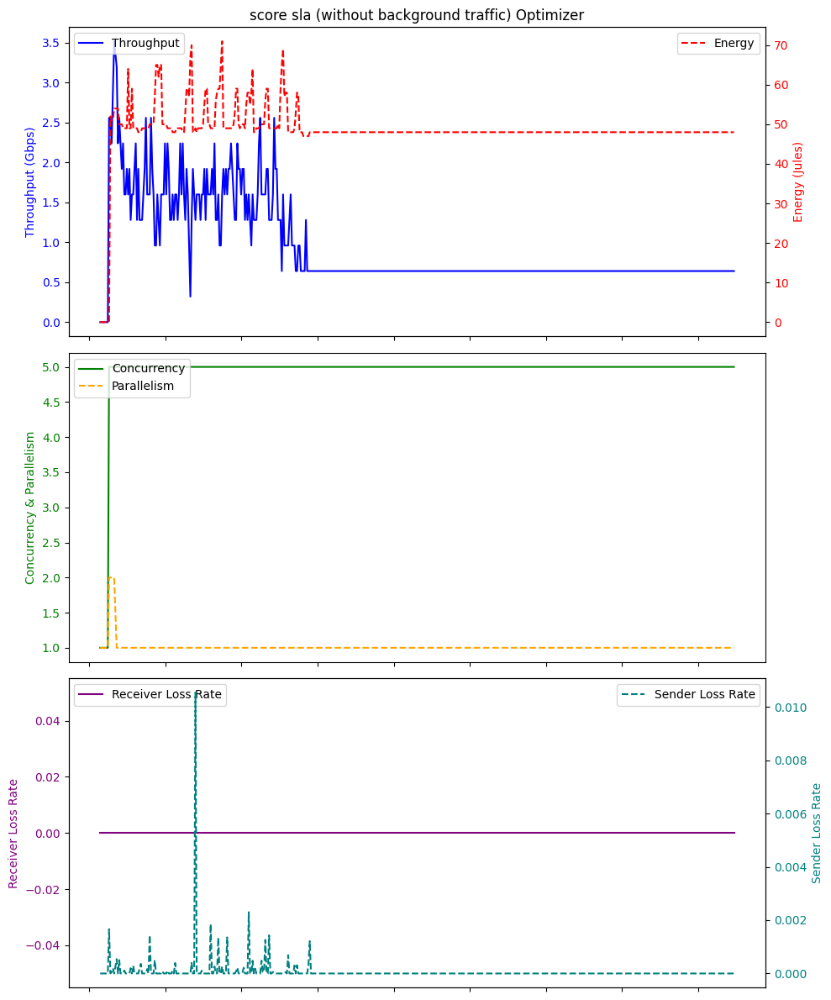

Average Throughput: 0.9279358717434871
Total Energy: 48.53306613226453
Total loss rate: 6.564800557629819e-05


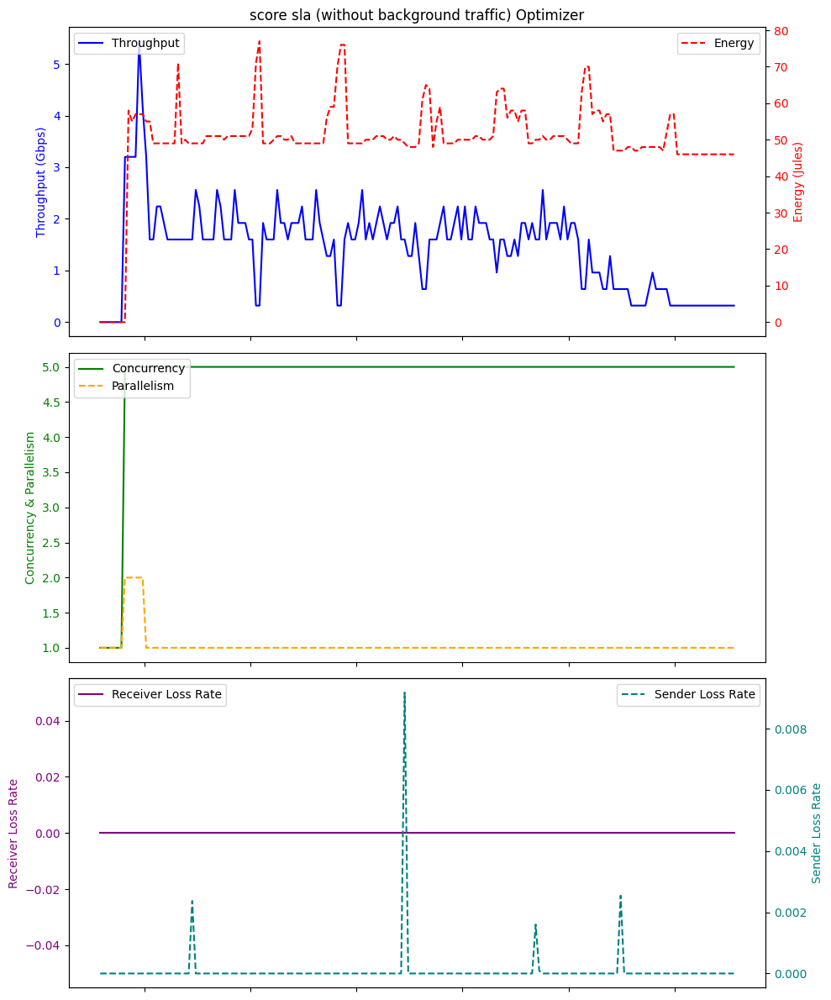

Average Throughput: 1.4364444444444444
Total Energy: 49.63333333333333
Total loss rate: 8.765149223219391e-05


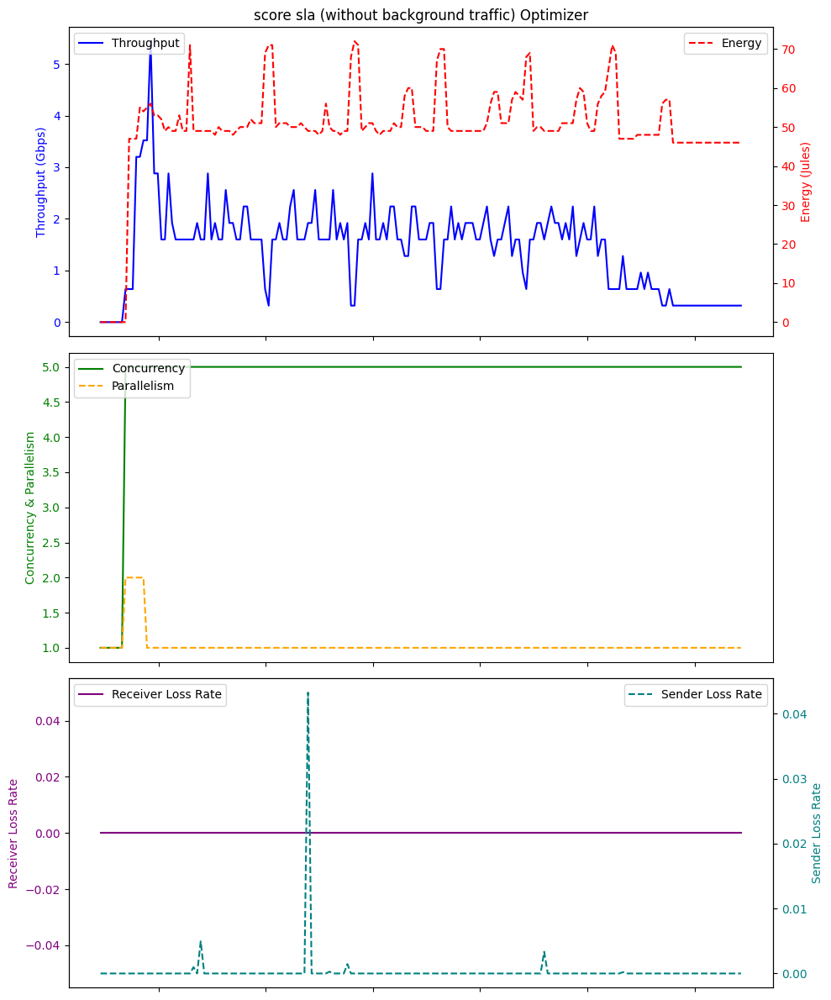

Average Throughput: 1.4417777777777776
Total Energy: 49.583333333333336
Total loss rate: 0.00030266710517804483


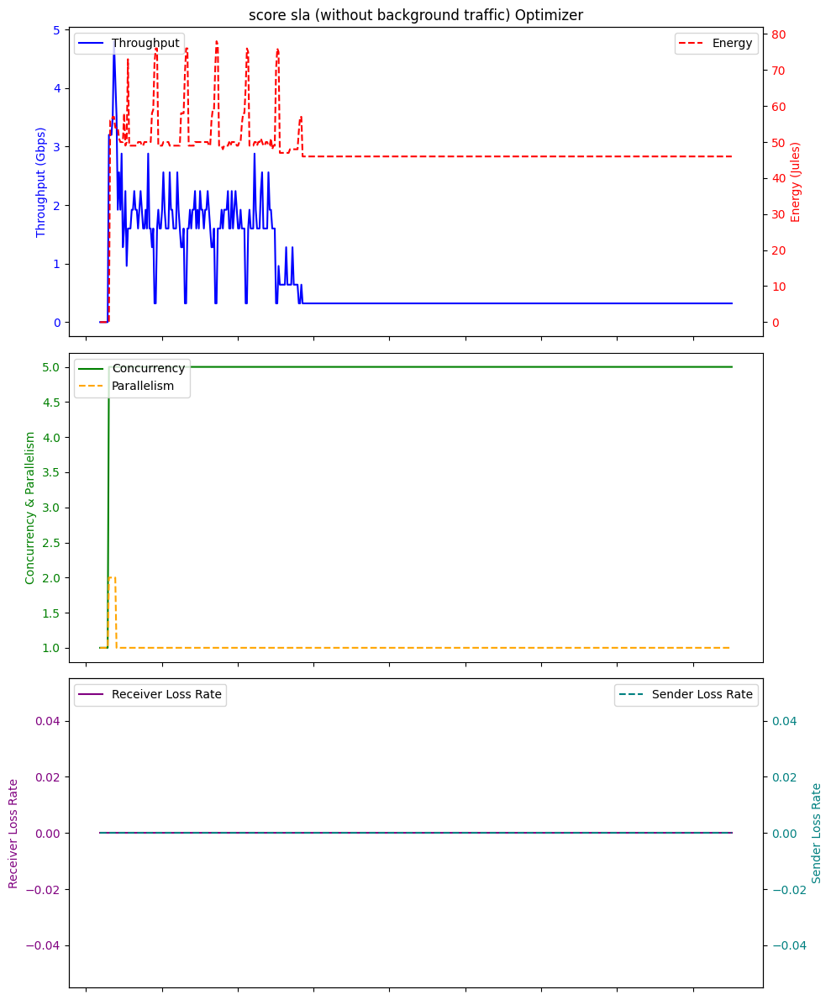

Average Throughput: 0.7251200000000001
Total Energy: 47.36
Total loss rate: 0.0


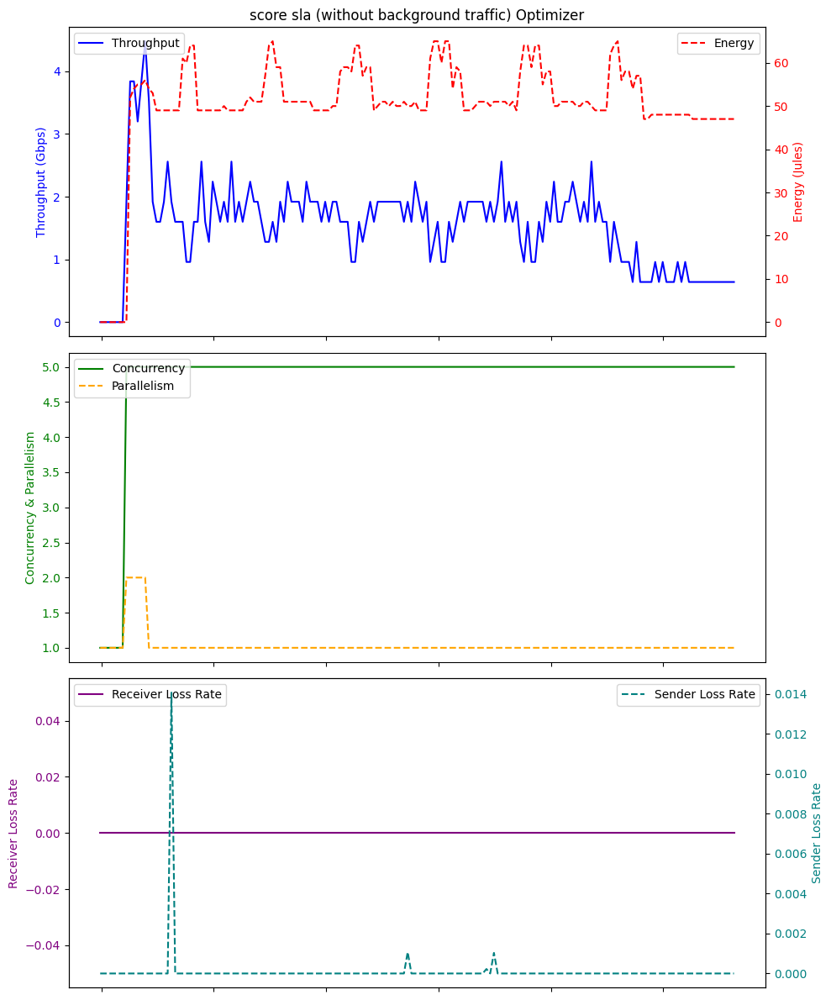

Average Throughput: 1.536
Total Energy: 50.17058823529412
Total loss rate: 9.637870385793708e-05


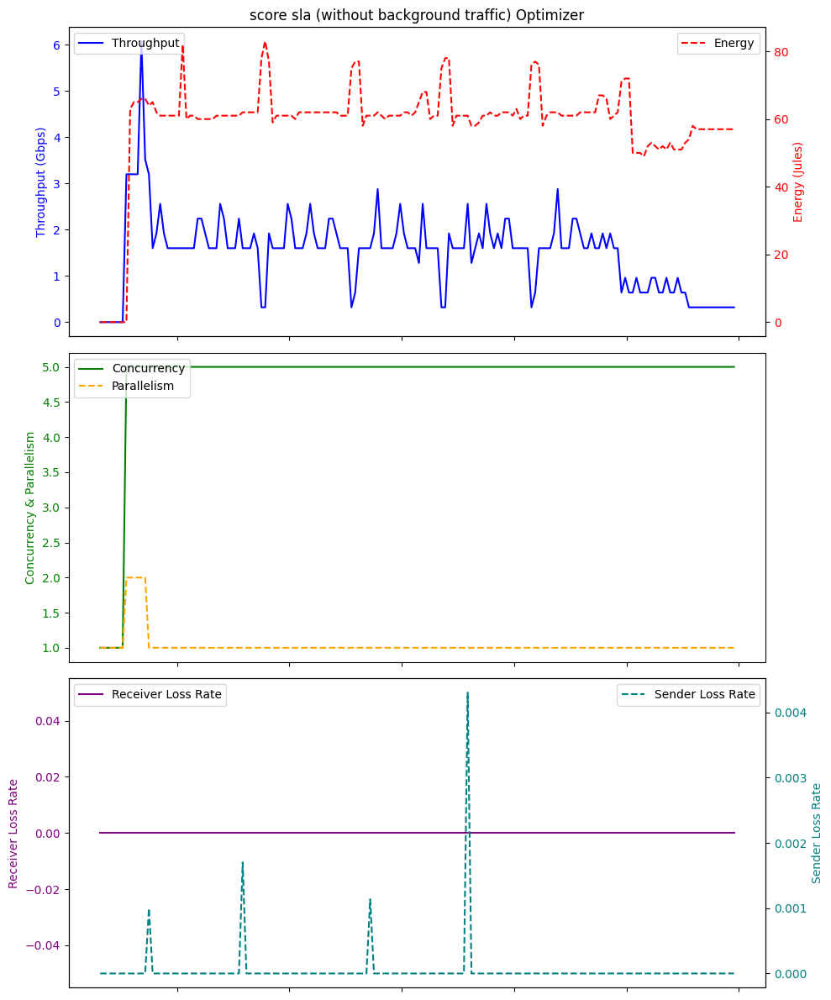

Average Throughput: 1.5096470588235293
Total Energy: 58.811764705882354
Total loss rate: 4.785520911399385e-05


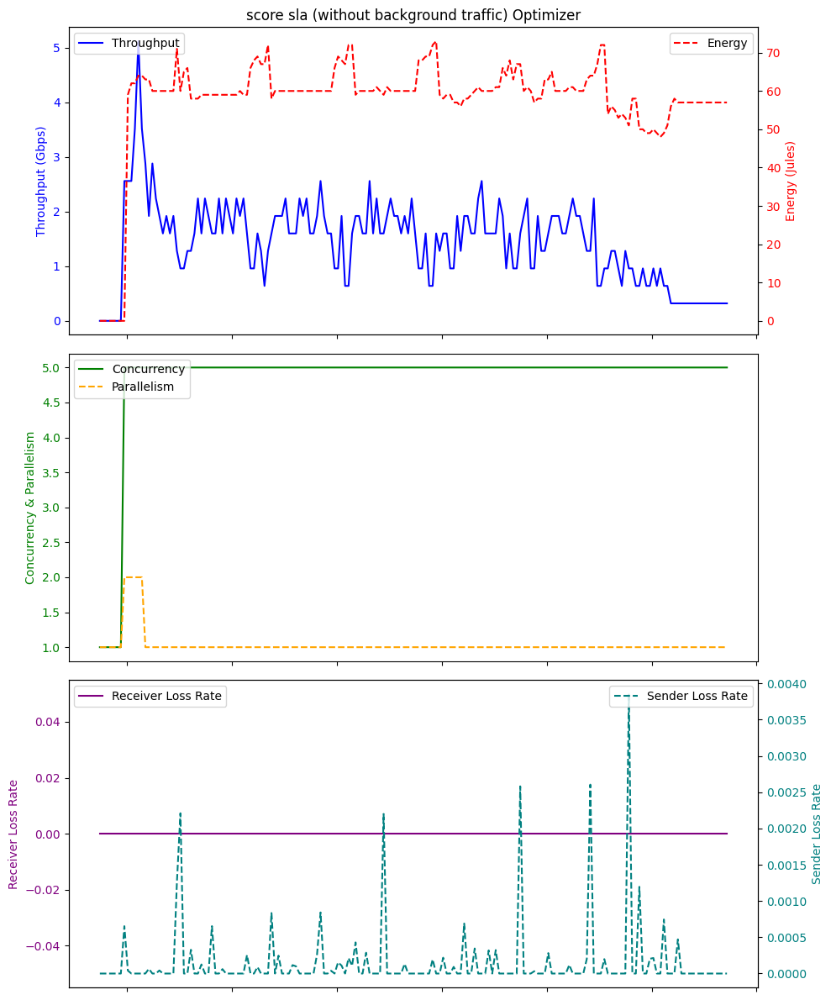

Average Throughput: 1.4382222222222223
Total Energy: 57.62777777777778
Total loss rate: 0.00014856136507002566


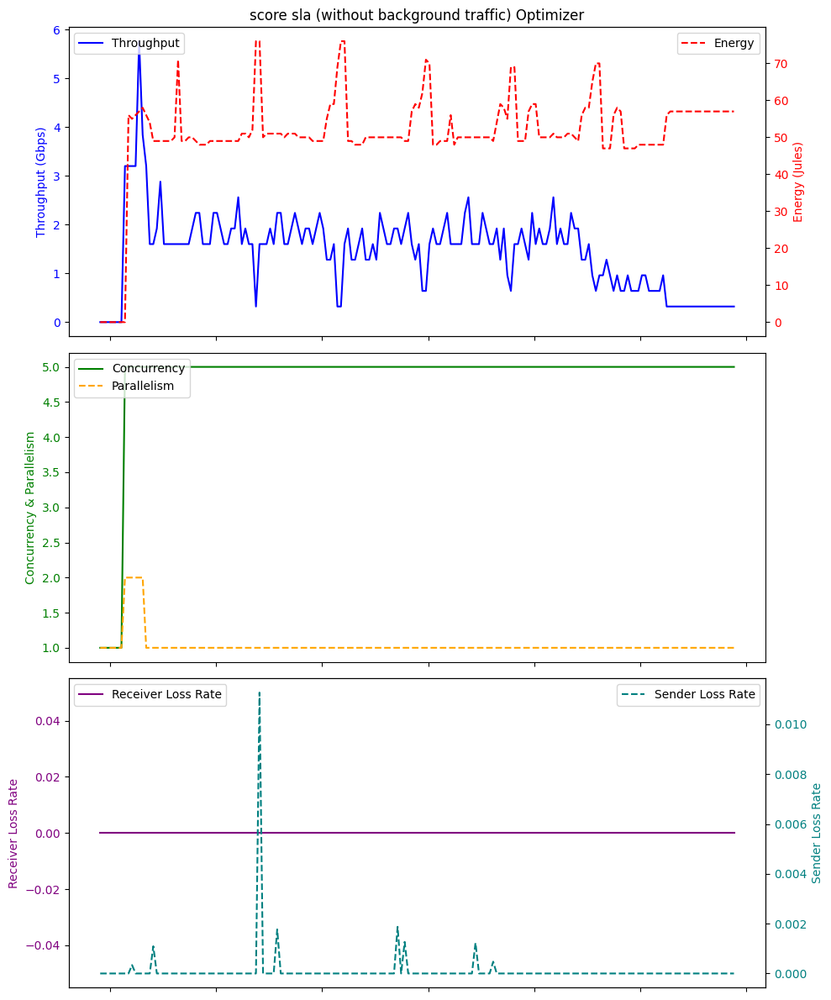

Average Throughput: 1.4506666666666668
Total Energy: 50.8
Total loss rate: 0.00010733249902219915


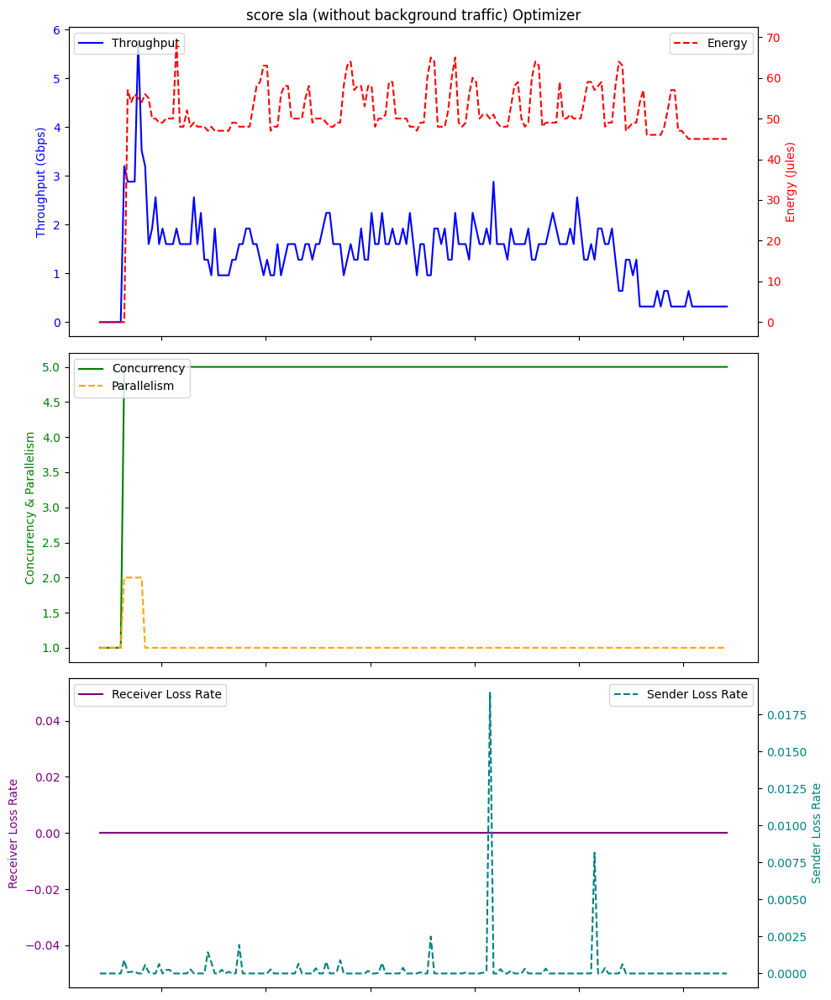

Average Throughput: 1.4214364640883976
Total Energy: 49.469613259668506
Total loss rate: 0.0002447754421618525


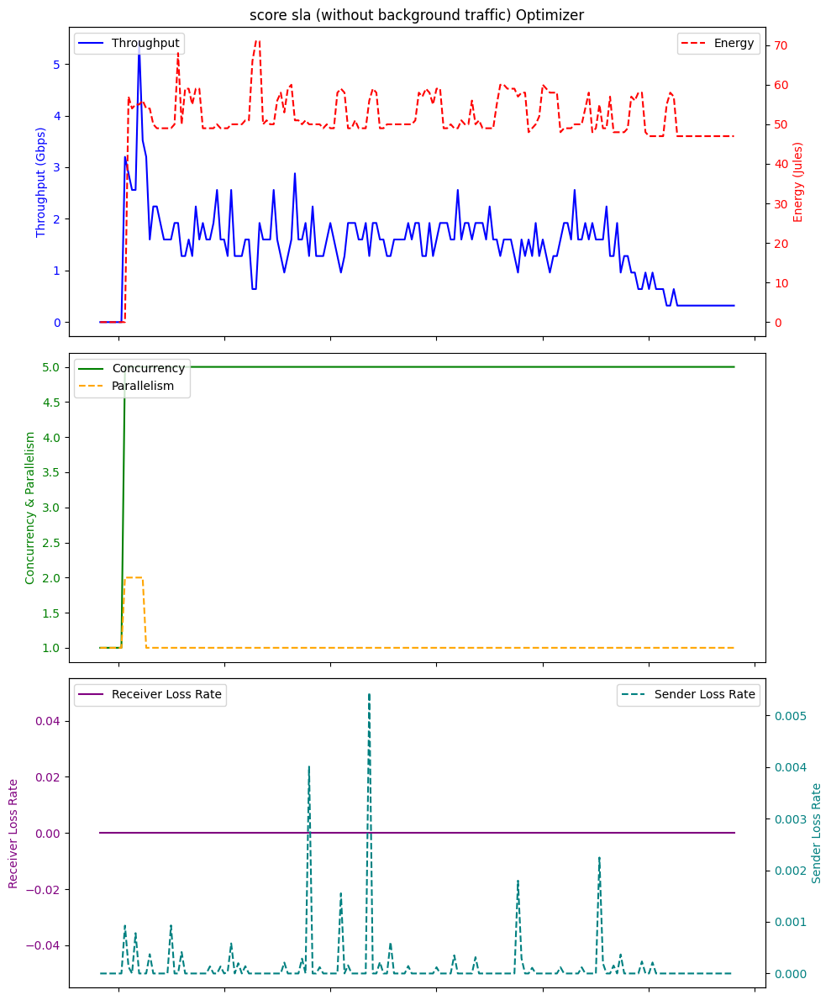

Average Throughput: 1.4435555555555557
Total Energy: 49.888888888888886
Total loss rate: 0.00013428948105222198


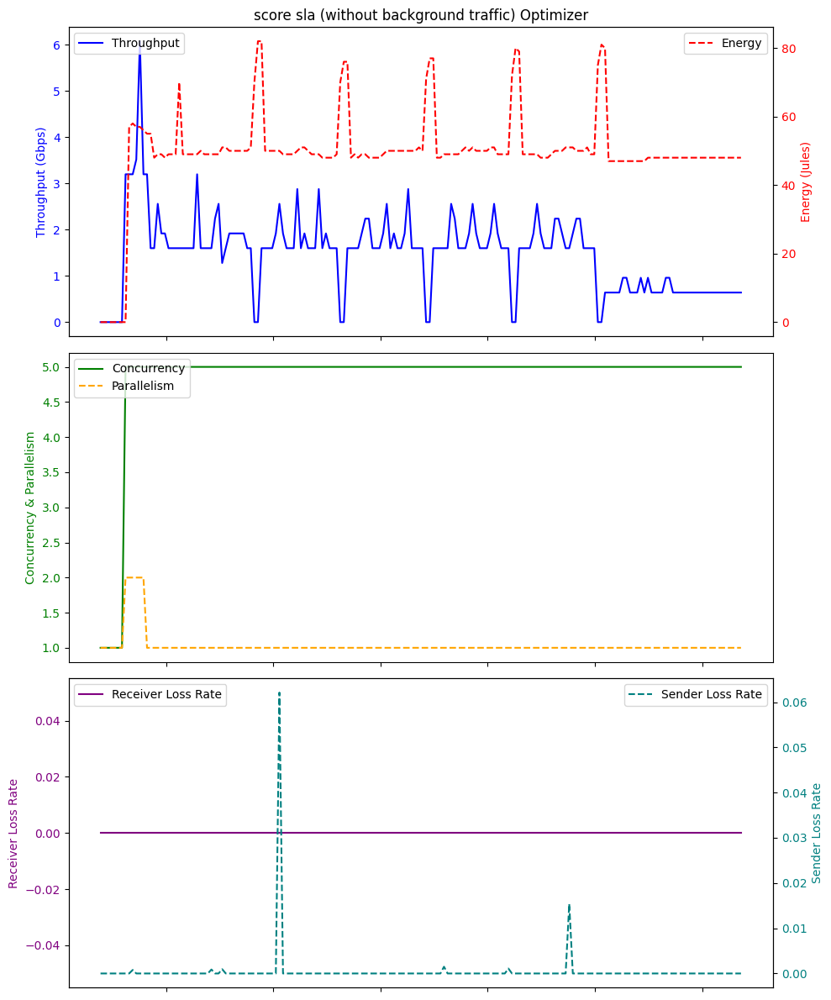

Average Throughput: 1.4720000000000002
Total Energy: 49.51111111111111
Total loss rate: 0.00045939902782255197


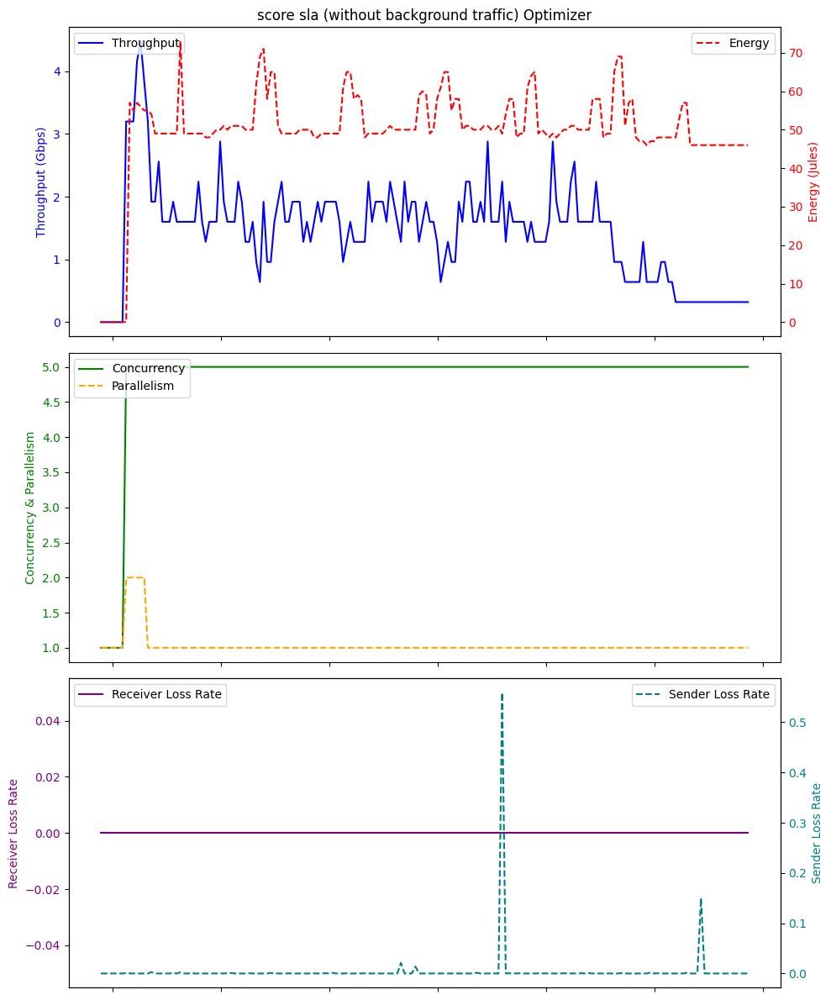

Average Throughput: 1.4346666666666668
Total Energy: 49.68888888888889
Total loss rate: 0.004266563228155283


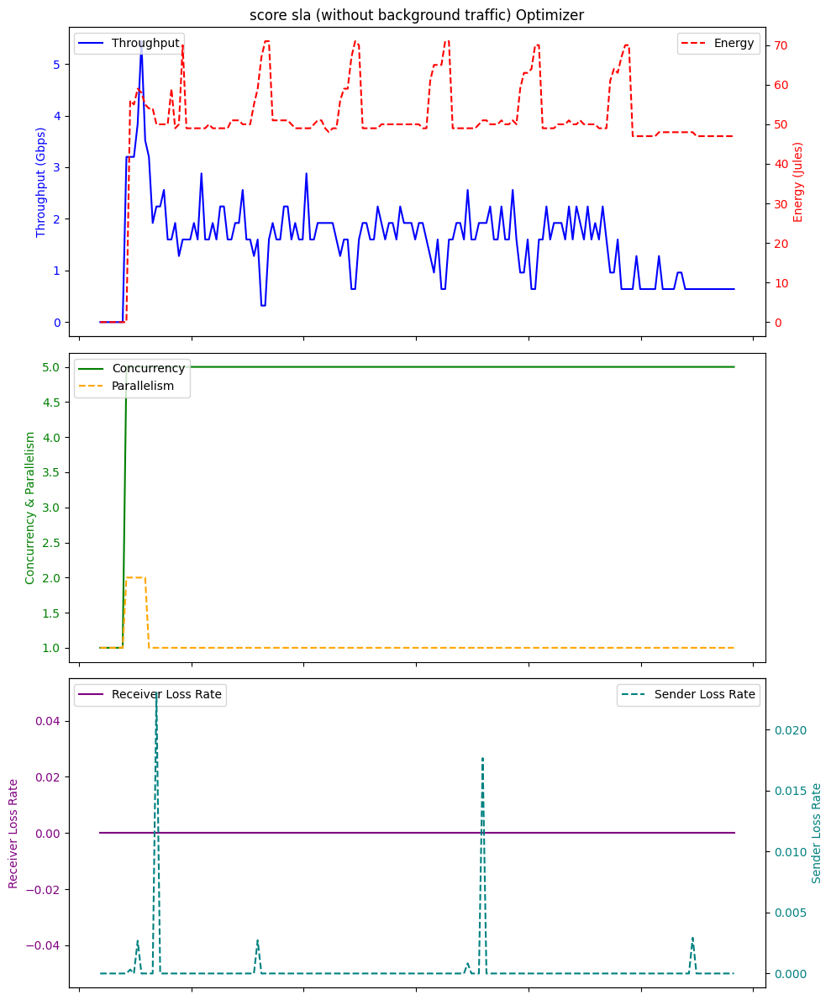

Average Throughput: 1.536
Total Energy: 50.03529411764706
Total loss rate: 0.0002951289019368964


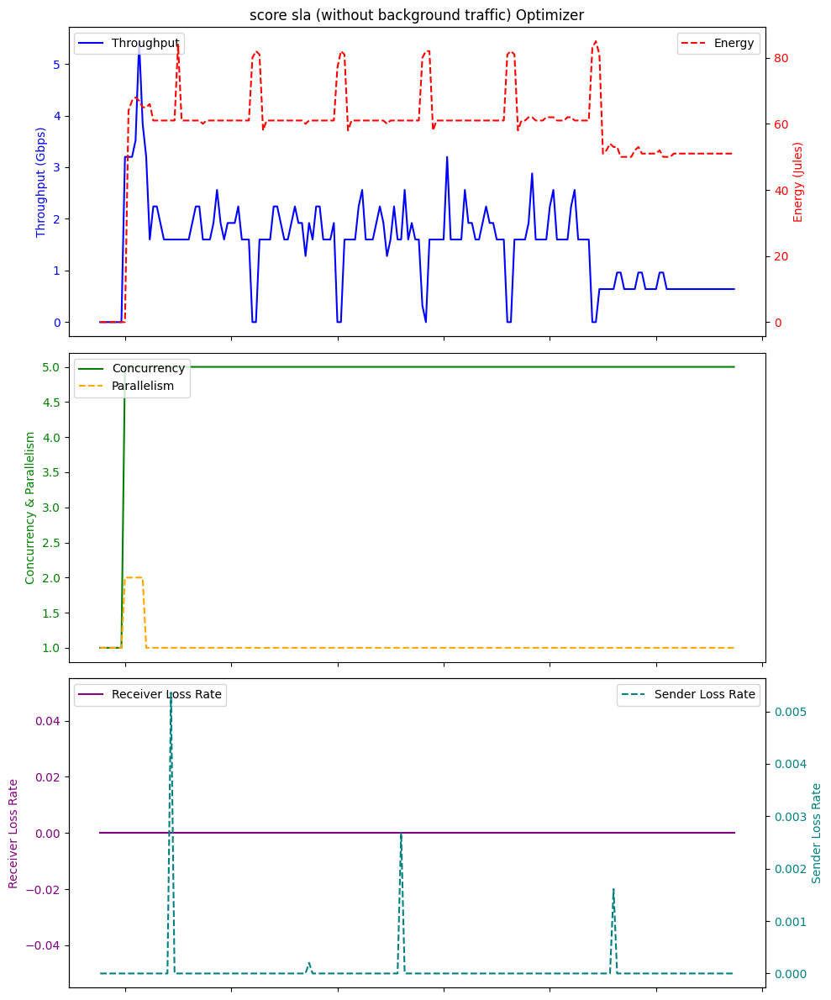

Average Throughput: 1.4737777777777783
Total Energy: 58.17777777777778
Total loss rate: 5.4785740168213997e-05


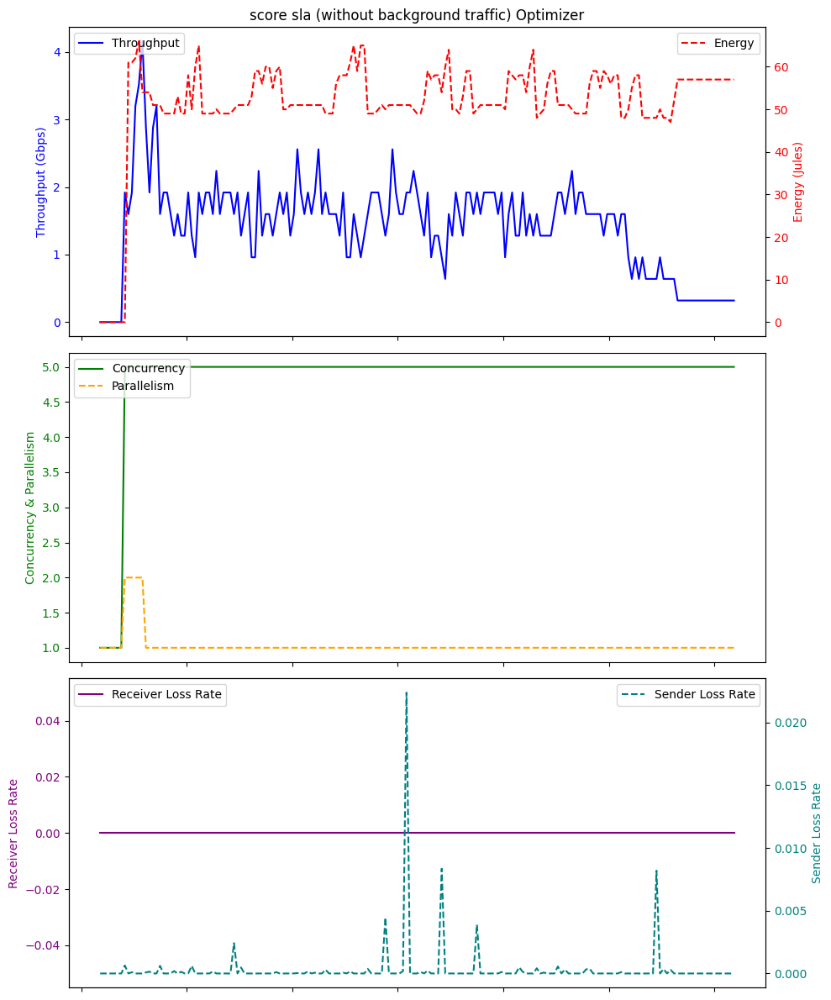

Average Throughput: 1.4320441988950272
Total Energy: 51.28729281767956
Total loss rate: 0.00032134546298327835


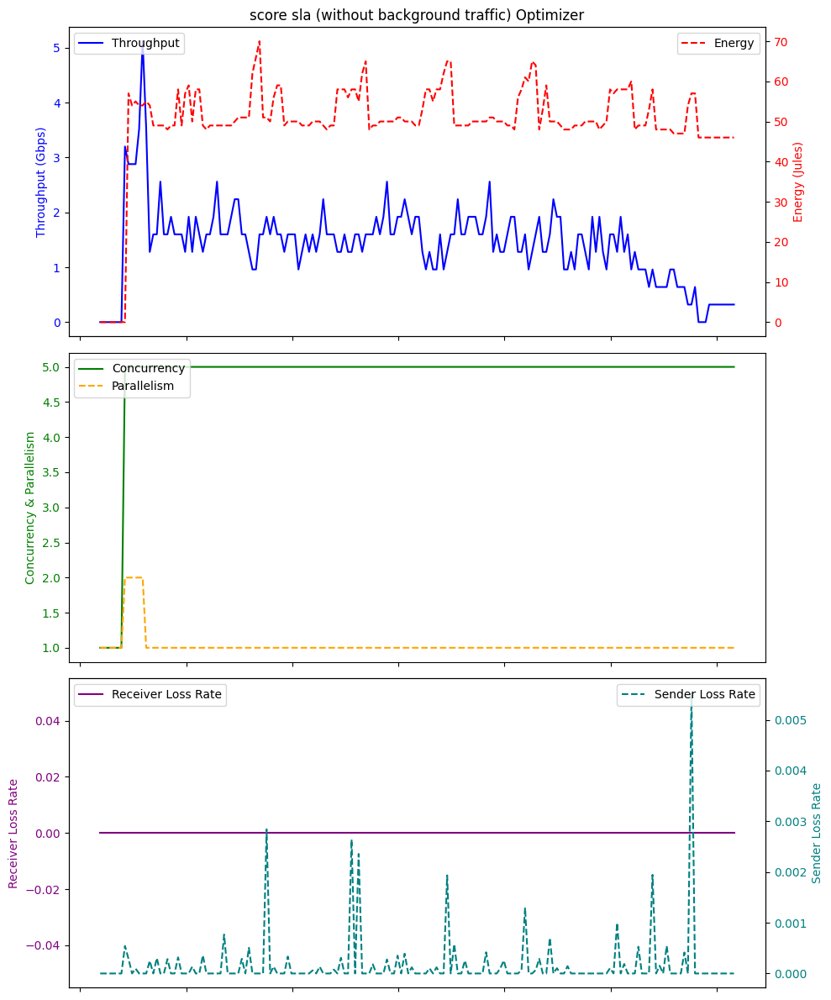

Average Throughput: 1.424
Total Energy: 49.71111111111111
Total loss rate: 0.00017320707735063792


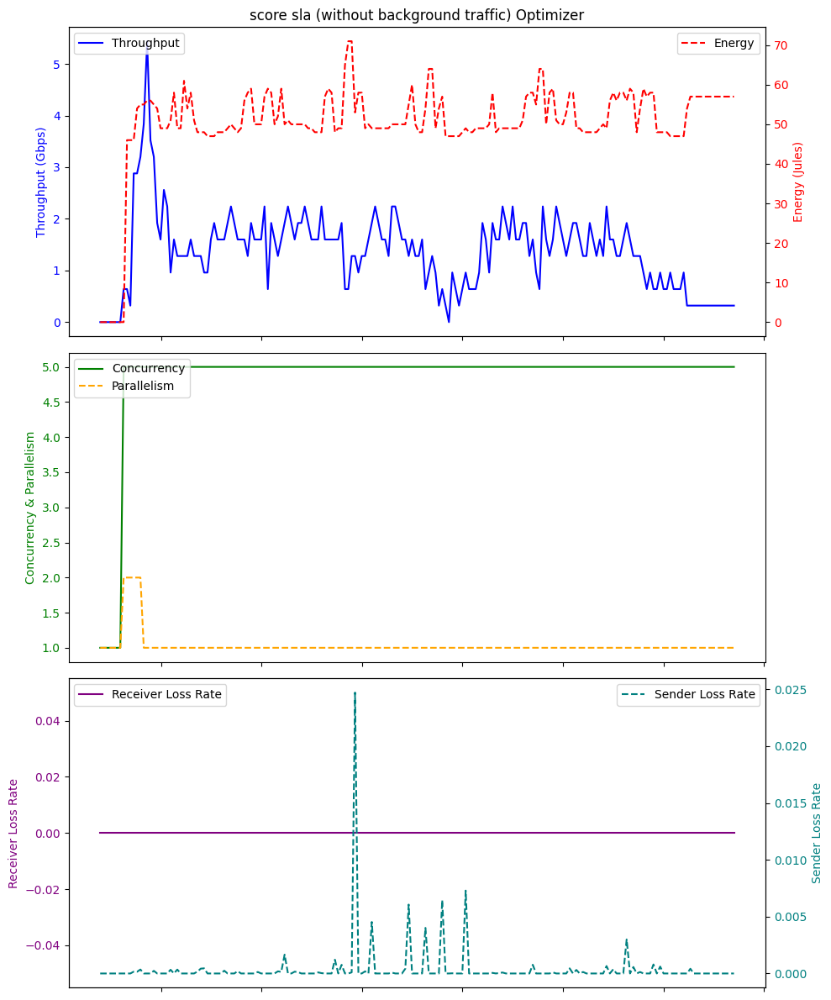

Average Throughput: 1.3608421052631576
Total Energy: 50.22631578947368
Total loss rate: 0.0003678237965045819


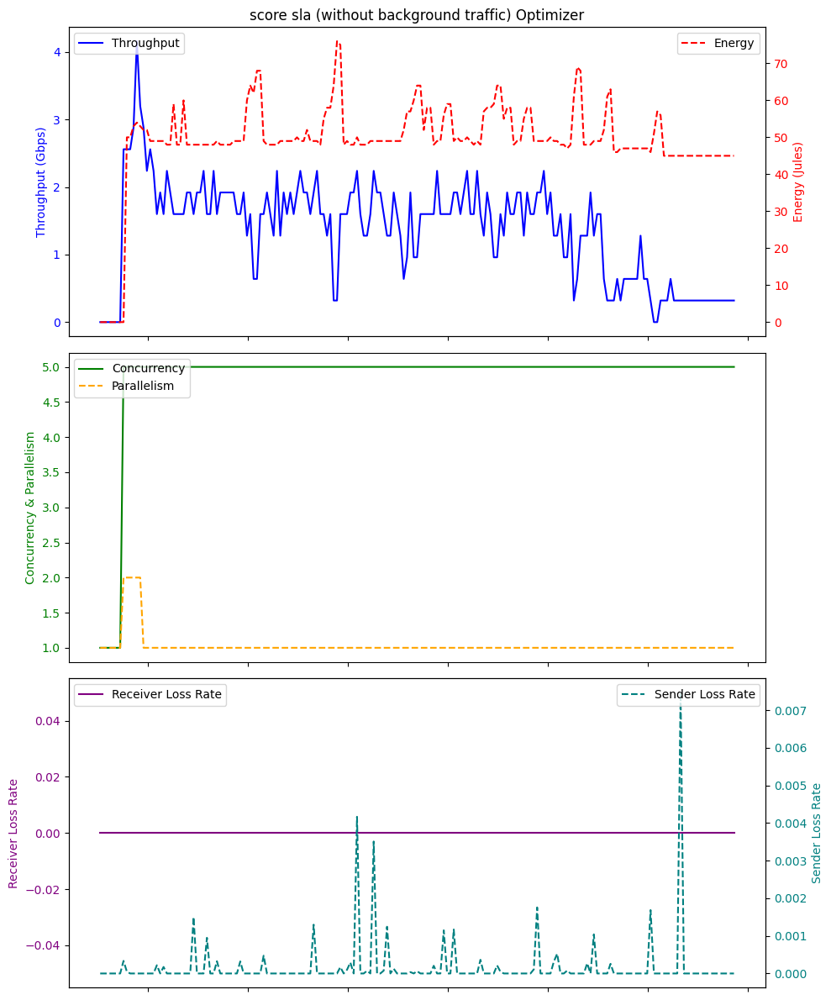

Average Throughput: 1.3620942408376961
Total Energy: 48.952879581151834
Total loss rate: 0.0001682829603913512


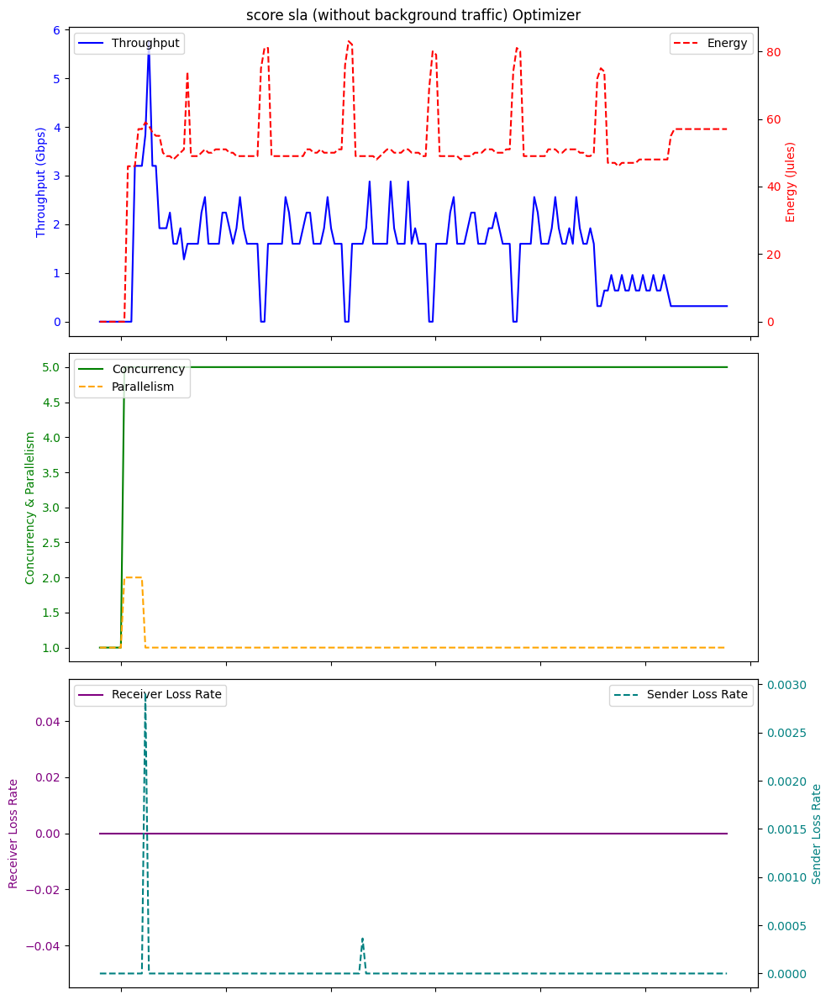

Average Throughput: 1.4382222222222223
Total Energy: 50.62777777777778
Total loss rate: 1.8187267297146667e-05


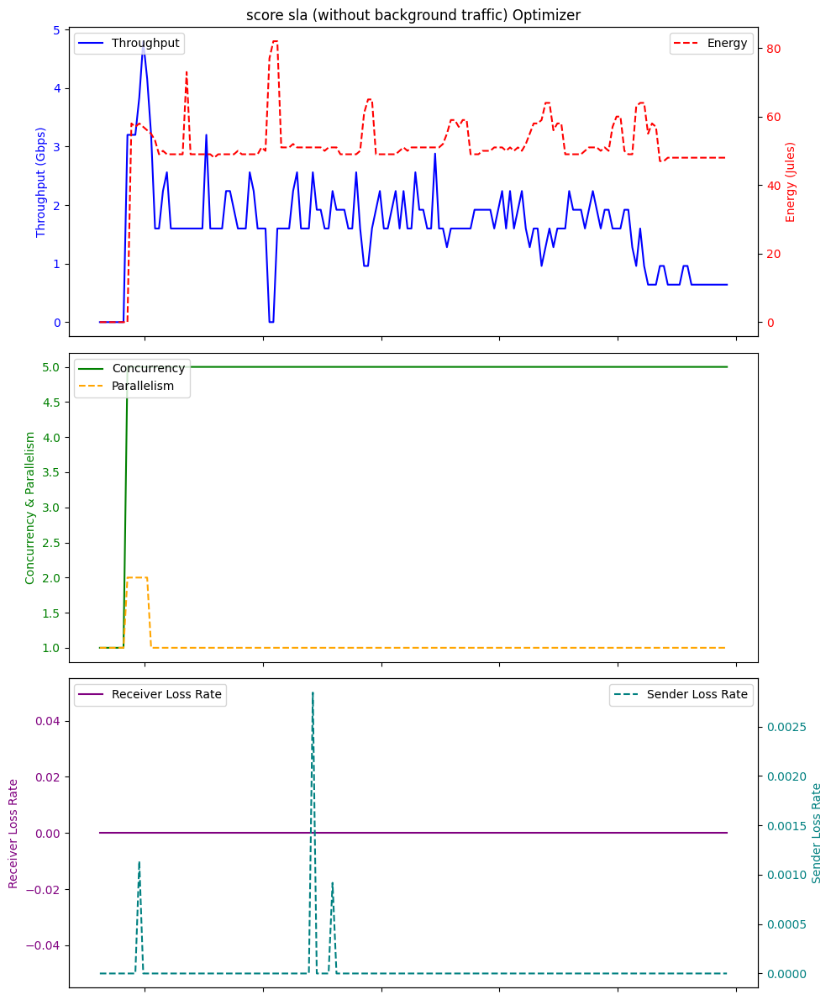

Average Throughput: 1.614
Total Energy: 49.8125
Total loss rate: 3.063096438918202e-05


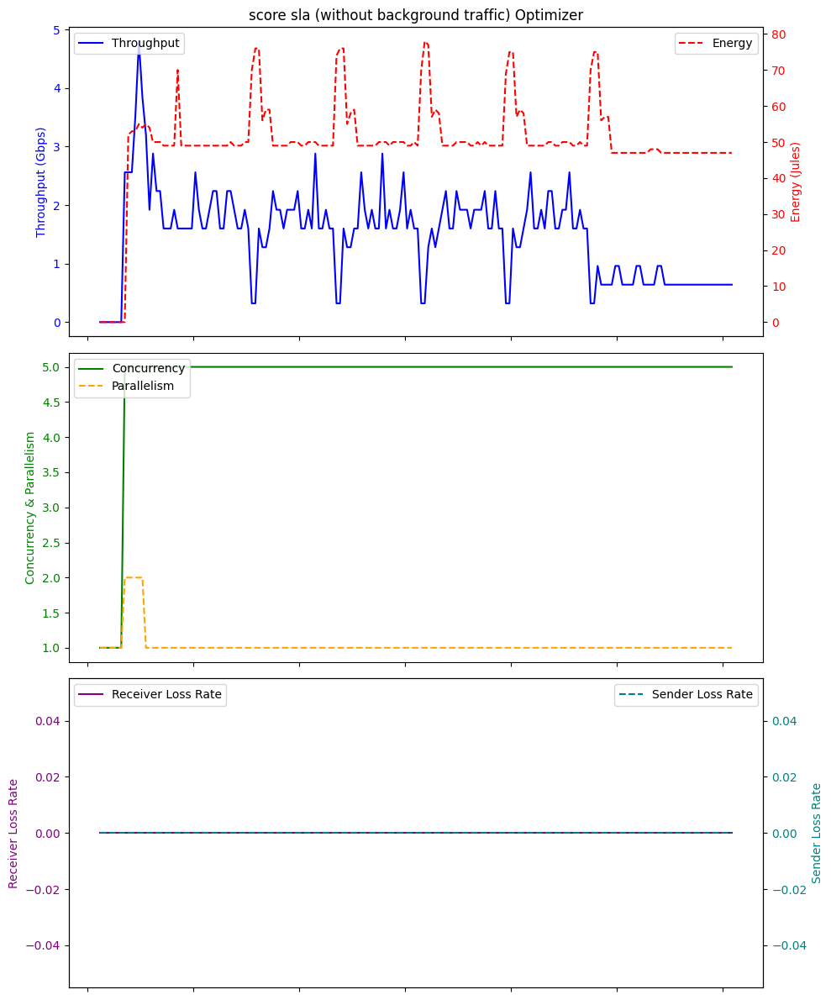

Average Throughput: 1.4737777777777776
Total Energy: 49.73888888888889
Total loss rate: 0.0


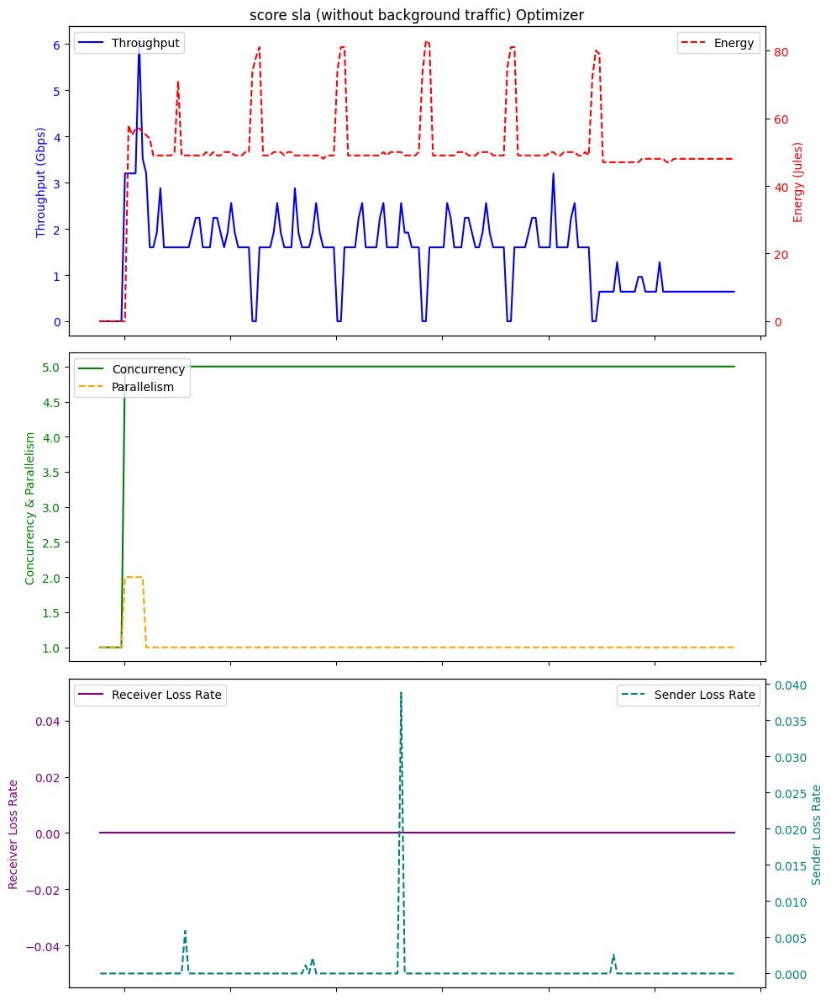

Average Throughput: 1.4737777777777779
Total Energy: 49.55555555555556
Total loss rate: 0.00028137720792176295


In [2]:
# Example usage score sla
directory = './logFileDir/ppo_score_sla_MA_ID/'
dfs = process_log_files(directory,"ppo_score_sla_MA_ID_")

ppo_score_sla_MA_ID_throughput_list=[]
ppo_score_sla_MA_ID_energy_list=[]
ppo_score_sla_MA_ID_plr_list=[]
# Print or process the dataframes as needed
for df in dfs:
    # print(df)
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)


    # Top plot with Throughput and Energy
    ax1.plot(df['Time'], df['Throughput'], label='Throughput', color='blue')
    ax1.set_ylabel('Throughput (Gbps)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title('score sla (without background traffic) Optimizer')

    ax2_twin = ax1.twinx()
    ax2_twin.plot(df['Time'], df['Energy'], label='Energy', color='red', linestyle='--')
    ax2_twin.set_ylabel('Energy (Jules)', color='red')
    ax2_twin.tick_params(axis='y', labelcolor='red')

    # Bottom plot with Concurrency, Parallelism, and CC
    ax2.plot(df['Time'], df['Concurrency'], label='Concurrency', color='green')
    ax2.plot(df['Time'], df['Parallelism'], label='Parallelism', color='orange', linestyle='--')
    ax2.set_ylabel('Concurrency & Parallelism', color='green')
    ax2.tick_params(axis='y', labelcolor='green')



    # Bottom plot with Receiver Loss Rate and Sender Loss Rate
    ax3.plot(df['Time'], df['LossRate'], label='Receiver Loss Rate', color='purple', linestyle='-')
    ax3.set_ylabel('Receiver Loss Rate', color='purple')
    ax3.tick_params(axis='y', labelcolor='purple')

    ax4_twin = ax3.twinx()
    ax4_twin.plot(df['Time'], df['SenderLR'], label='Sender Loss Rate', color='teal', linestyle='--')
    ax4_twin.set_ylabel('Sender Loss Rate', color='teal')
    ax4_twin.tick_params(axis='y', labelcolor='teal')

    # Formatting the x-axis to show time correctly
#     ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: (datetime.min + timedelta(seconds=x)).strftime('%H:%M:%S')))
#     ax2.set_xticklabels([])
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])
    # Fix for overlapping layouts
    fig.tight_layout()

    # Legend
    ax1.legend(loc='upper left')
    ax2_twin.legend(loc='upper right')
    ax2.legend(loc='upper left')
    ax3.legend(loc='upper left')
    ax4_twin.legend(loc='upper right')
#     plt.savefig('withBT.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()

    average_throughput = df['Throughput'].mean()
    print("Average Throughput:", average_throughput)
    total_energy = df['Energy'].mean()
    print("Total Energy:", total_energy)
    total_plr = df['SenderLR'].mean()
    print("Total loss rate:", total_plr)

    ppo_score_sla_MA_ID_throughput_list.append(average_throughput)
    ppo_score_sla_MA_ID_energy_list.append(total_energy)
    ppo_score_sla_MA_ID_plr_list.append(total_plr)

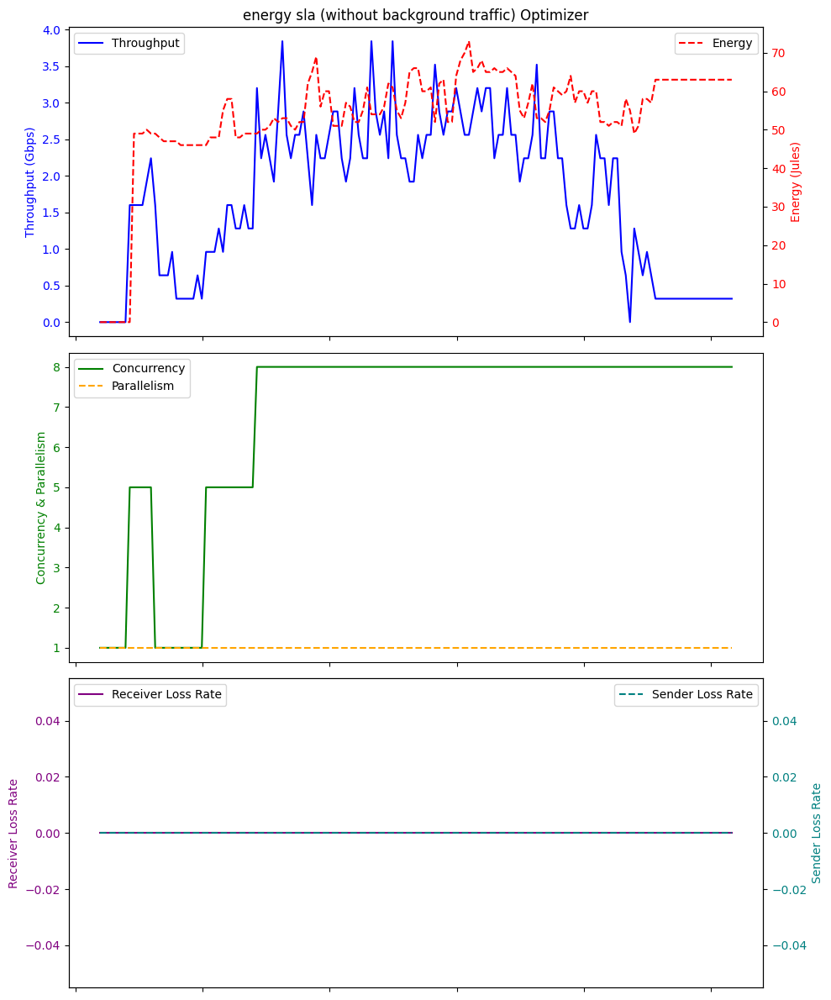

Average Throughput: 1.723733333333333
Total Energy: 53.57333333333333
Total loss rate: 0.0


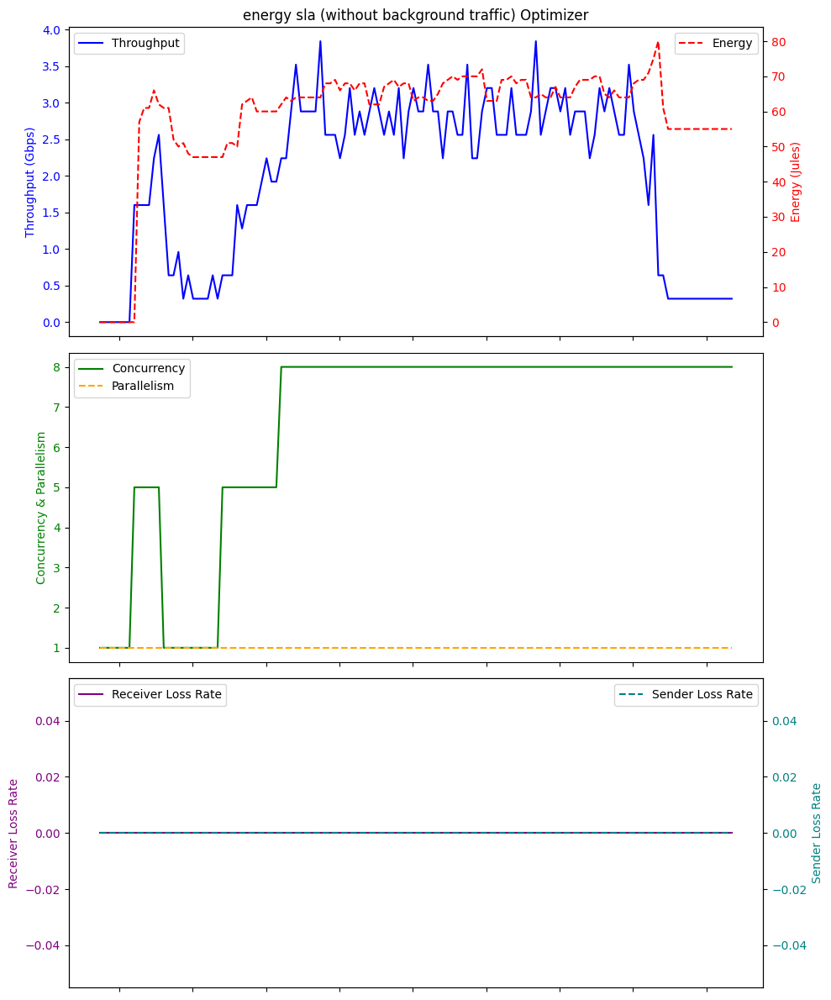

Average Throughput: 1.979076923076923
Total Energy: 58.707692307692305
Total loss rate: 0.0


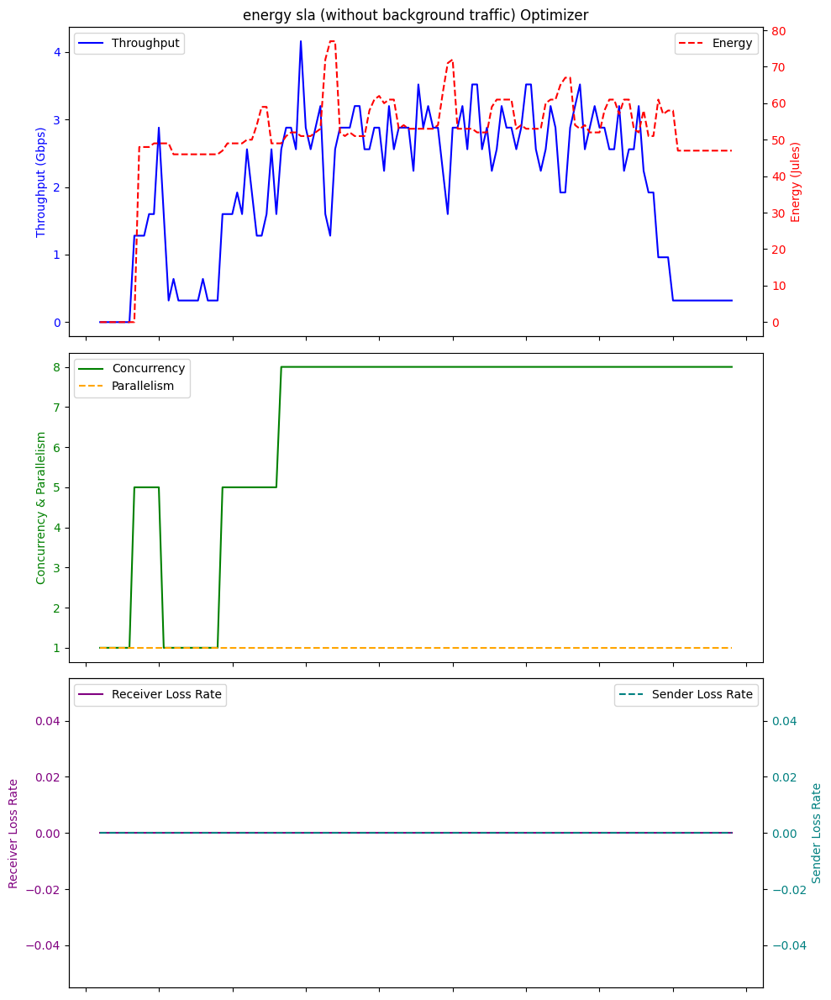

Average Throughput: 1.9716923076923076
Total Energy: 50.51538461538462
Total loss rate: 0.0


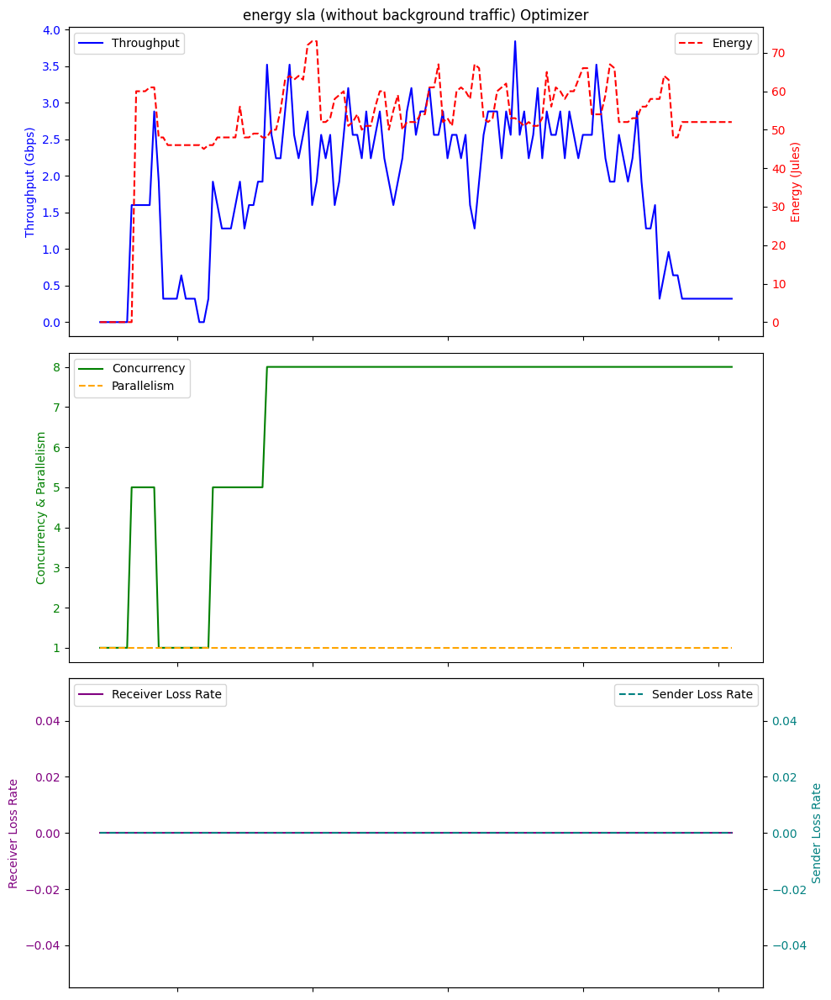

Average Throughput: 1.8246808510638295
Total Energy: 51.87234042553192
Total loss rate: 0.0


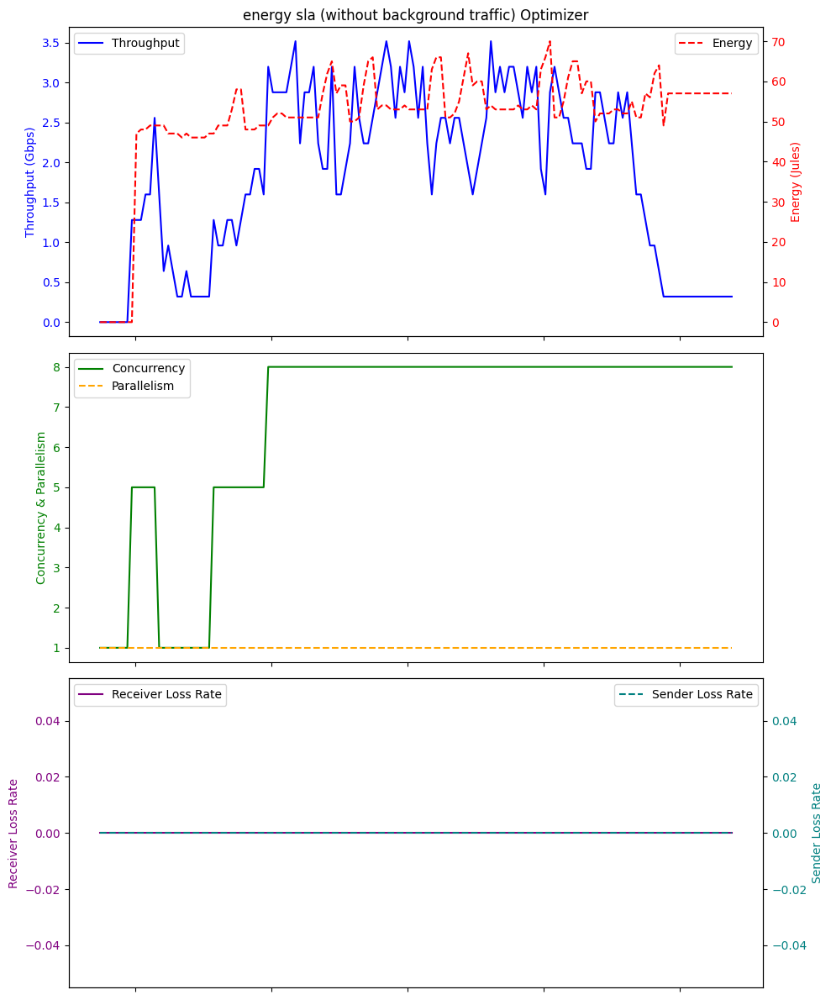

Average Throughput: 1.8377142857142854
Total Energy: 51.07142857142857
Total loss rate: 0.0


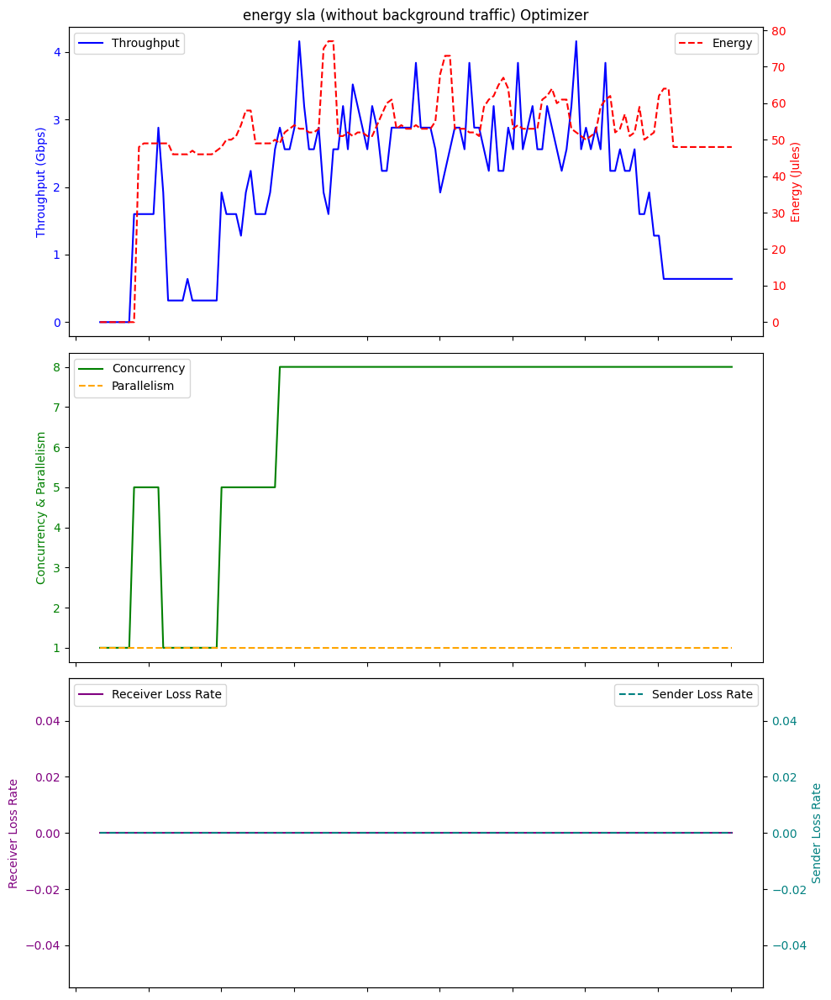

Average Throughput: 1.9883969465648856
Total Energy: 50.52671755725191
Total loss rate: 0.0


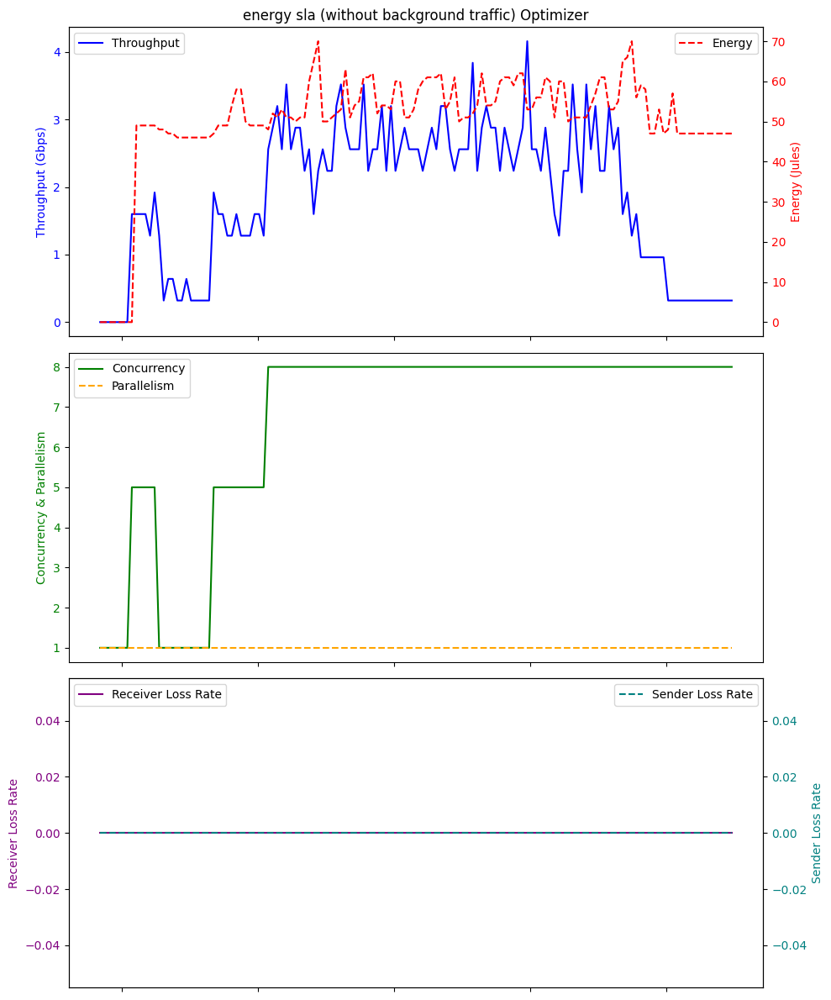

Average Throughput: 1.84
Total Energy: 50.27857142857143
Total loss rate: 0.0


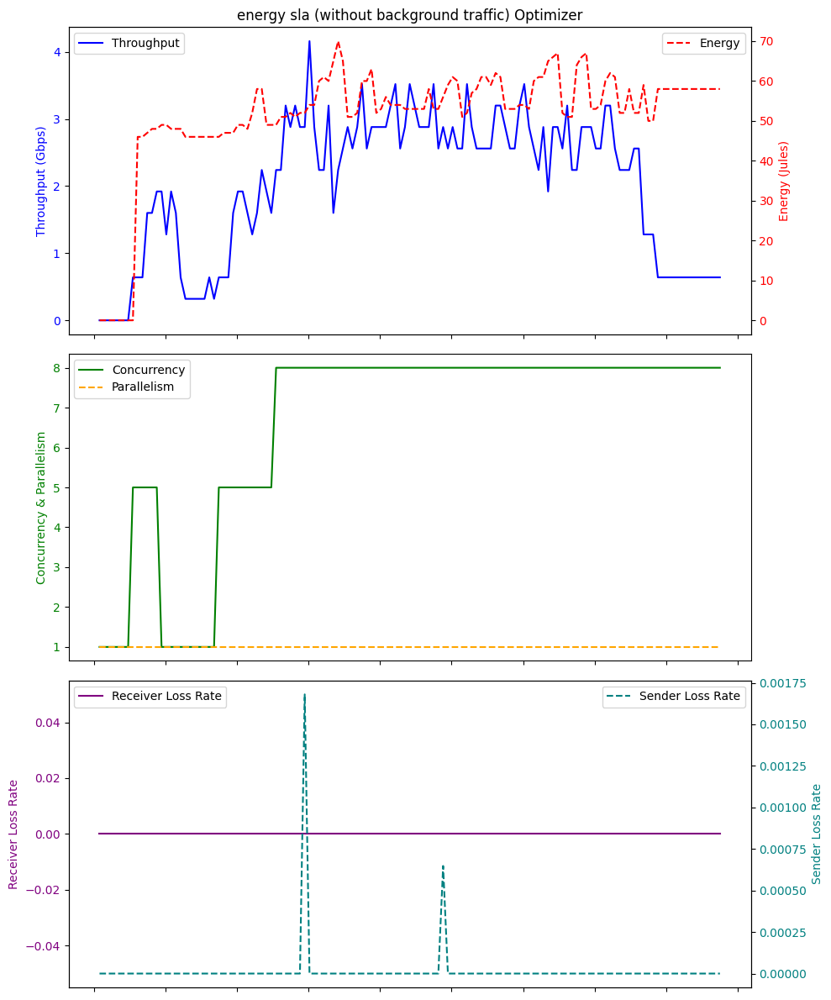

Average Throughput: 1.9981679389312976
Total Energy: 51.3206106870229
Total loss rate: 1.7771037776927416e-05


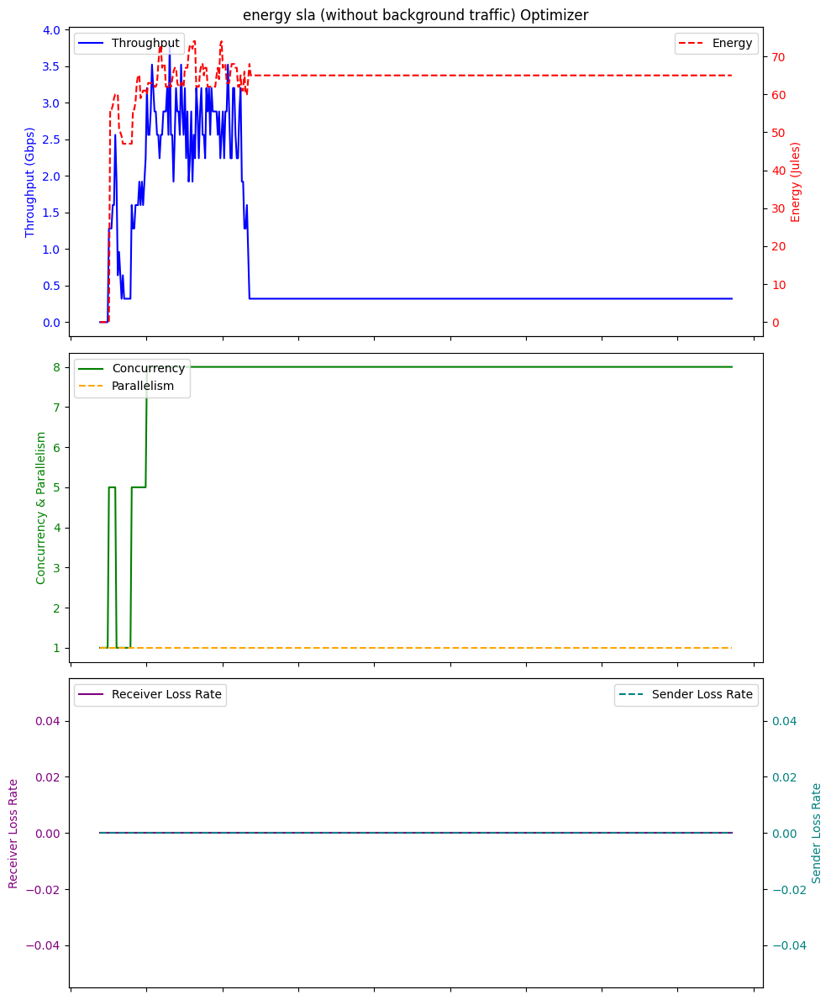

Average Throughput: 0.7487999999999999
Total Energy: 63.438
Total loss rate: 0.0


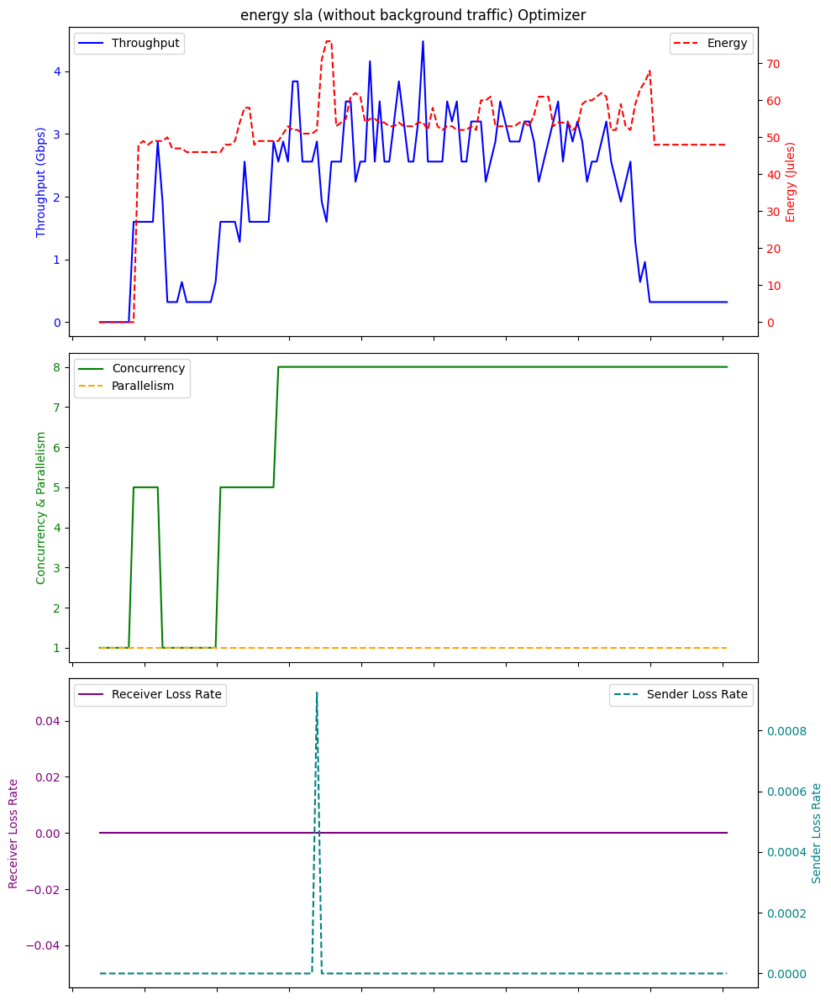

Average Throughput: 1.9712977099236642
Total Energy: 49.93893129770992
Total loss rate: 7.0609859563609005e-06


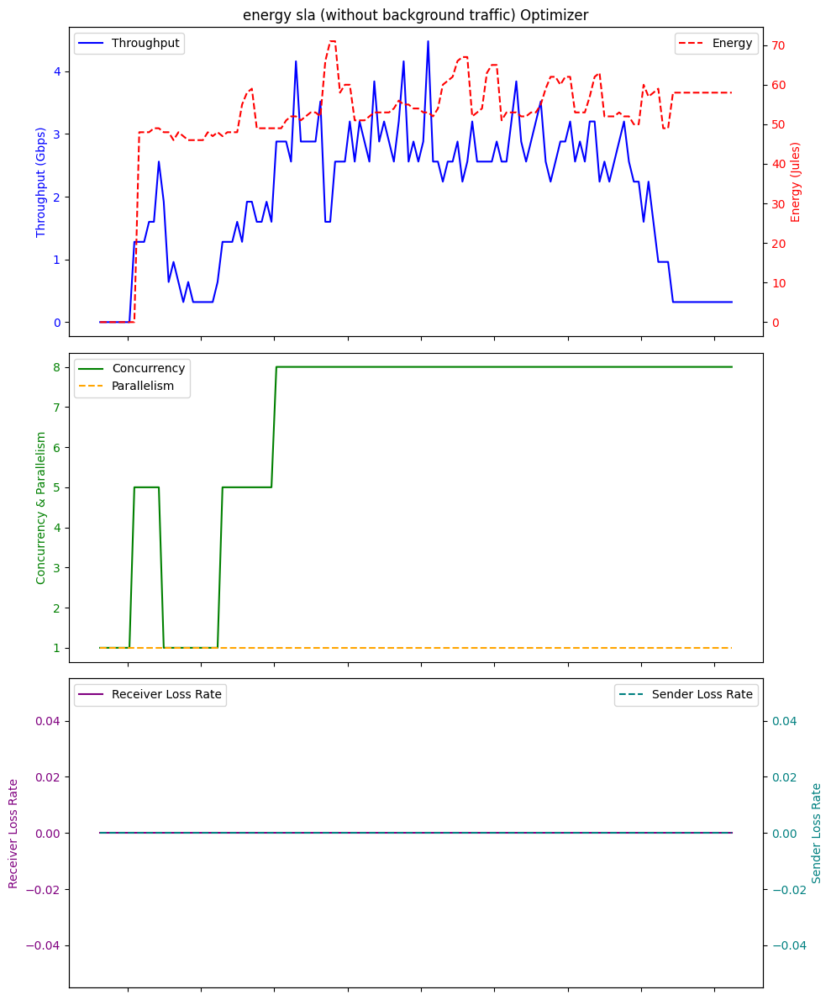

Average Throughput: 1.9815384615384617
Total Energy: 51.06923076923077
Total loss rate: 0.0


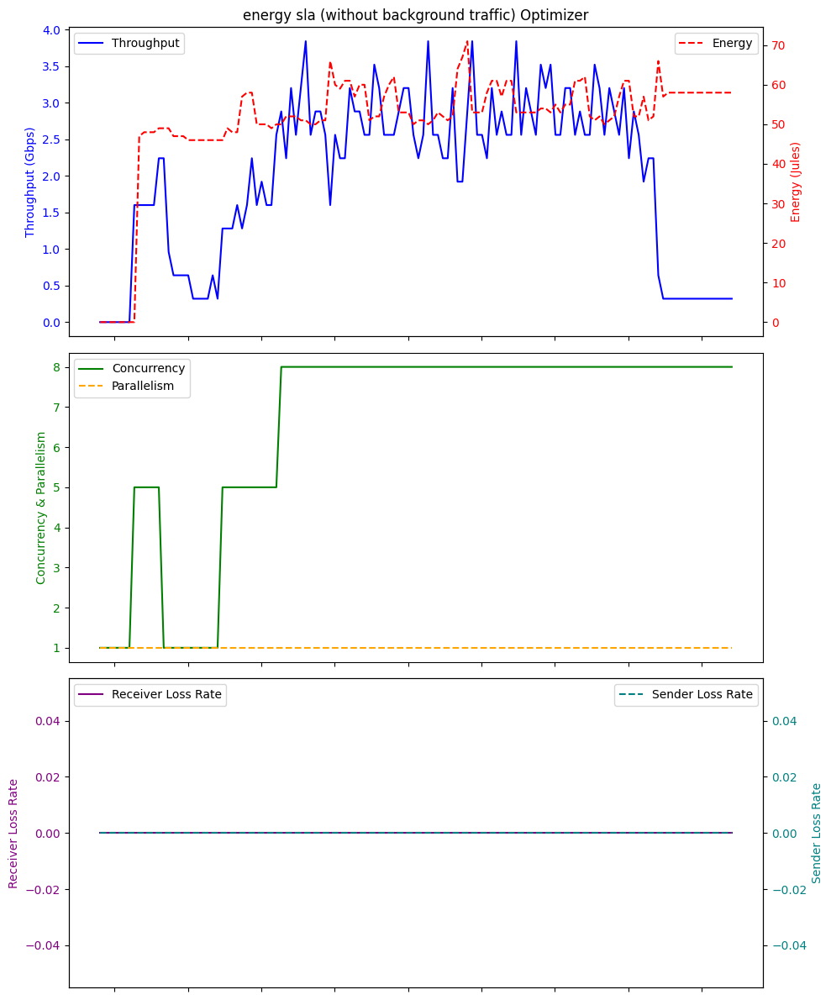

Average Throughput: 1.9766153846153849
Total Energy: 50.738461538461536
Total loss rate: 0.0


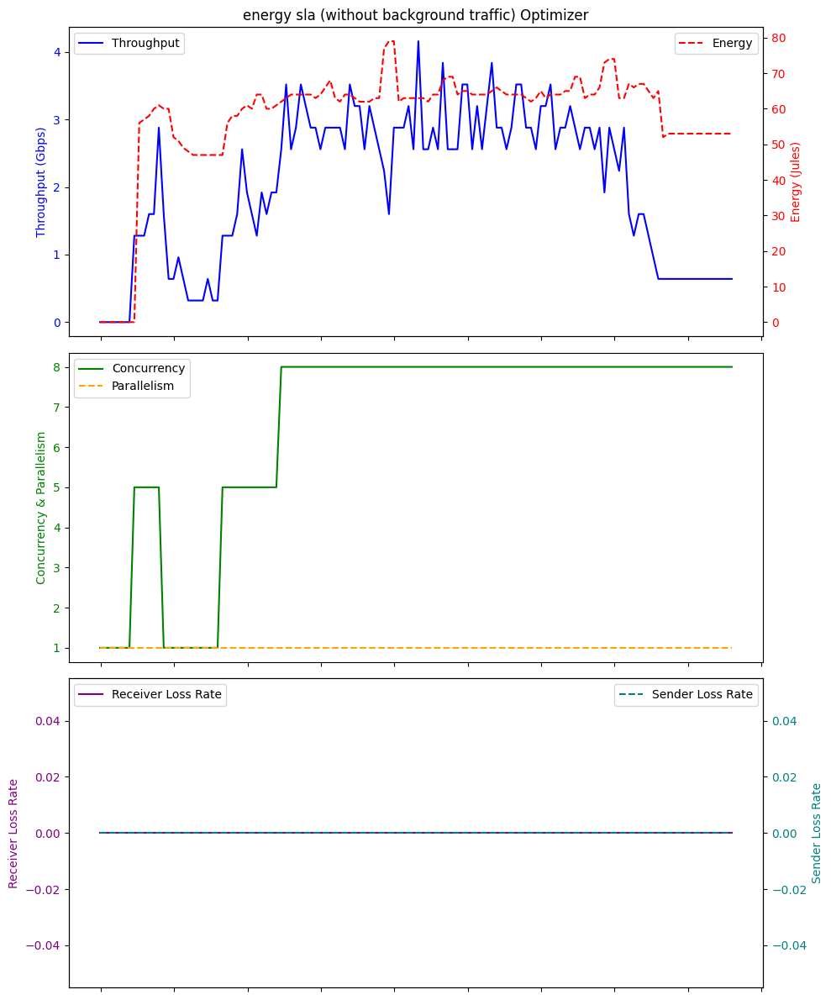

Average Throughput: 2.011076923076923
Total Energy: 57.54615384615385
Total loss rate: 0.0


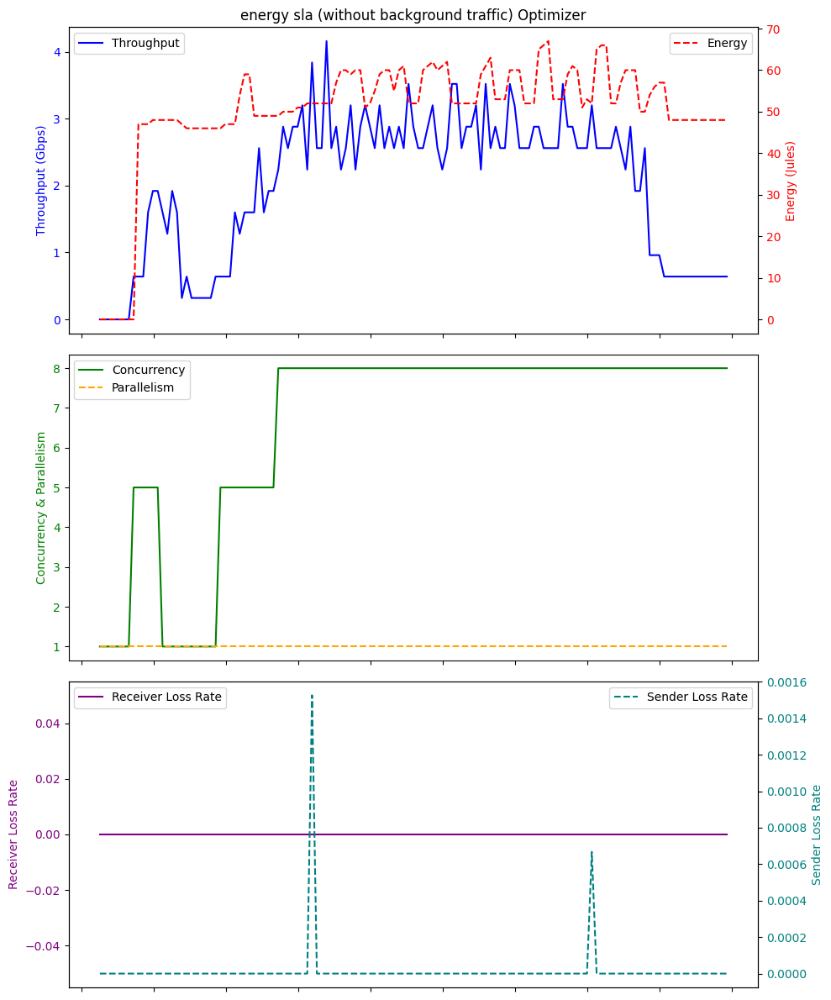

Average Throughput: 1.9835114503816793
Total Energy: 50.19083969465649
Total loss rate: 1.6742954986580093e-05


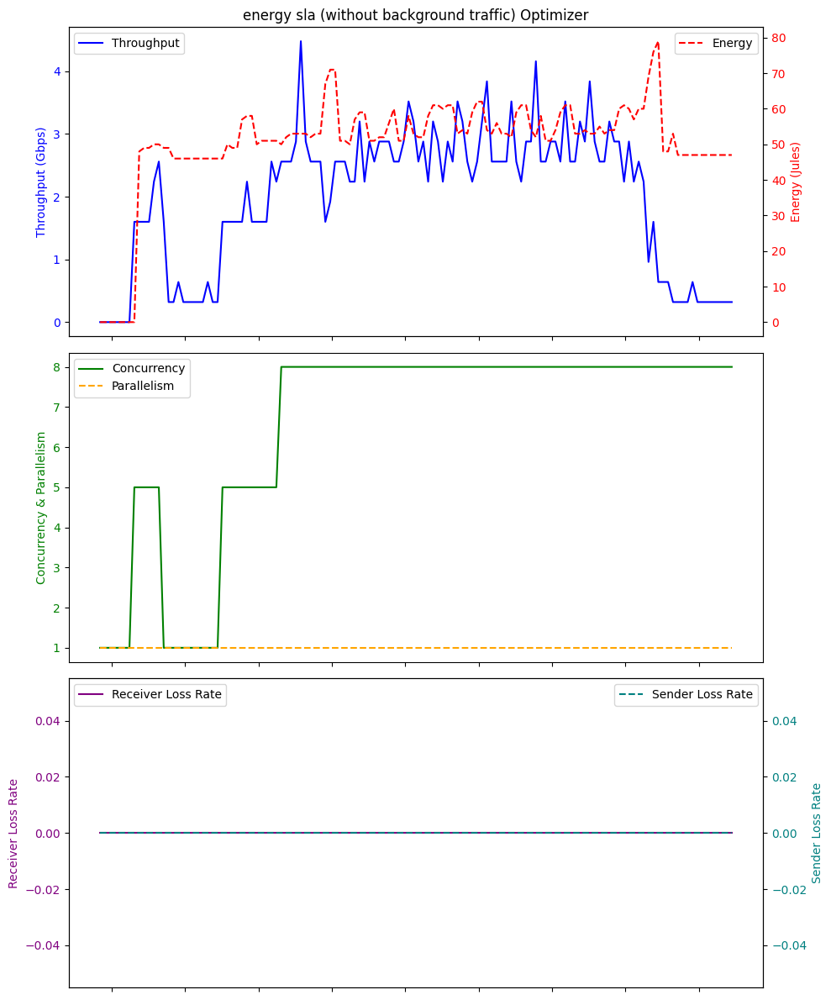

Average Throughput: 1.961846153846154
Total Energy: 50.43846153846154
Total loss rate: 0.0


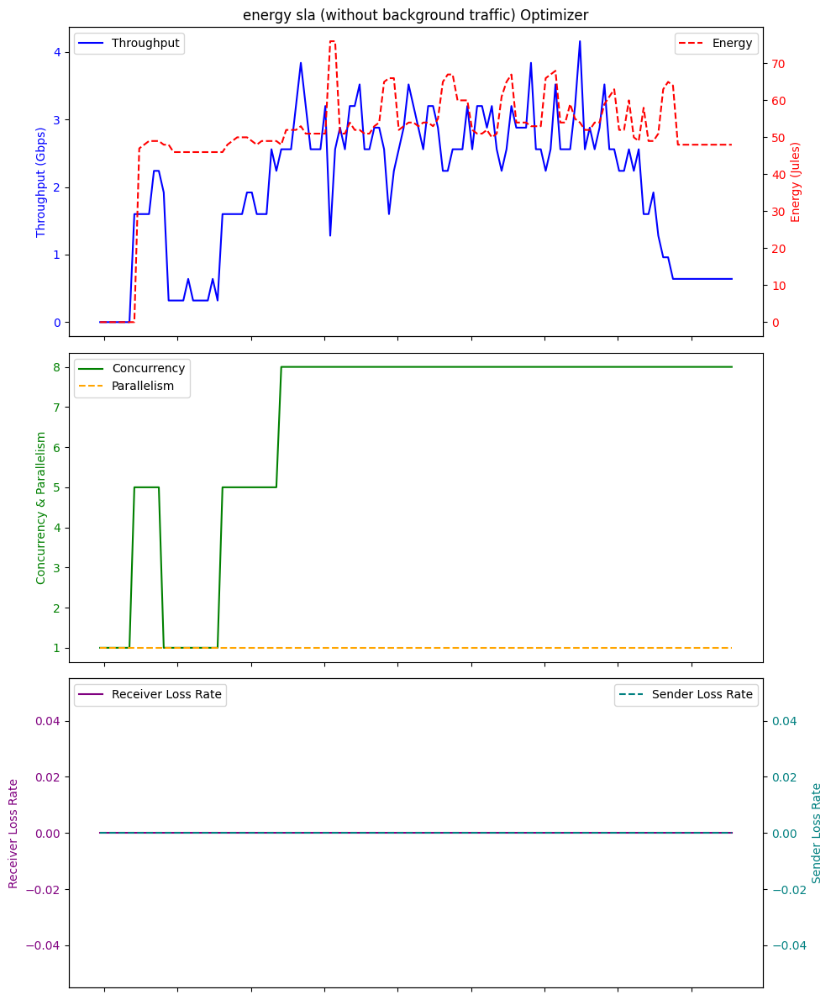

Average Throughput: 2.0036923076923077
Total Energy: 50.04615384615385
Total loss rate: 0.0


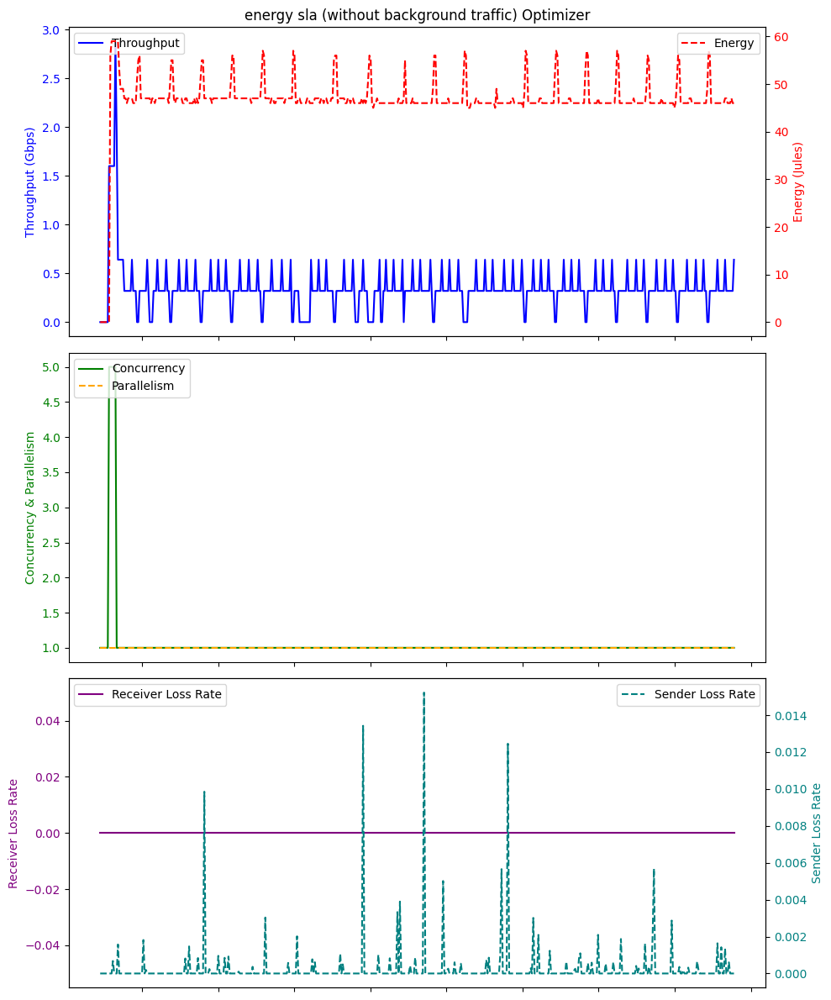

Average Throughput: 0.34112
Total Energy: 46.596
Total loss rate: 0.0002629357838214903


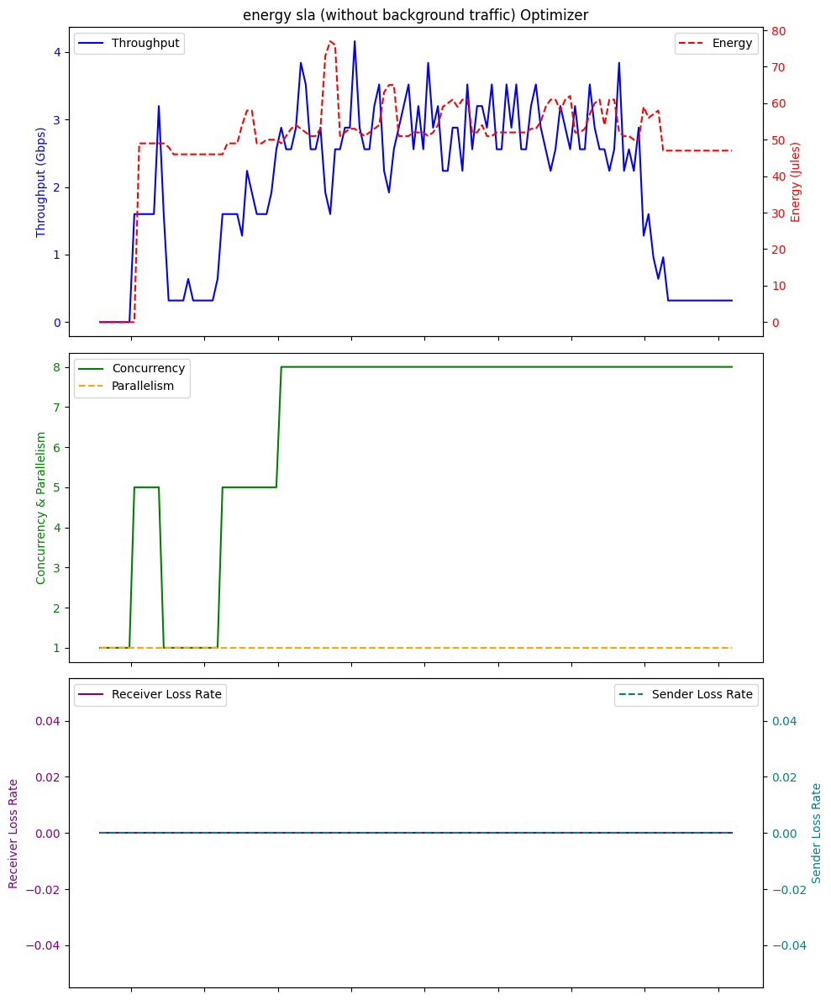

Average Throughput: 1.9815384615384617
Total Energy: 49.56923076923077
Total loss rate: 0.0


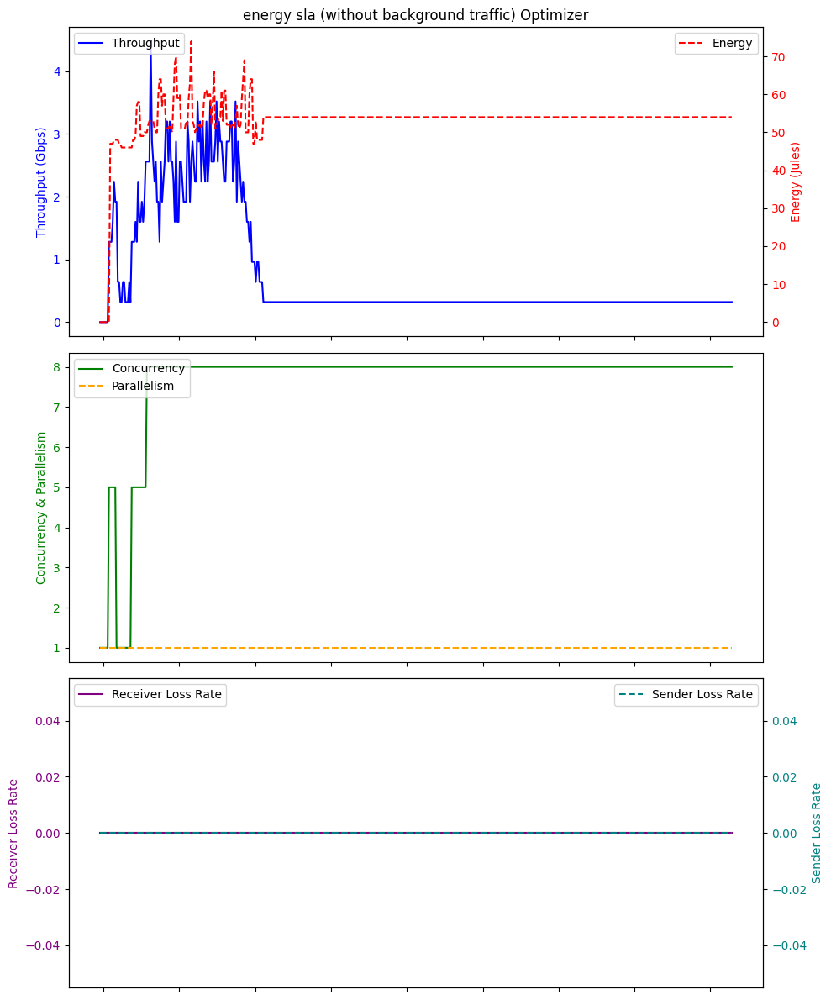

Average Throughput: 0.7430399999999999
Total Energy: 52.998
Total loss rate: 0.0


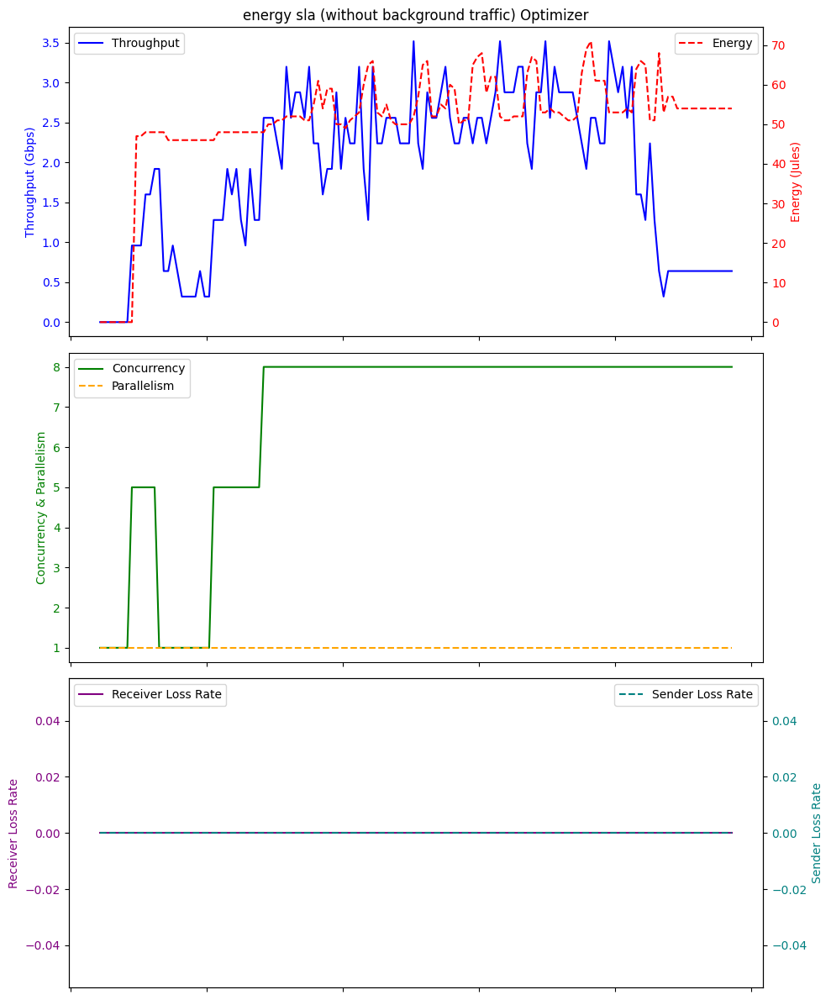

Average Throughput: 1.8742857142857137
Total Energy: 50.7
Total loss rate: 0.0


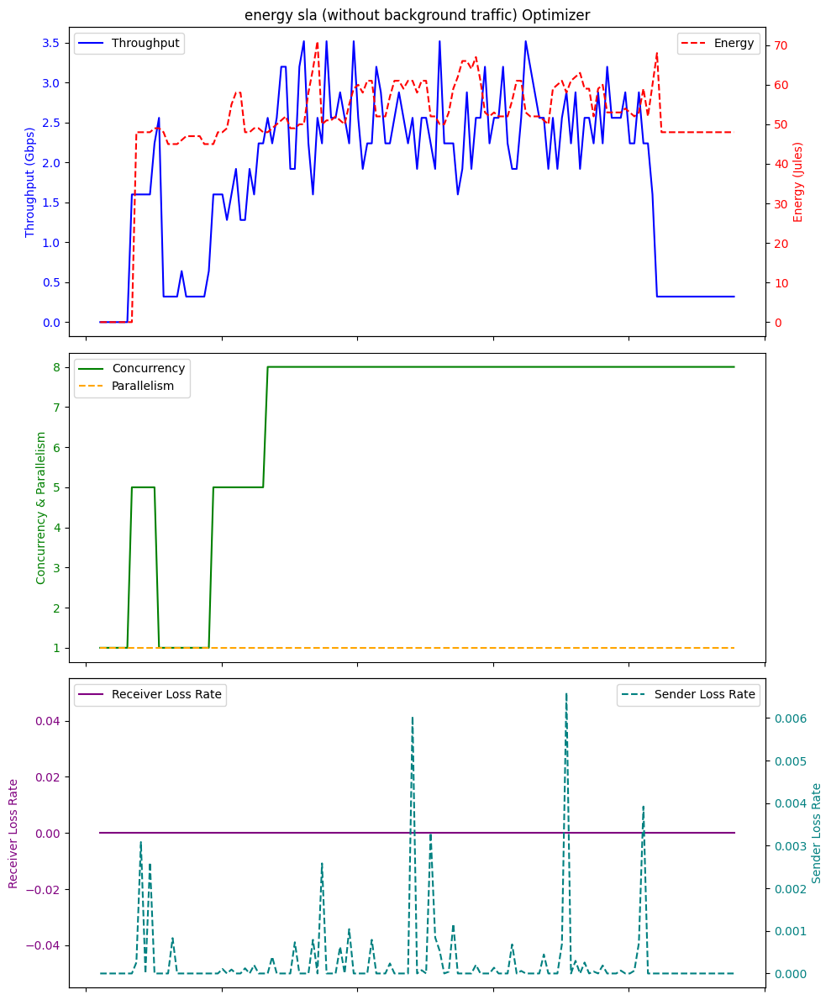

Average Throughput: 1.8337588652482266
Total Energy: 50.297872340425535
Total loss rate: 0.0002897623576249277


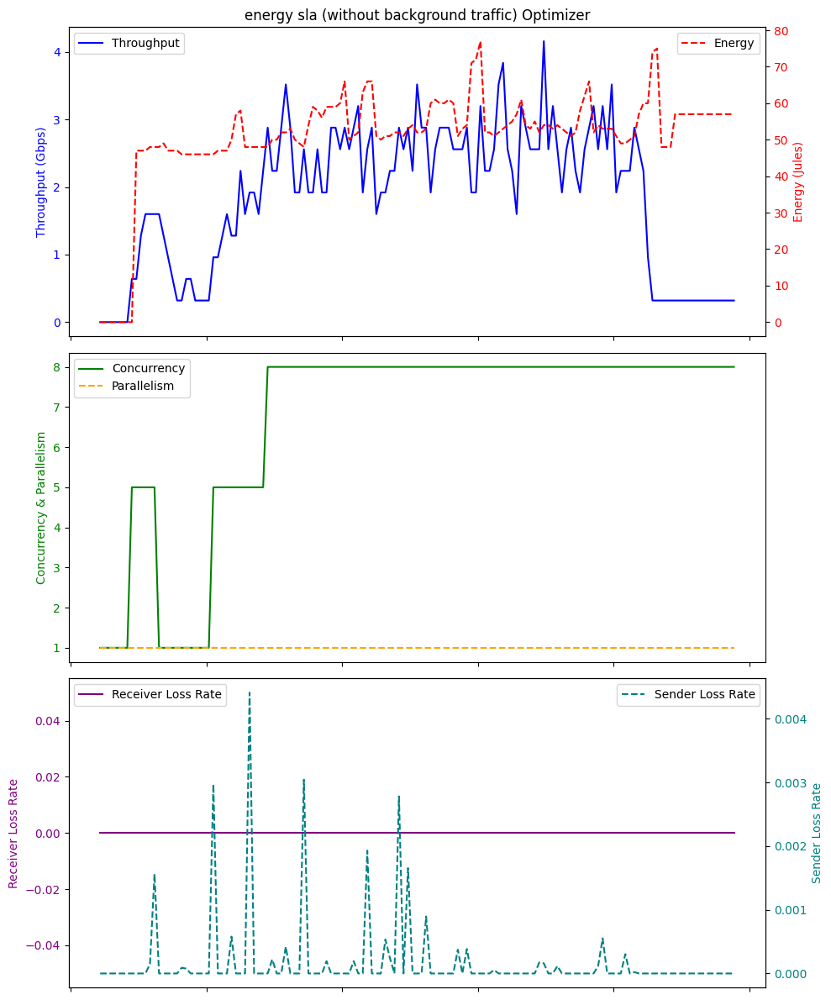

Average Throughput: 1.8246808510638295
Total Energy: 50.87943262411348
Total loss rate: 0.0001717742605854824


In [3]:
directory = './logFileDir/ppo_energy_sla_MA_ID/'
dfs = process_log_files(directory,"ppo_energy_sla_MA_ID_")

ppo_energy_sla_MA_ID_throughput_list=[]
ppo_energy_sla_MA_ID_energy_list=[]
ppo_energy_sla_MA_ID_plr_list=[]
# Print or process the dataframes as needed
for df in dfs:
    # print(df)
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)


    # Top plot with Throughput and Energy
    ax1.plot(df['Time'], df['Throughput'], label='Throughput', color='blue')
    ax1.set_ylabel('Throughput (Gbps)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title('energy sla (without background traffic) Optimizer')

    ax2_twin = ax1.twinx()
    ax2_twin.plot(df['Time'], df['Energy'], label='Energy', color='red', linestyle='--')
    ax2_twin.set_ylabel('Energy (Jules)', color='red')
    ax2_twin.tick_params(axis='y', labelcolor='red')

    # Bottom plot with Concurrency, Parallelism, and CC
    ax2.plot(df['Time'], df['Concurrency'], label='Concurrency', color='green')
    ax2.plot(df['Time'], df['Parallelism'], label='Parallelism', color='orange', linestyle='--')
    ax2.set_ylabel('Concurrency & Parallelism', color='green')
    ax2.tick_params(axis='y', labelcolor='green')



    # Bottom plot with Receiver Loss Rate and Sender Loss Rate
    ax3.plot(df['Time'], df['LossRate'], label='Receiver Loss Rate', color='purple', linestyle='-')
    ax3.set_ylabel('Receiver Loss Rate', color='purple')
    ax3.tick_params(axis='y', labelcolor='purple')

    ax4_twin = ax3.twinx()
    ax4_twin.plot(df['Time'], df['SenderLR'], label='Sender Loss Rate', color='teal', linestyle='--')
    ax4_twin.set_ylabel('Sender Loss Rate', color='teal')
    ax4_twin.tick_params(axis='y', labelcolor='teal')

    # Formatting the x-axis to show time correctly
#     ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: (datetime.min + timedelta(seconds=x)).strftime('%H:%M:%S')))
#     ax2.set_xticklabels([])
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])
    # Fix for overlapping layouts
    fig.tight_layout()

    # Legend
    ax1.legend(loc='upper left')
    ax2_twin.legend(loc='upper right')
    ax2.legend(loc='upper left')
    ax3.legend(loc='upper left')
    ax4_twin.legend(loc='upper right')
#     plt.savefig('withBT.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()

    average_throughput = df['Throughput'].mean()
    print("Average Throughput:", average_throughput)
    total_energy = df['Energy'].mean()
    print("Total Energy:", total_energy)
    total_plr = df['SenderLR'].mean()
    print("Total loss rate:", total_plr)

    ppo_energy_sla_MA_ID_throughput_list.append(average_throughput)
    ppo_energy_sla_MA_ID_energy_list.append(total_energy)
    ppo_energy_sla_MA_ID_plr_list.append(total_plr)


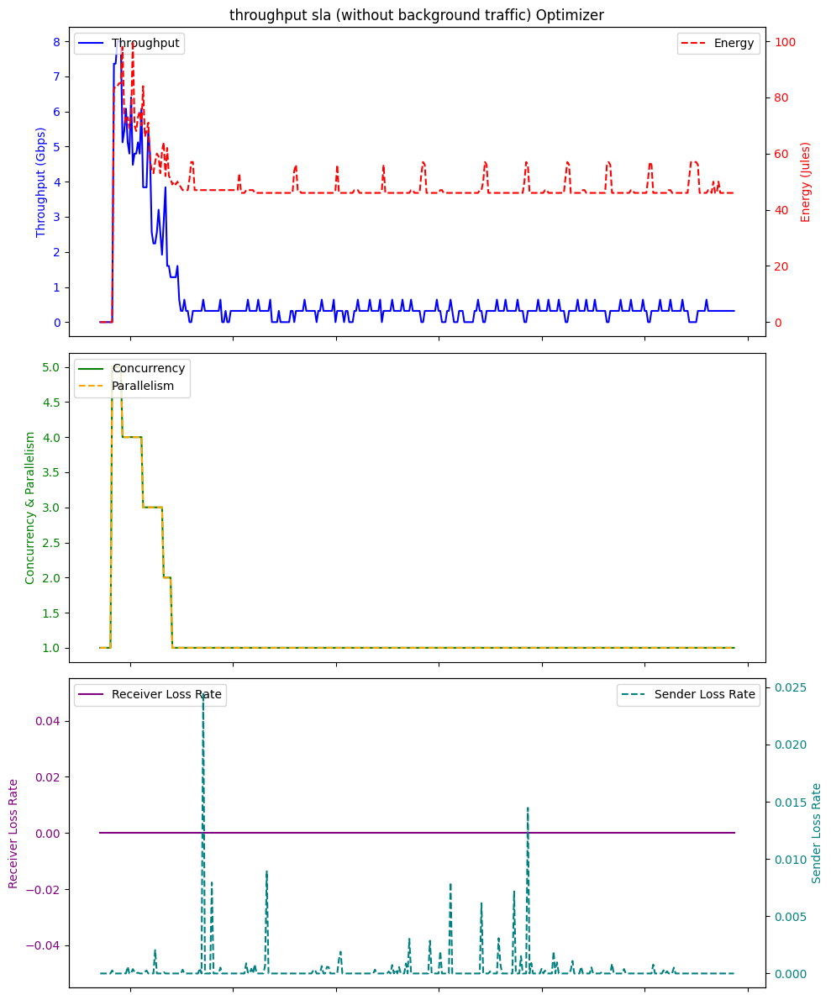

Average Throughput: 0.6901621621621622
Total Energy: 48.18108108108108
Total loss rate: 0.0003171827591384862


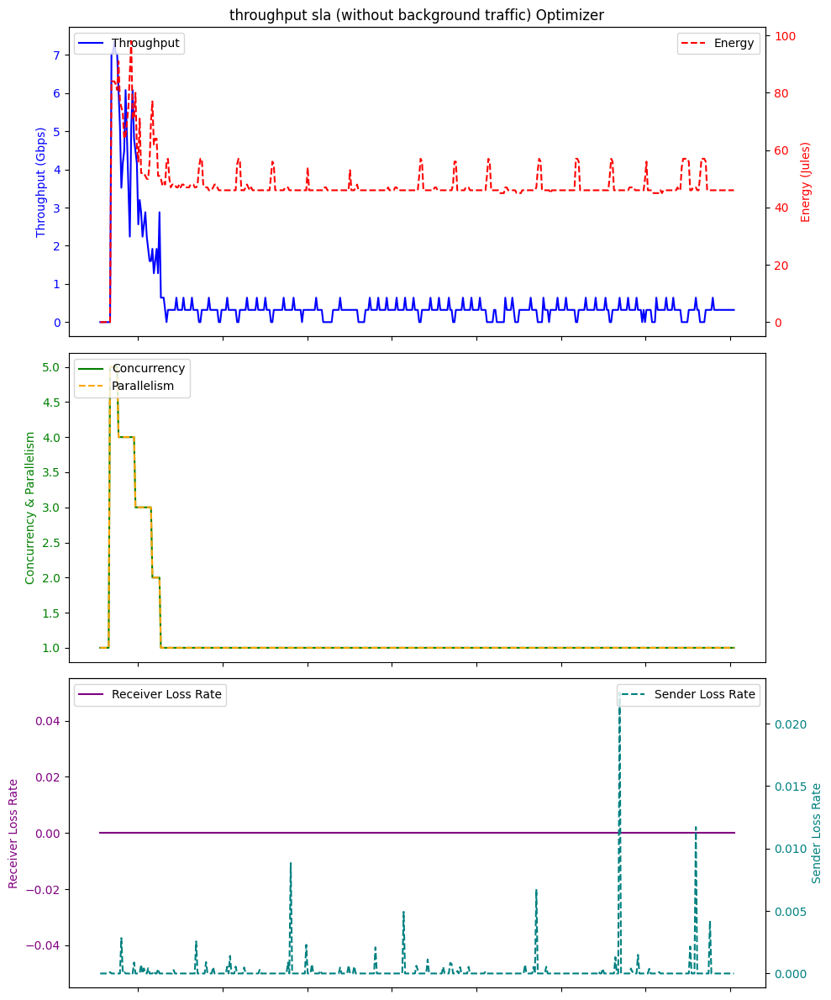

Average Throughput: 0.5752888888888888
Total Energy: 48.00666666666667
Total loss rate: 0.00021014587457106866


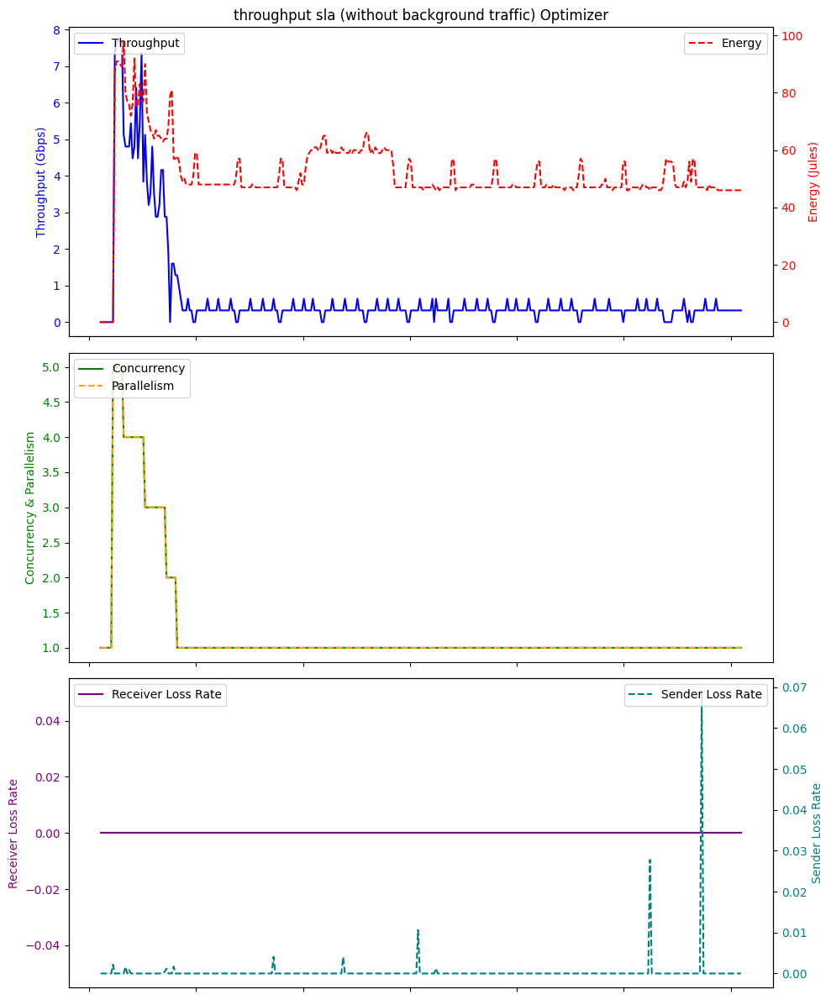

Average Throughput: 0.7191111111111111
Total Energy: 51.46944444444444
Total loss rate: 0.00034579996312130606


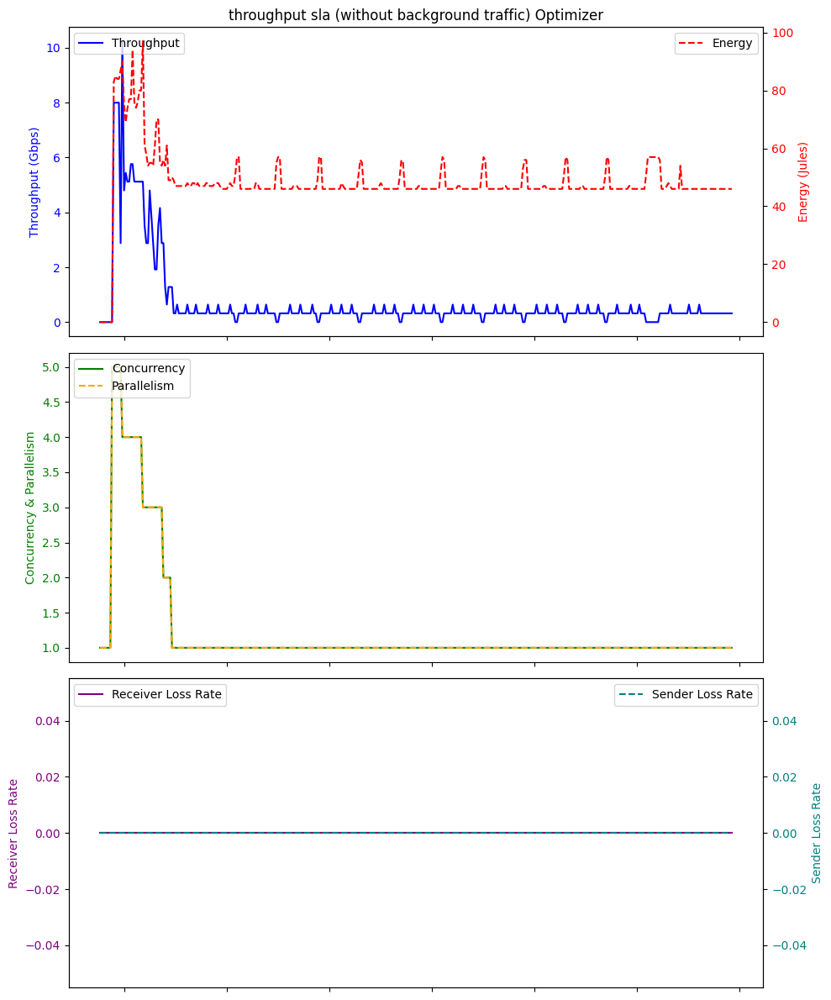

Average Throughput: 0.7022702702702703
Total Energy: 48.394594594594594
Total loss rate: 0.0


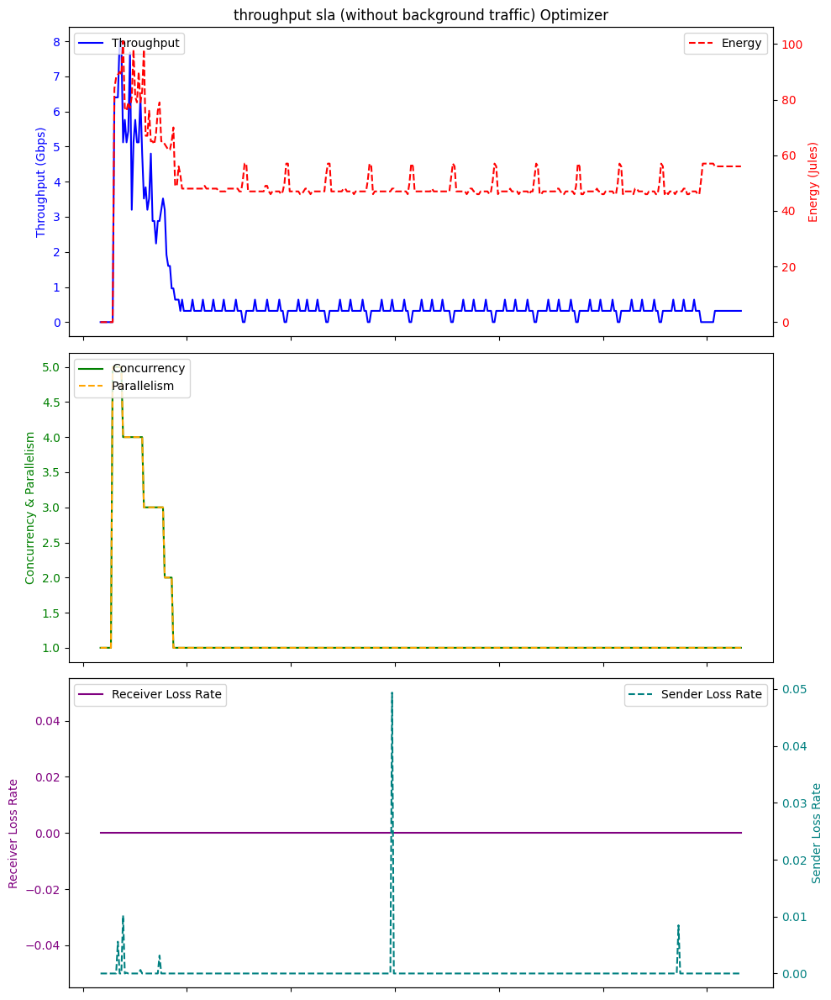

Average Throughput: 0.6970810810810811
Total Energy: 50.14324324324324
Total loss rate: 0.00020958156153300816


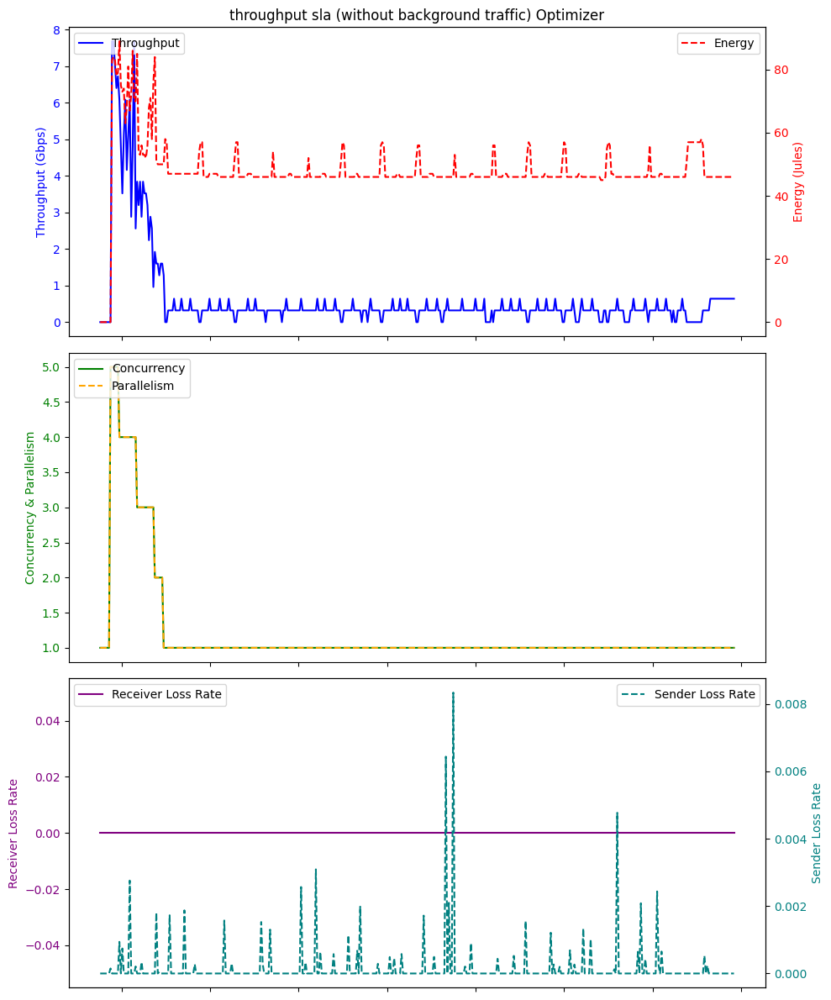

Average Throughput: 0.6184186046511629
Total Energy: 48.02558139534884
Total loss rate: 0.00015925846188826007


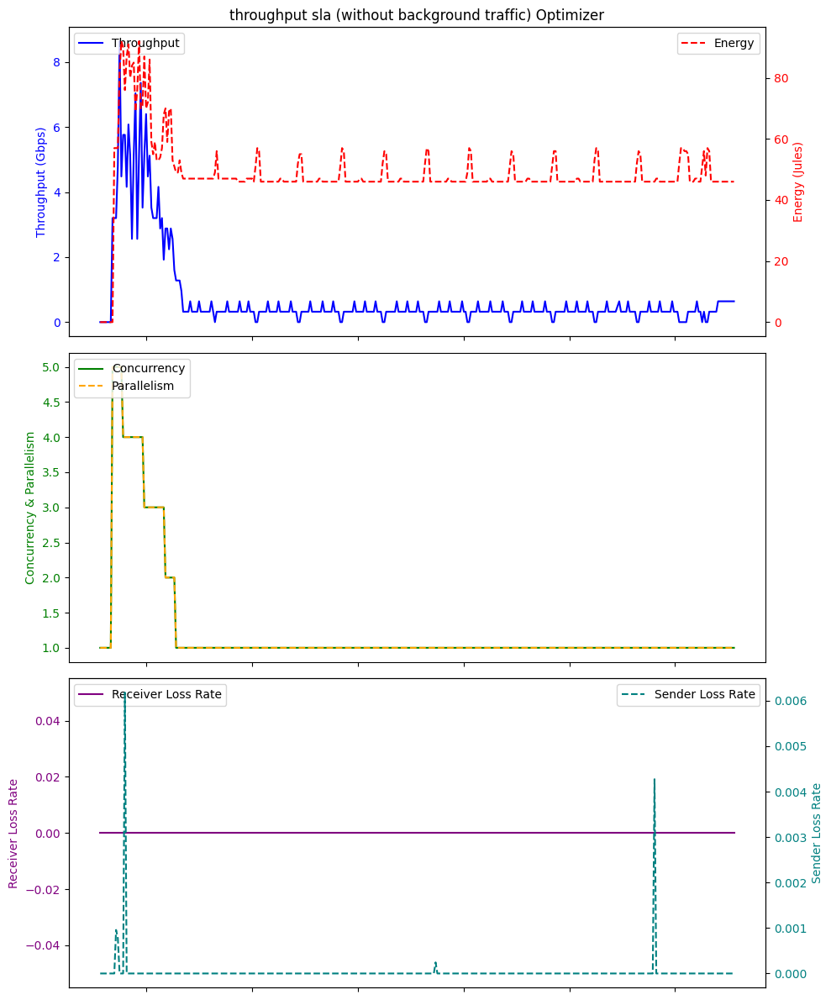

Average Throughput: 0.7228969359331477
Total Energy: 48.54596100278552
Total loss rate: 3.4618319222494866e-05


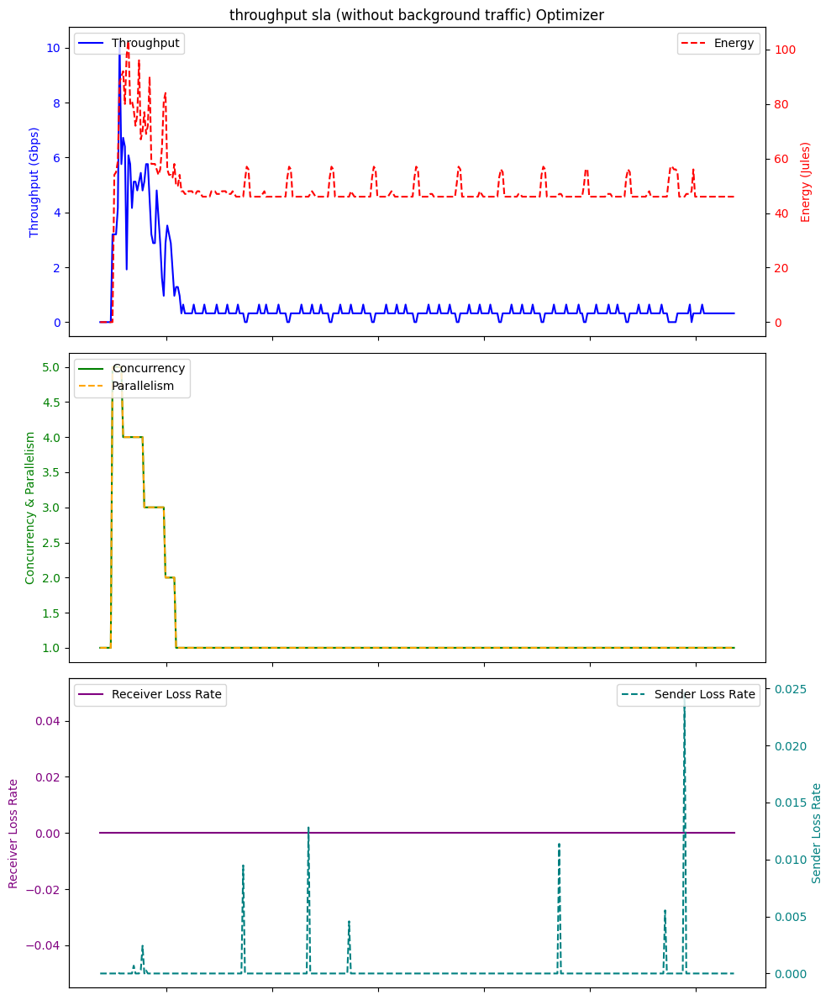

Average Throughput: 0.7182222222222222
Total Energy: 48.611111111111114
Total loss rate: 0.0002005852507774108


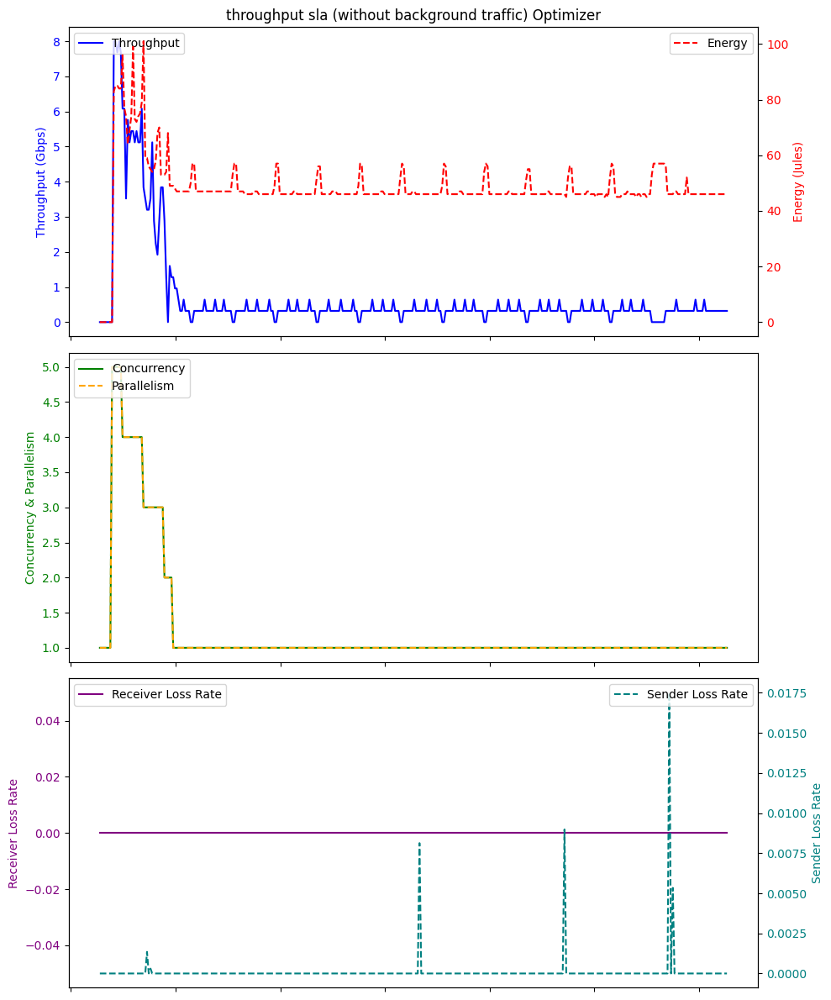

Average Throughput: 0.7146666666666666
Total Energy: 48.40277777777778
Total loss rate: 0.00011560257847323044


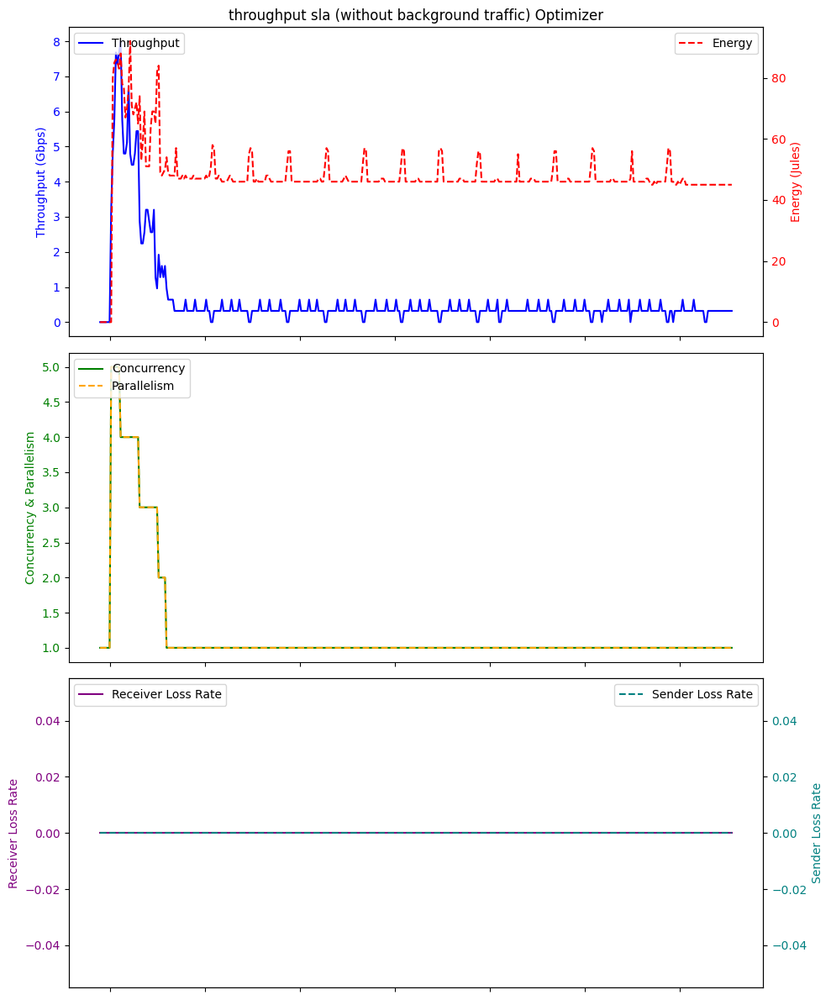

Average Throughput: 0.6472
Total Energy: 47.985
Total loss rate: 0.0


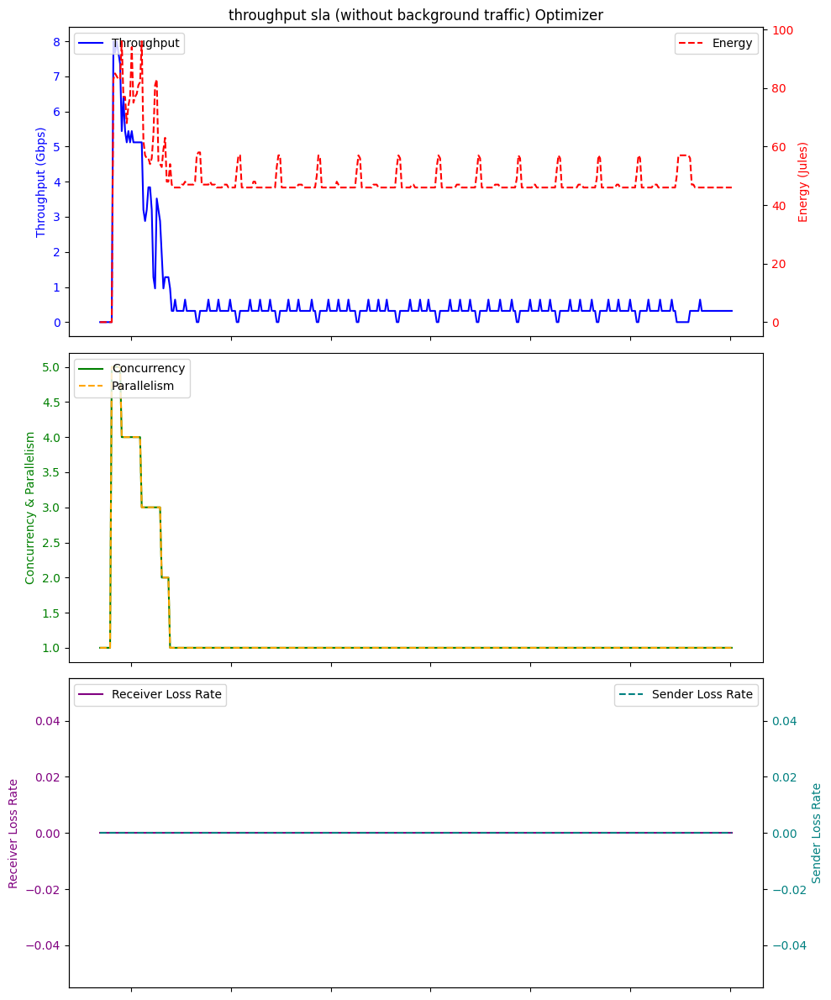

Average Throughput: 0.6778947368421053
Total Energy: 48.555263157894736
Total loss rate: 0.0


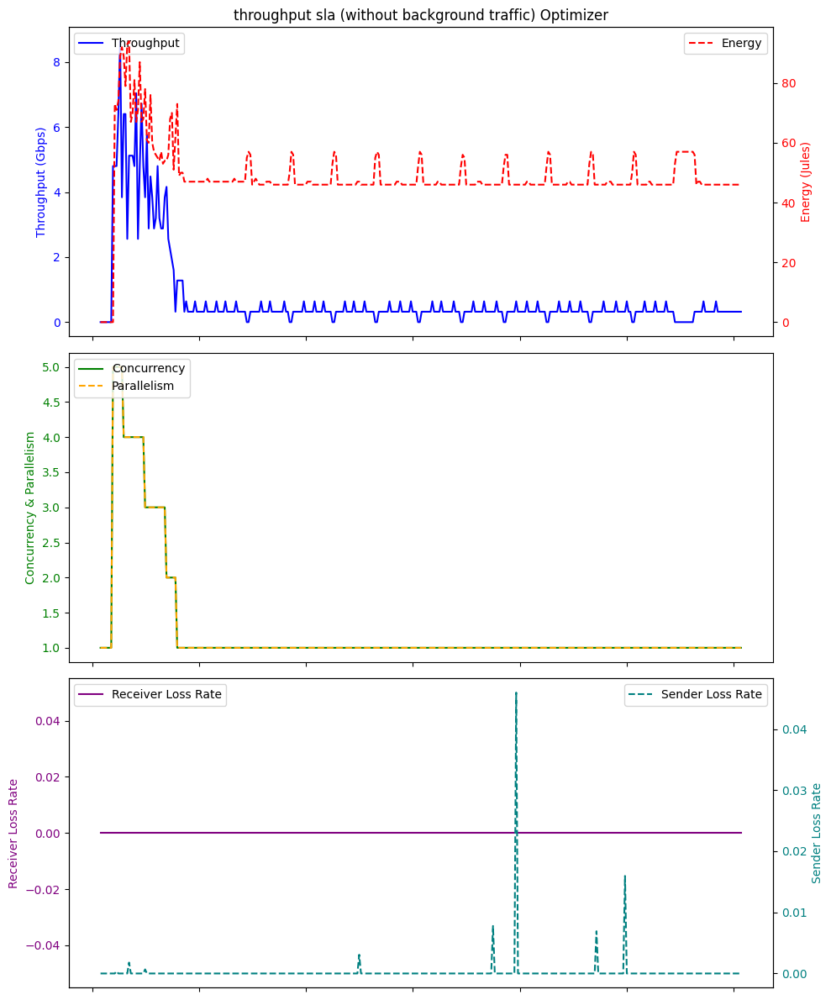

Average Throughput: 0.7208888888888888
Total Energy: 48.611111111111114
Total loss rate: 0.00022910383635161834


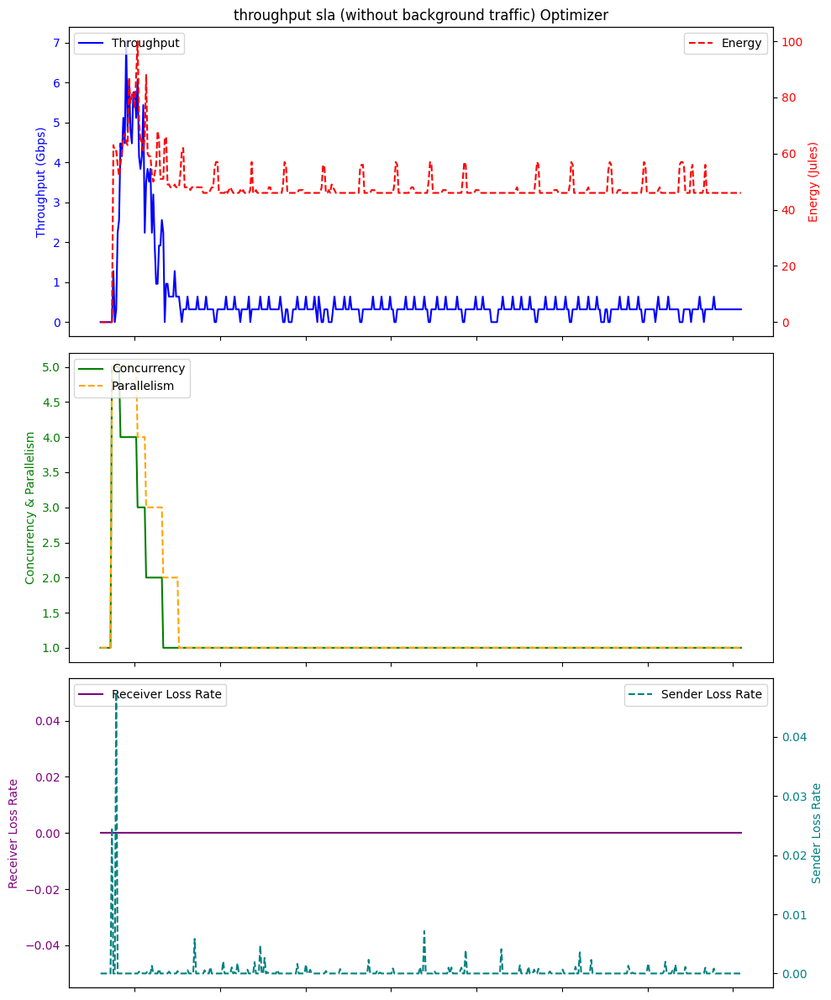

Average Throughput: 0.5781333333333335
Total Energy: 47.85111111111111
Total loss rate: 0.00033655595412507955


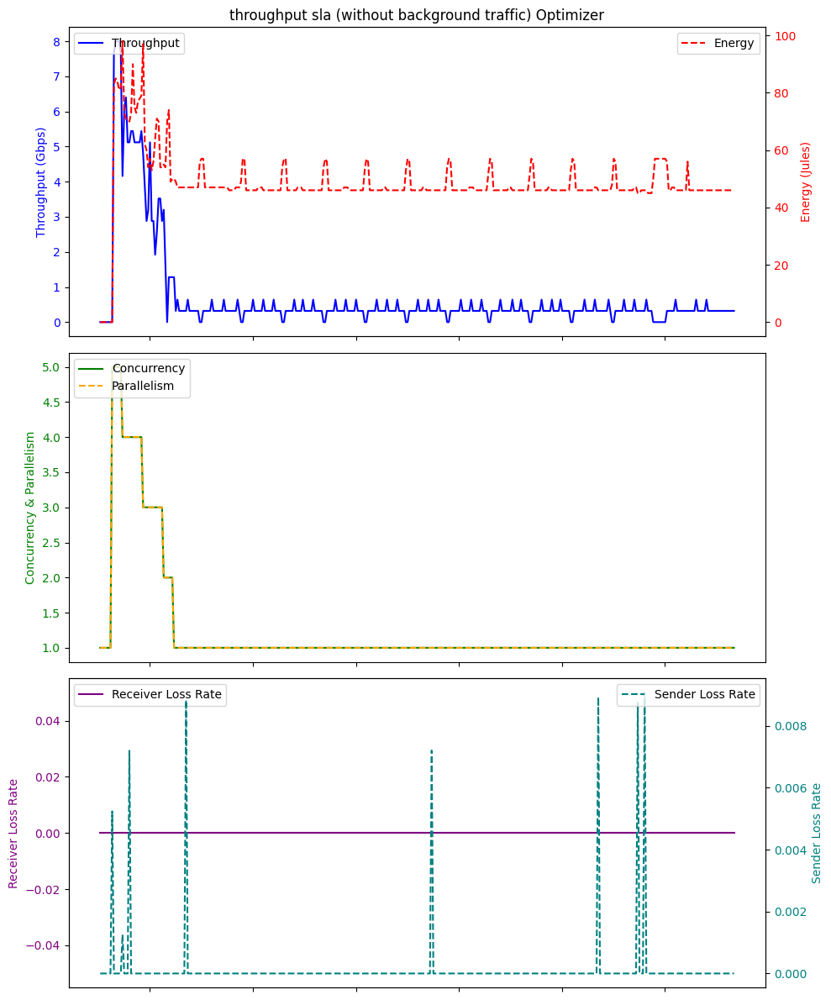

Average Throughput: 0.7022702702702703
Total Energy: 48.51891891891892
Total loss rate: 0.00015264812364605205


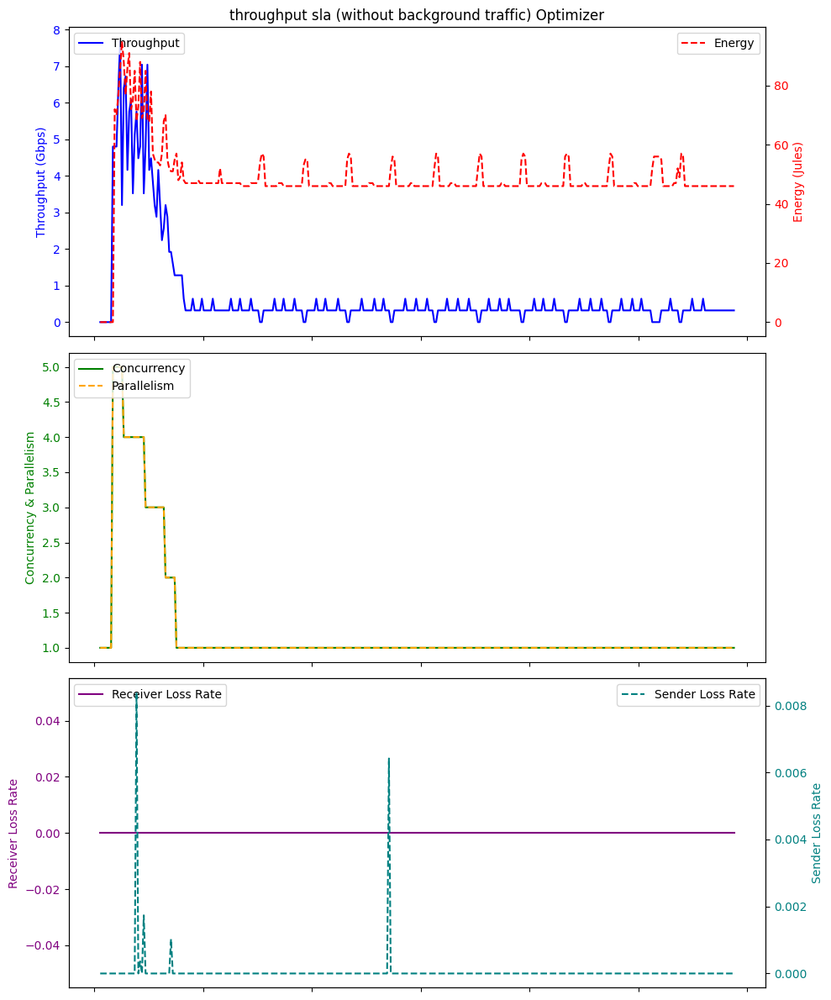

Average Throughput: 0.7332571428571428
Total Energy: 48.488571428571426
Total loss rate: 5.121869717778644e-05


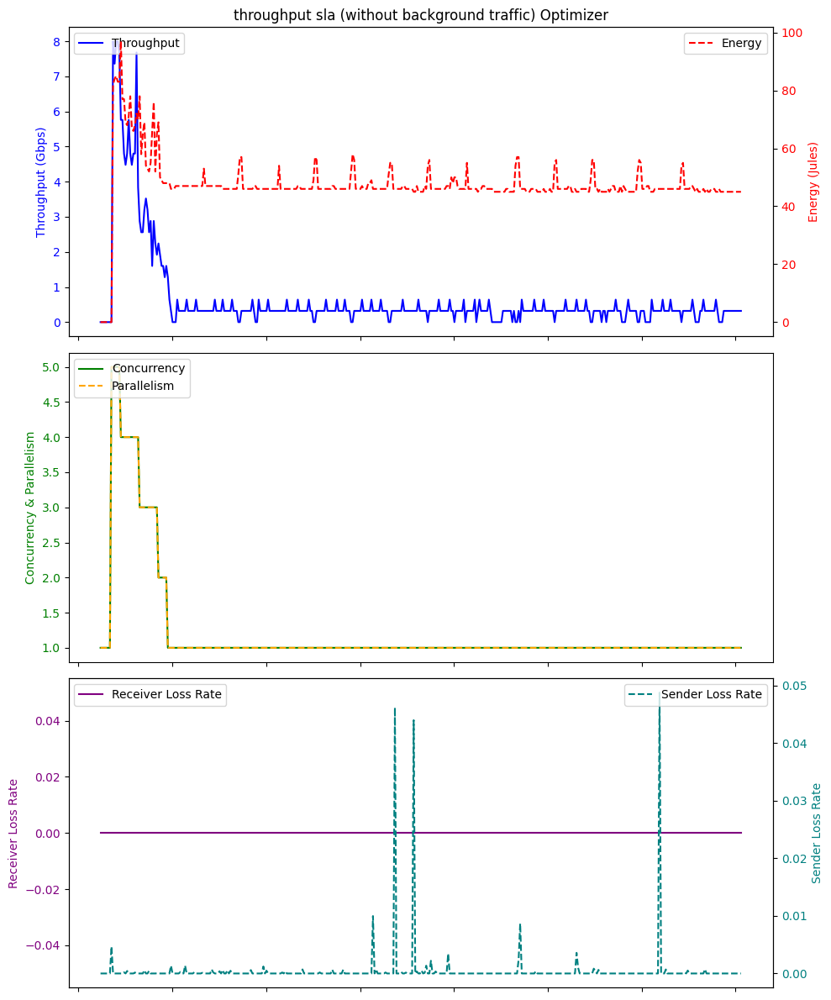

Average Throughput: 0.6314146341463415
Total Energy: 47.5390243902439
Total loss rate: 0.0004786766590496231


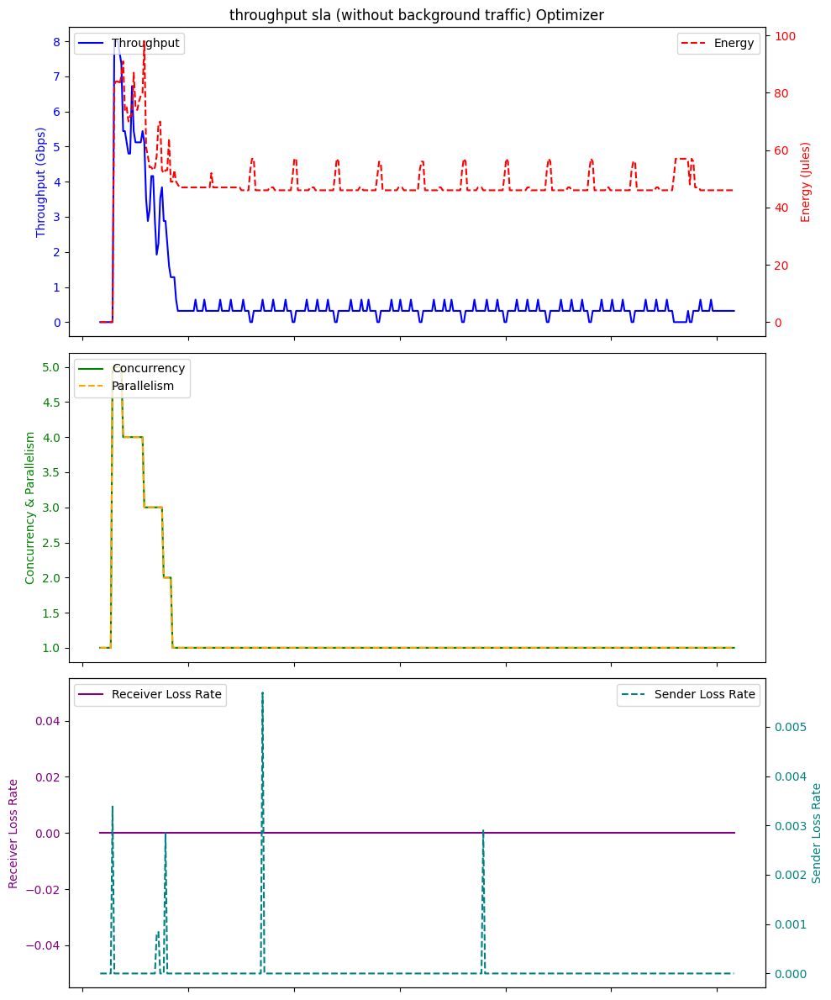

Average Throughput: 0.716657381615599
Total Energy: 48.448467966573816
Total loss rate: 4.5865088293499955e-05


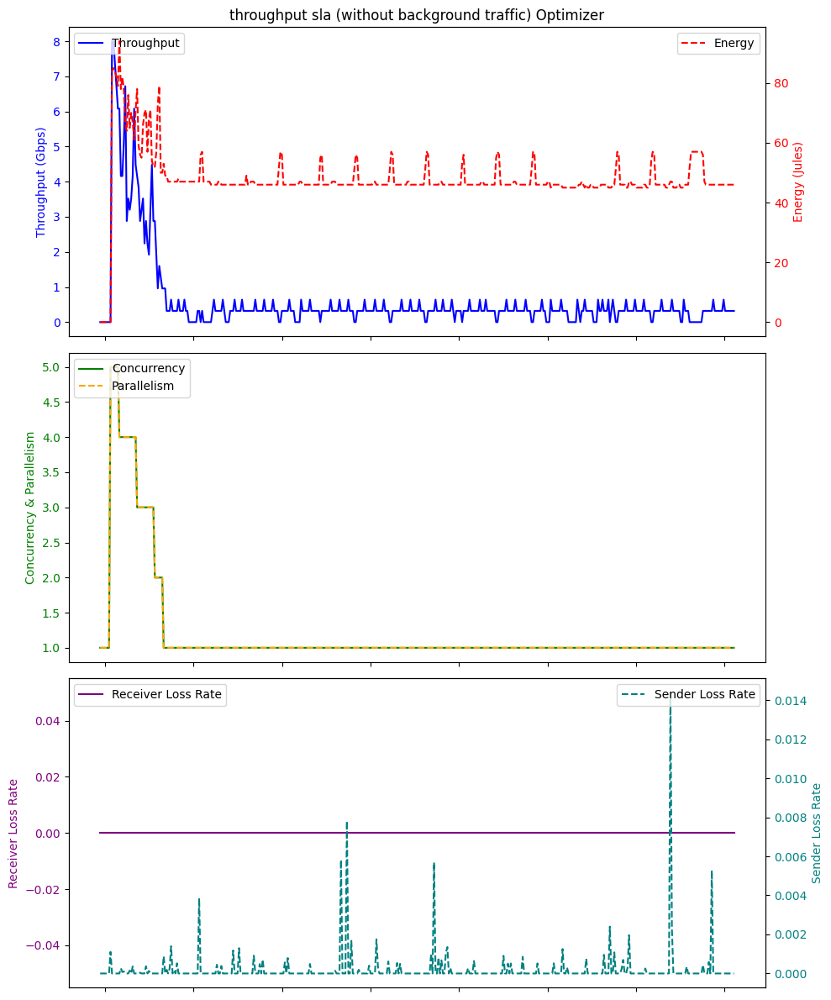

Average Throughput: 0.5983255813953487
Total Energy: 47.937209302325584
Total loss rate: 0.00020007609529670554


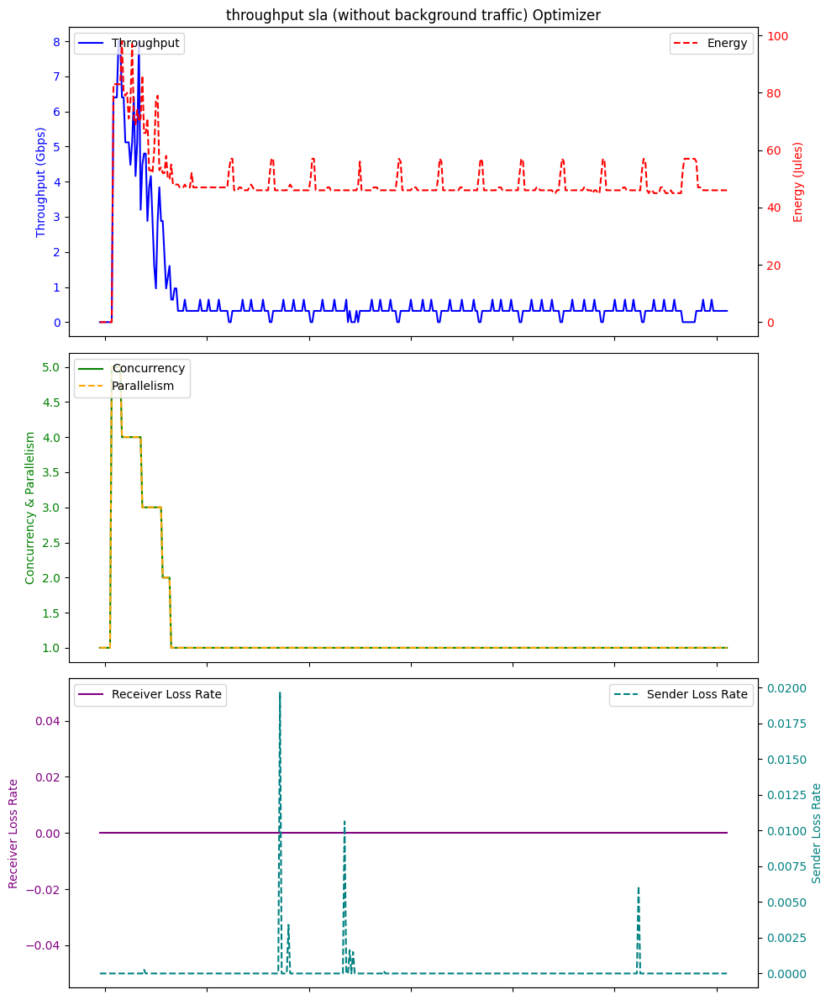

Average Throughput: 0.6953513513513513
Total Energy: 48.413513513513514
Total loss rate: 0.0001173762064113238


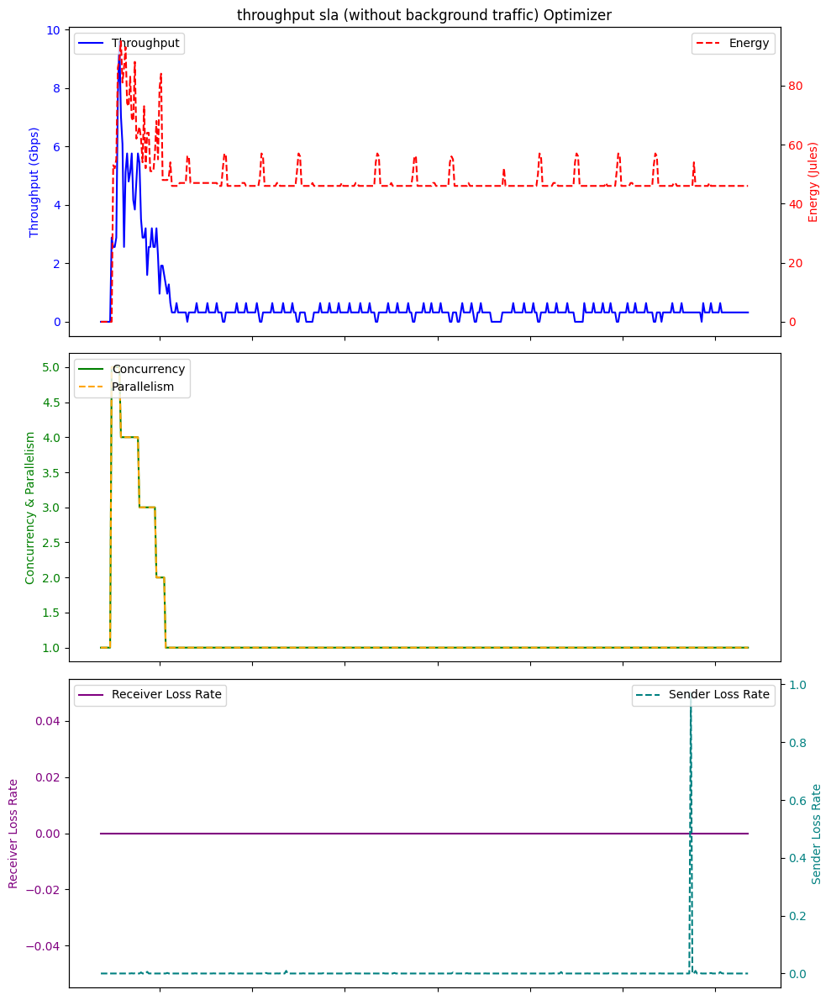

Average Throughput: 0.6133333333333334
Total Energy: 47.726190476190474
Total loss rate: 0.002486540644441754


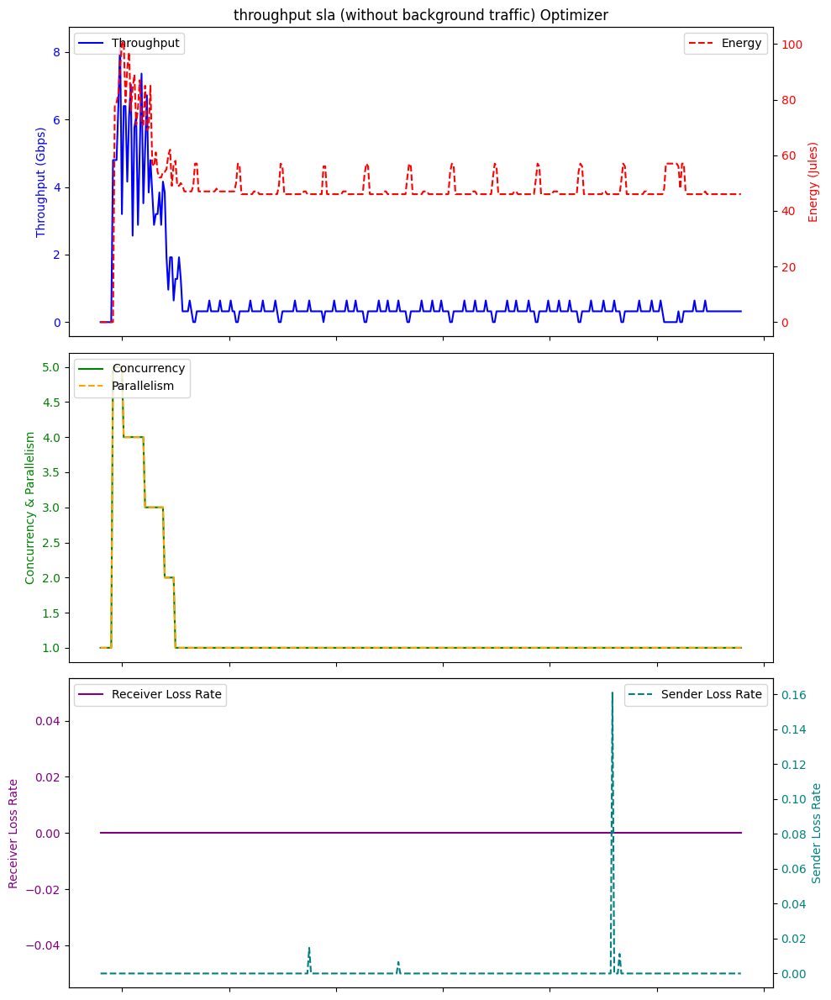

Average Throughput: 0.7191111111111111
Total Energy: 48.78333333333333
Total loss rate: 0.0005373884565888441


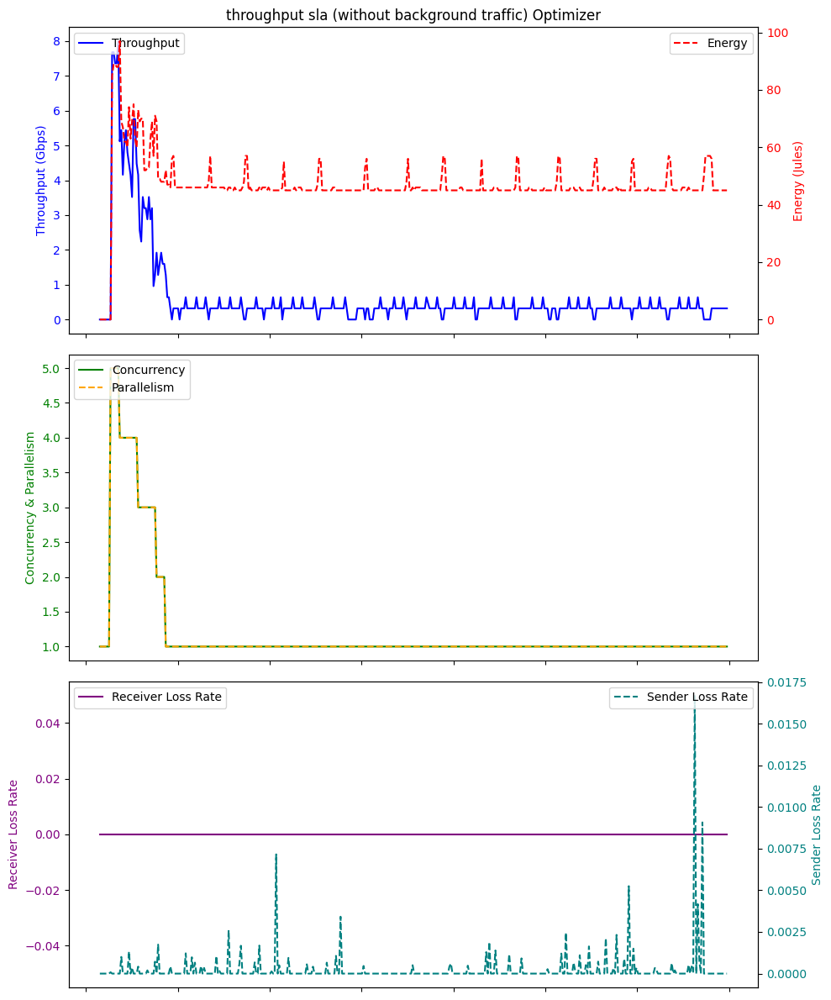

Average Throughput: 0.6306112469437654
Total Energy: 47.0562347188264
Total loss rate: 0.0002369007641551732


In [4]:
directory = './logFileDir/ppo_throughput_sla_MA_ID/'
dfs = process_log_files(directory,"ppo_throughput_sla_MA_ID_")

ppo_throughput_sla_MA_ID_throughput_list=[]
ppo_throughput_sla_MA_ID_energy_list=[]
ppo_throughput_sla_MA_ID_plr_list=[]
# Print or process the dataframes as needed
for df in dfs:
    # print(df)
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)


    # Top plot with Throughput and Energy
    ax1.plot(df['Time'], df['Throughput'], label='Throughput', color='blue')
    ax1.set_ylabel('Throughput (Gbps)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title('throughput sla (without background traffic) Optimizer')

    ax2_twin = ax1.twinx()
    ax2_twin.plot(df['Time'], df['Energy'], label='Energy', color='red', linestyle='--')
    ax2_twin.set_ylabel('Energy (Jules)', color='red')
    ax2_twin.tick_params(axis='y', labelcolor='red')

    # Bottom plot with Concurrency, Parallelism, and CC
    ax2.plot(df['Time'], df['Concurrency'], label='Concurrency', color='green')
    ax2.plot(df['Time'], df['Parallelism'], label='Parallelism', color='orange', linestyle='--')
    ax2.set_ylabel('Concurrency & Parallelism', color='green')
    ax2.tick_params(axis='y', labelcolor='green')



    # Bottom plot with Receiver Loss Rate and Sender Loss Rate
    ax3.plot(df['Time'], df['LossRate'], label='Receiver Loss Rate', color='purple', linestyle='-')
    ax3.set_ylabel('Receiver Loss Rate', color='purple')
    ax3.tick_params(axis='y', labelcolor='purple')

    ax4_twin = ax3.twinx()
    ax4_twin.plot(df['Time'], df['SenderLR'], label='Sender Loss Rate', color='teal', linestyle='--')
    ax4_twin.set_ylabel('Sender Loss Rate', color='teal')
    ax4_twin.tick_params(axis='y', labelcolor='teal')

    # Formatting the x-axis to show time correctly
#     ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: (datetime.min + timedelta(seconds=x)).strftime('%H:%M:%S')))
#     ax2.set_xticklabels([])
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])
    # Fix for overlapping layouts
    fig.tight_layout()

    # Legend
    ax1.legend(loc='upper left')
    ax2_twin.legend(loc='upper right')
    ax2.legend(loc='upper left')
    ax3.legend(loc='upper left')
    ax4_twin.legend(loc='upper right')
#     plt.savefig('withBT.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()

    average_throughput = df['Throughput'].mean()
    print("Average Throughput:", average_throughput)
    total_energy = df['Energy'].mean()
    print("Total Energy:", total_energy)
    total_plr = df['SenderLR'].mean()
    print("Total loss rate:", total_plr)

    ppo_throughput_sla_MA_ID_throughput_list.append(average_throughput)
    ppo_throughput_sla_MA_ID_energy_list.append(total_energy)
    ppo_throughput_sla_MA_ID_plr_list.append(total_plr)


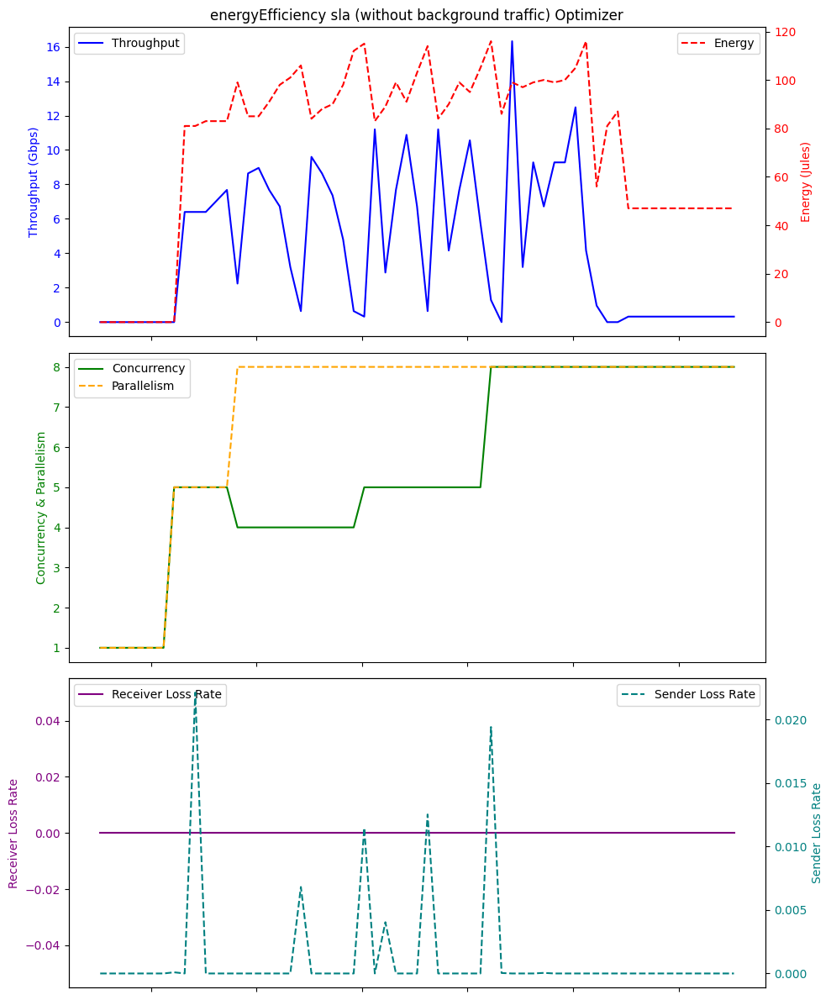

Average Throughput: 4.249180327868852
Total Energy: 73.32786885245902
Total loss rate: 0.0012537563284319804


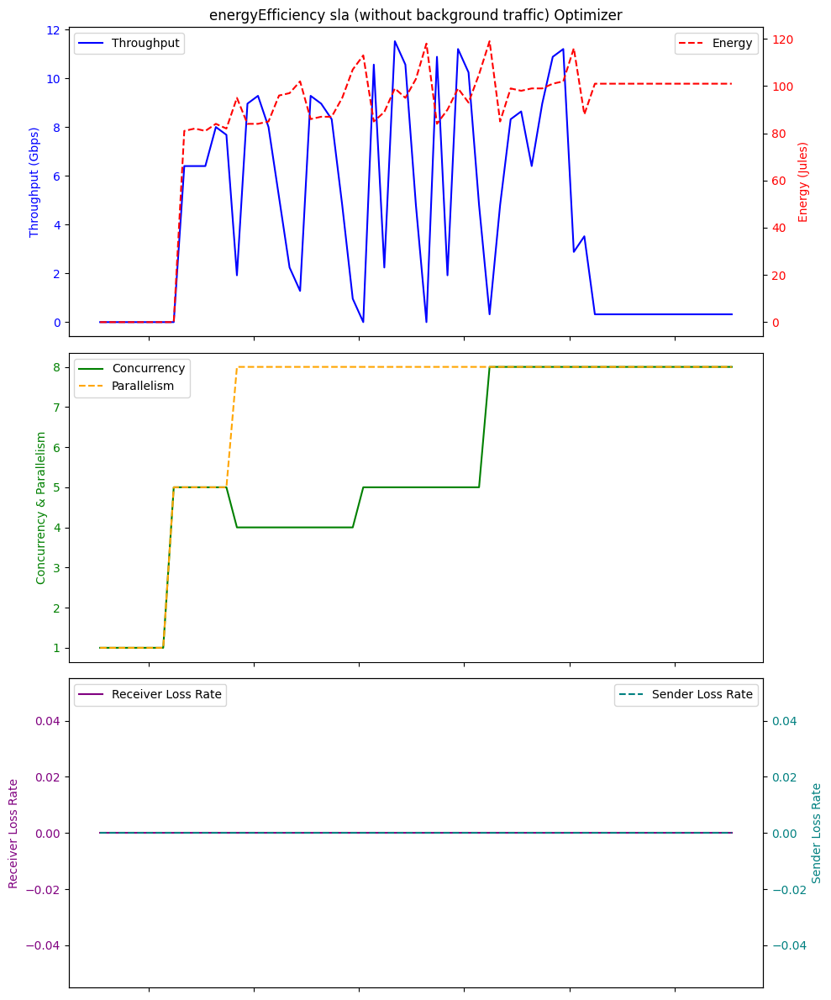

Average Throughput: 4.149508196721311
Total Energy: 83.73770491803279
Total loss rate: 0.0


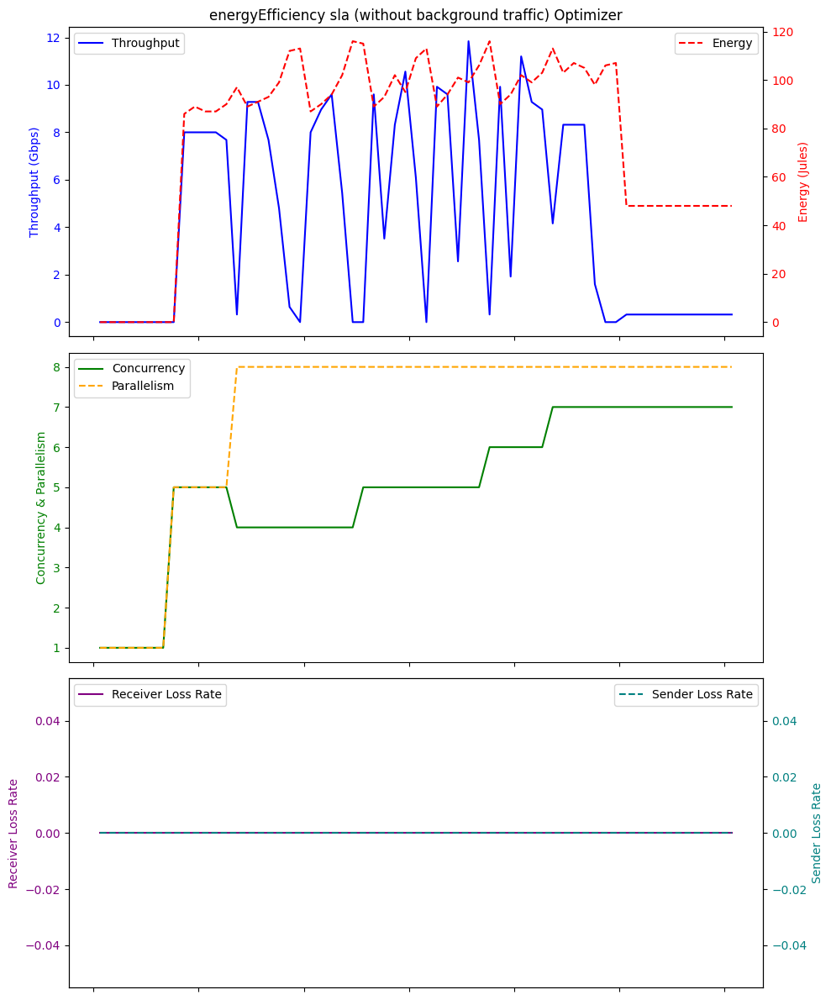

Average Throughput: 4.249180327868852
Total Energy: 77.01639344262296
Total loss rate: 0.0


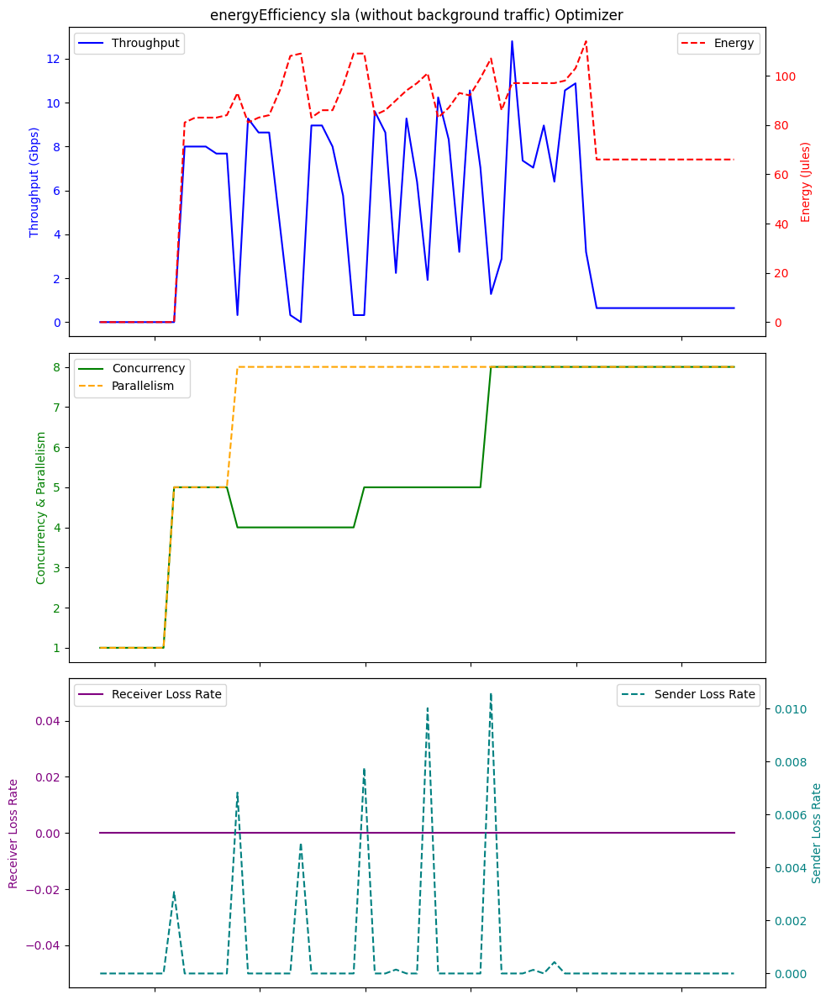

Average Throughput: 4.280655737704917
Total Energy: 74.72131147540983
Total loss rate: 0.0007204566564270296


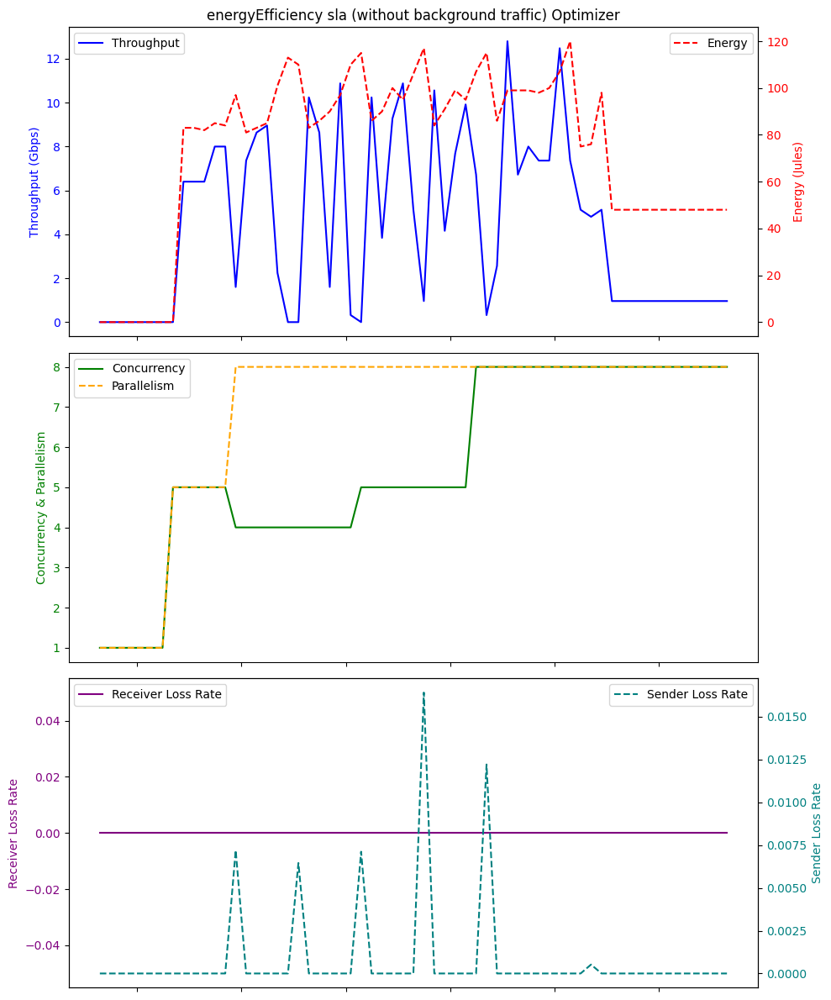

Average Throughput: 4.369836065573769
Total Energy: 73.54098360655738
Total loss rate: 0.0008184222555229835


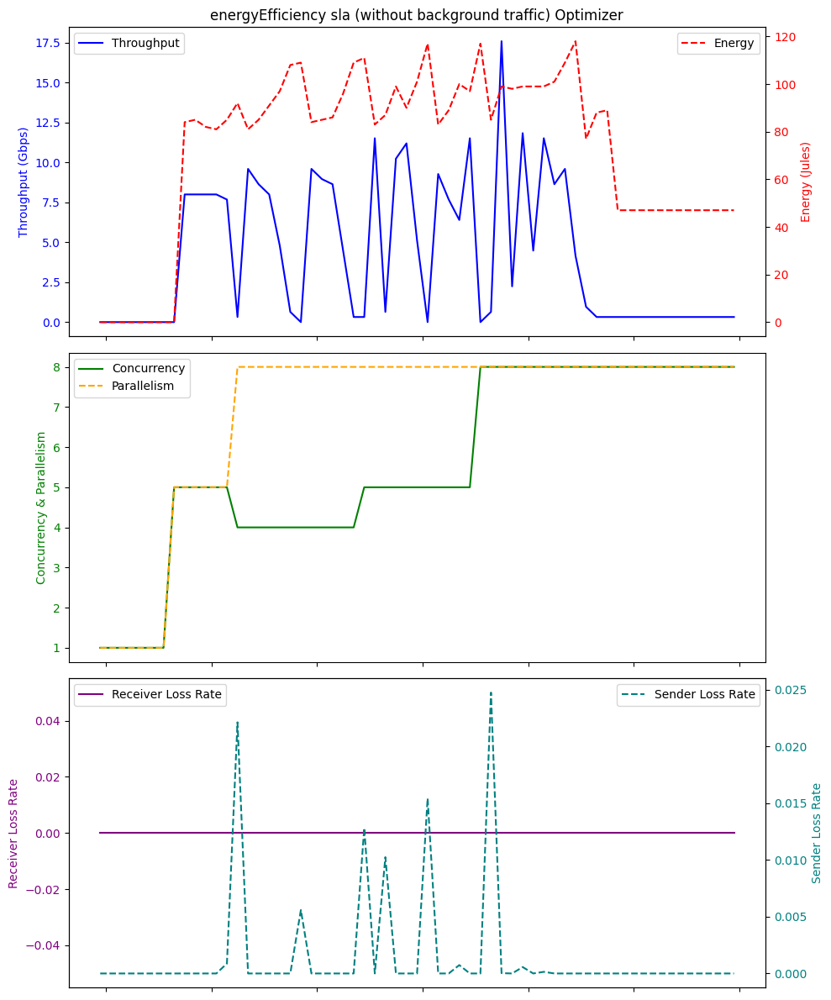

Average Throughput: 4.16
Total Energy: 72.77049180327869
Total loss rate: 0.0015287548121217629


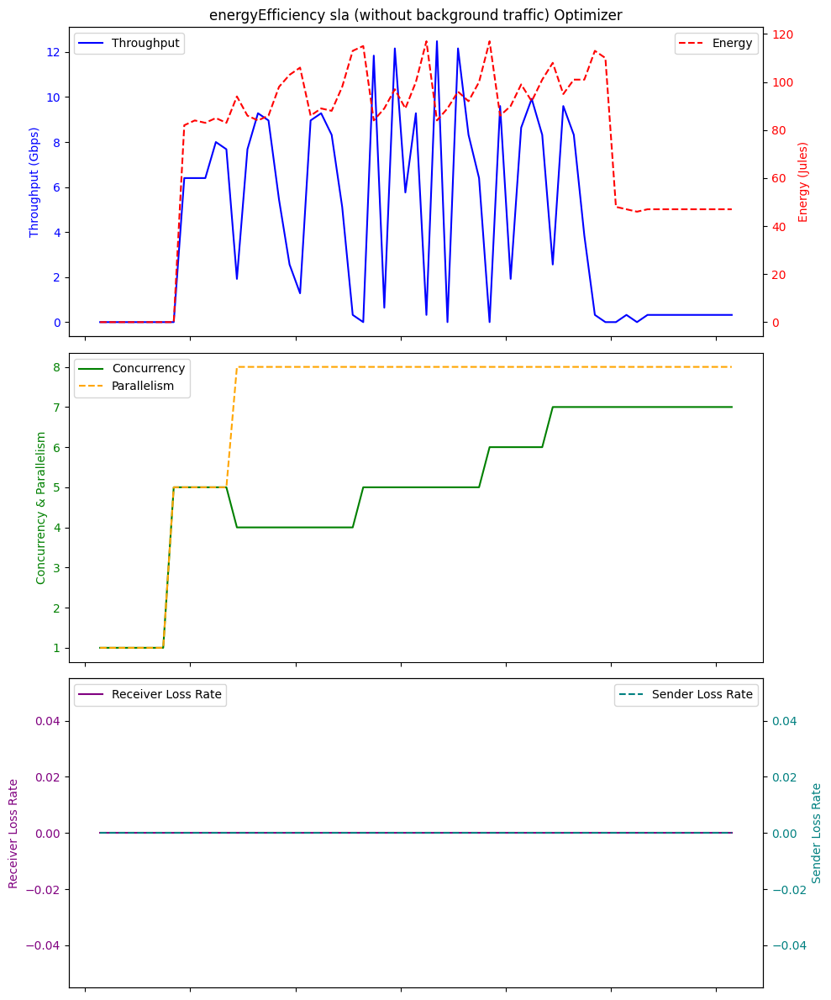

Average Throughput: 4.091803278688524
Total Energy: 73.39344262295081
Total loss rate: 0.0


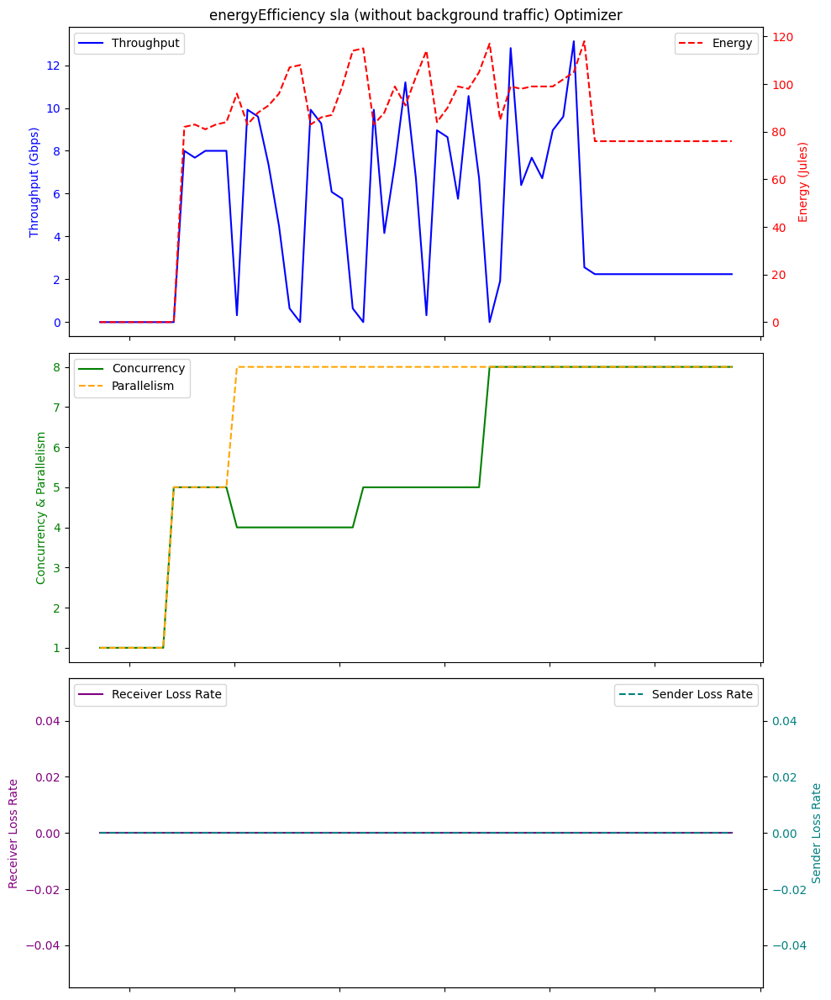

Average Throughput: 4.674098360655738
Total Energy: 78.77049180327869
Total loss rate: 0.0


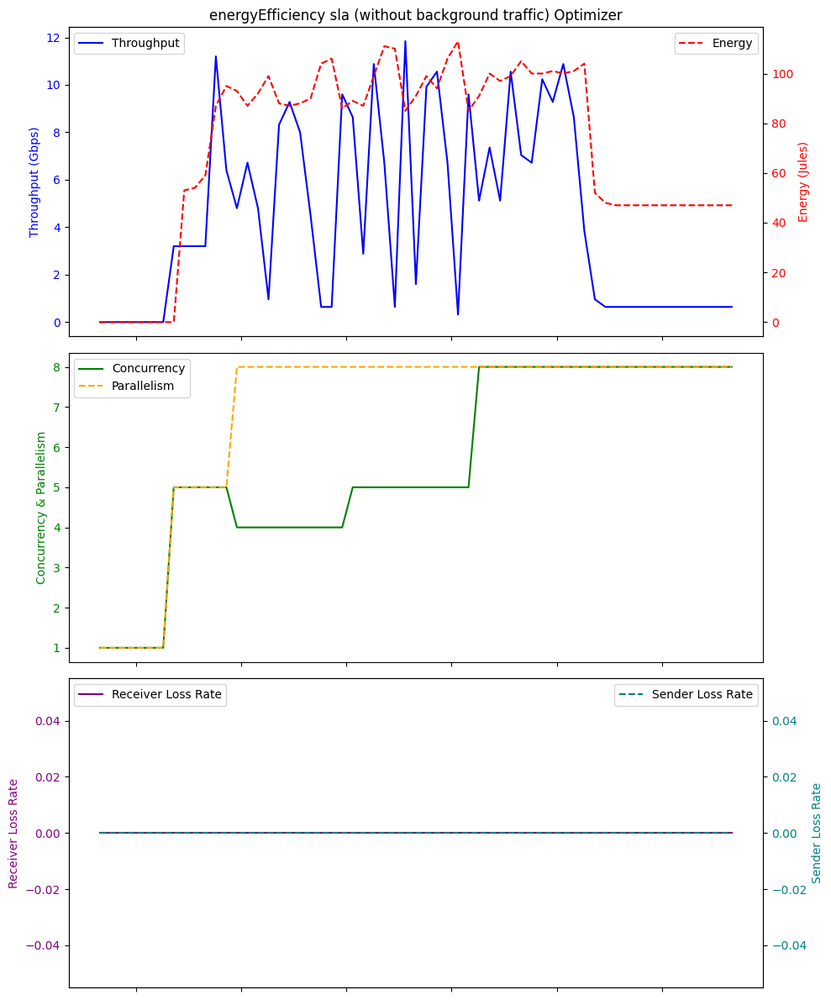

Average Throughput: 4.312131147540983
Total Energy: 70.47540983606558
Total loss rate: 0.0


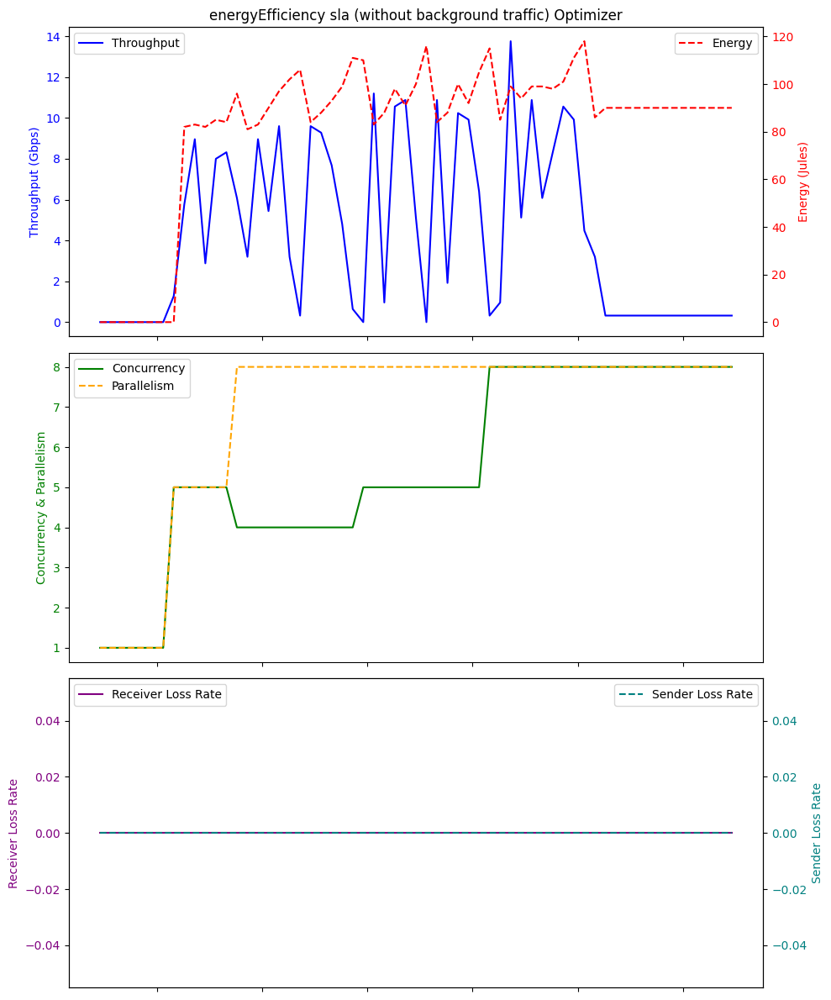

Average Throughput: 4.259672131147541
Total Energy: 81.57377049180327
Total loss rate: 0.0


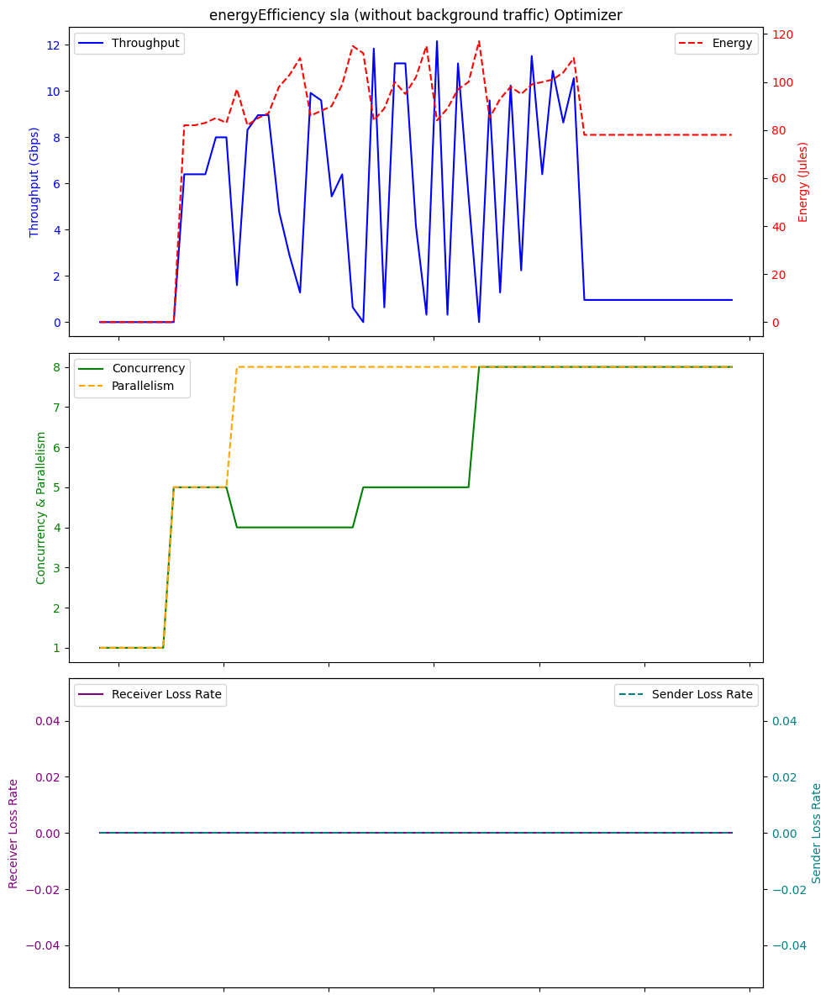

Average Throughput: 4.233442622950819
Total Energy: 78.59016393442623
Total loss rate: 0.0


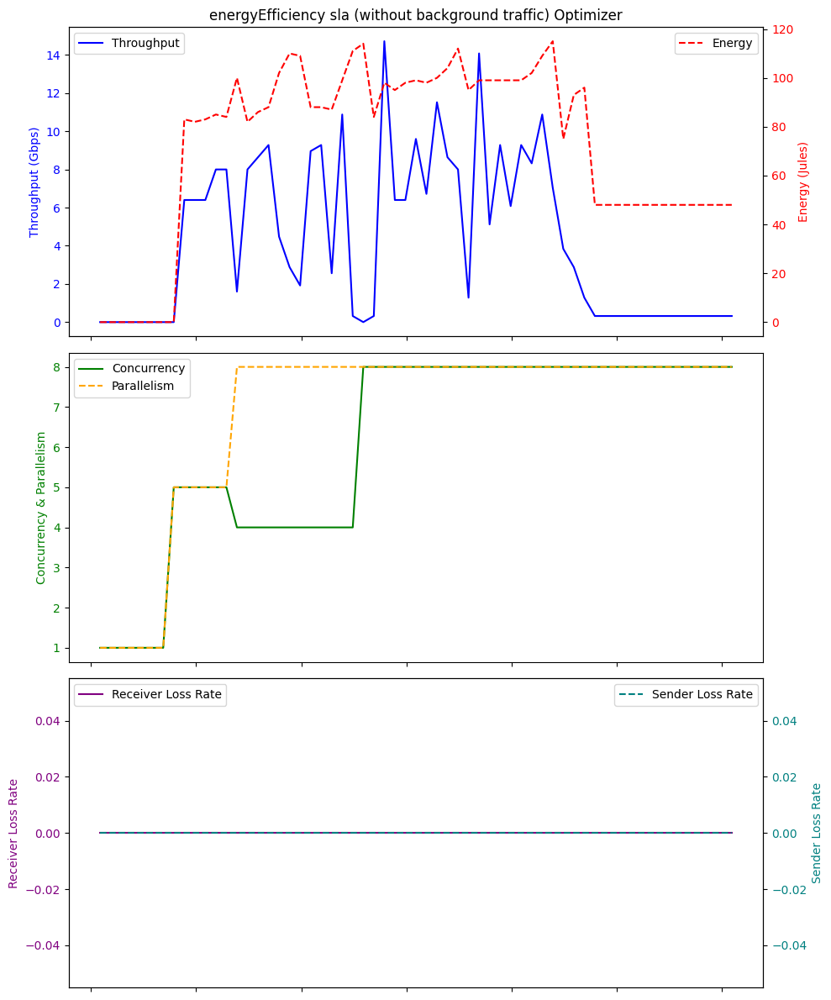

Average Throughput: 4.264918032786885
Total Energy: 72.47540983606558
Total loss rate: 0.0


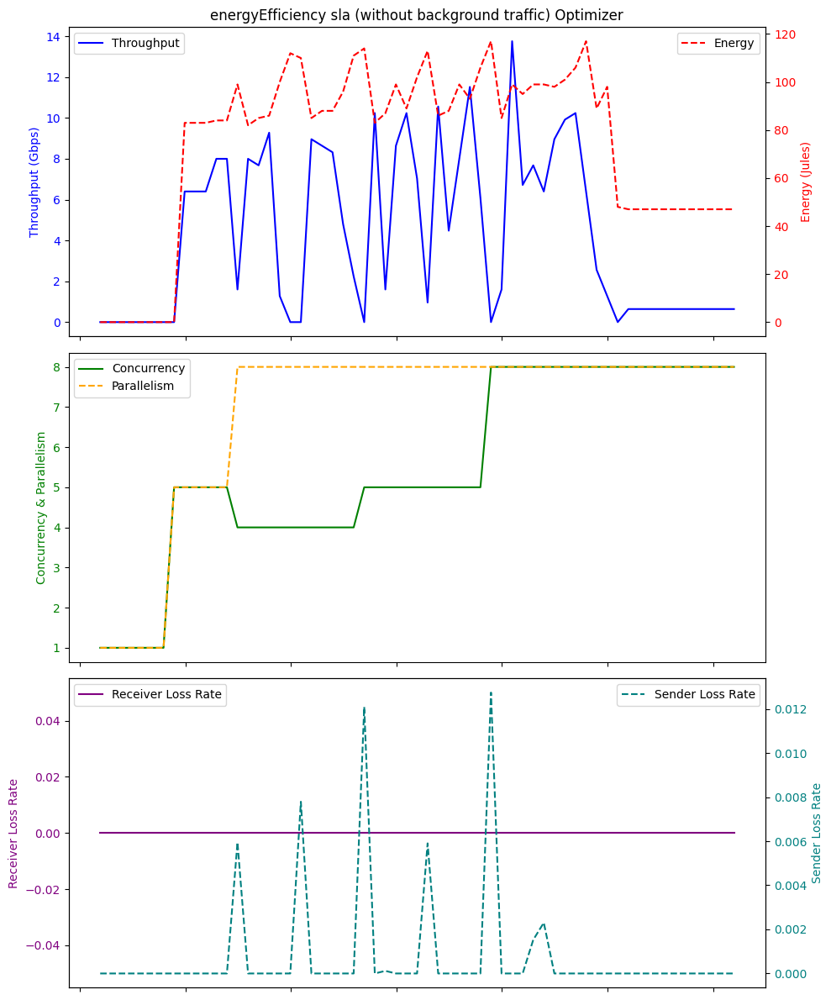

Average Throughput: 4.228196721311475
Total Energy: 73.54098360655738
Total loss rate: 0.0007938580893345002


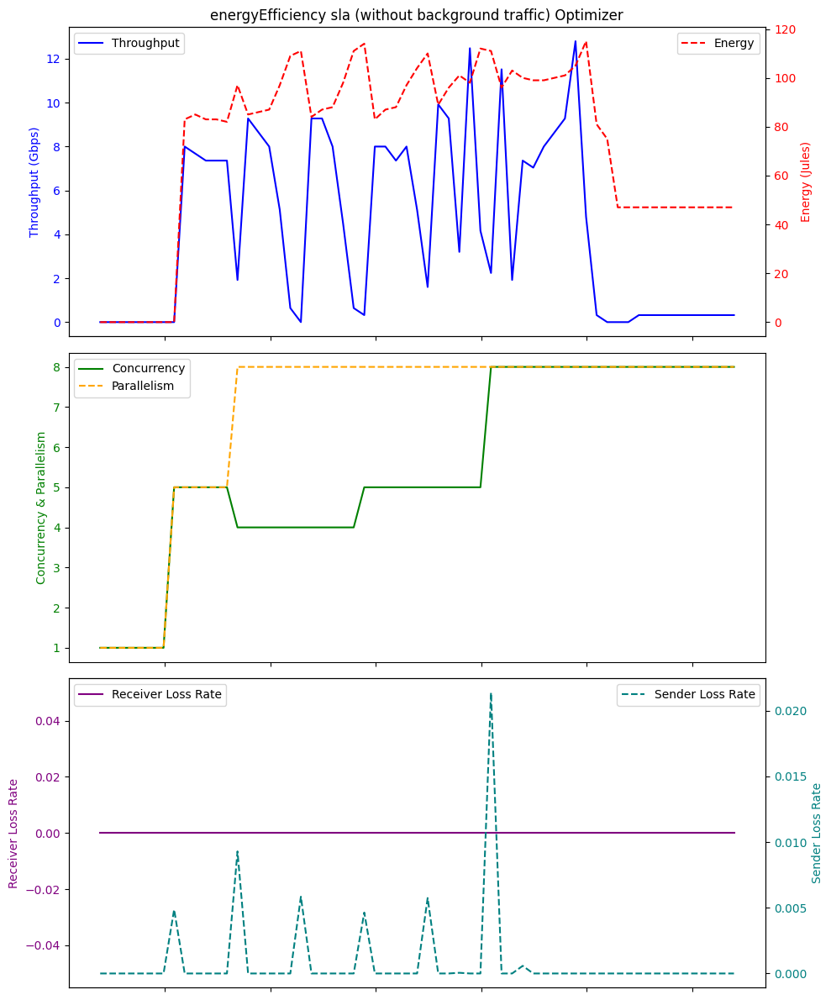

Average Throughput: 4.22295081967213
Total Energy: 73.50819672131148
Total loss rate: 0.0008588229773837636


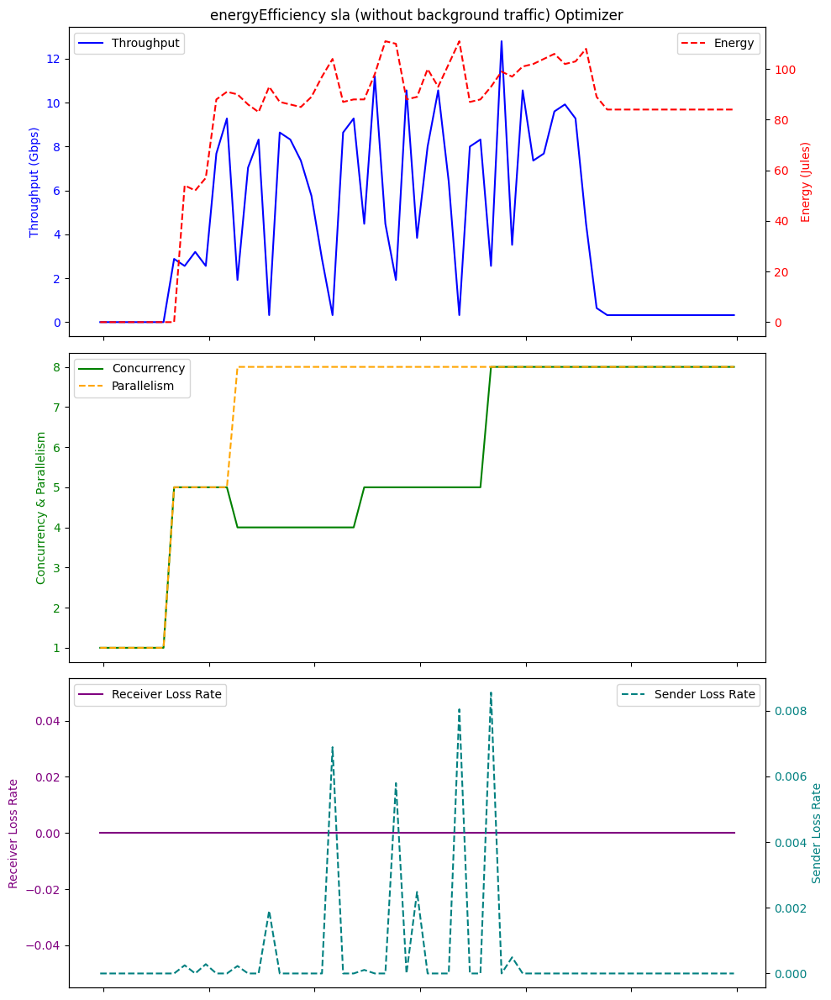

Average Throughput: 4.22295081967213
Total Energy: 78.32786885245902
Total loss rate: 0.0005741066886571694


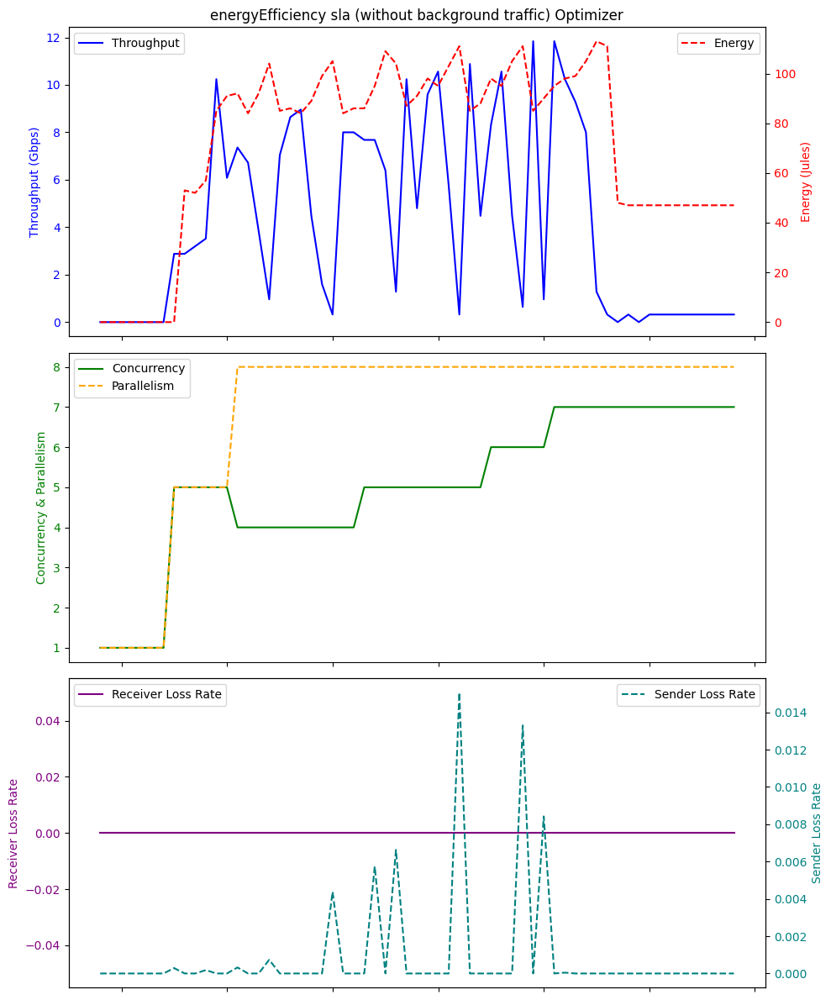

Average Throughput: 4.18622950819672
Total Energy: 71.31147540983606
Total loss rate: 0.0009029458569862159


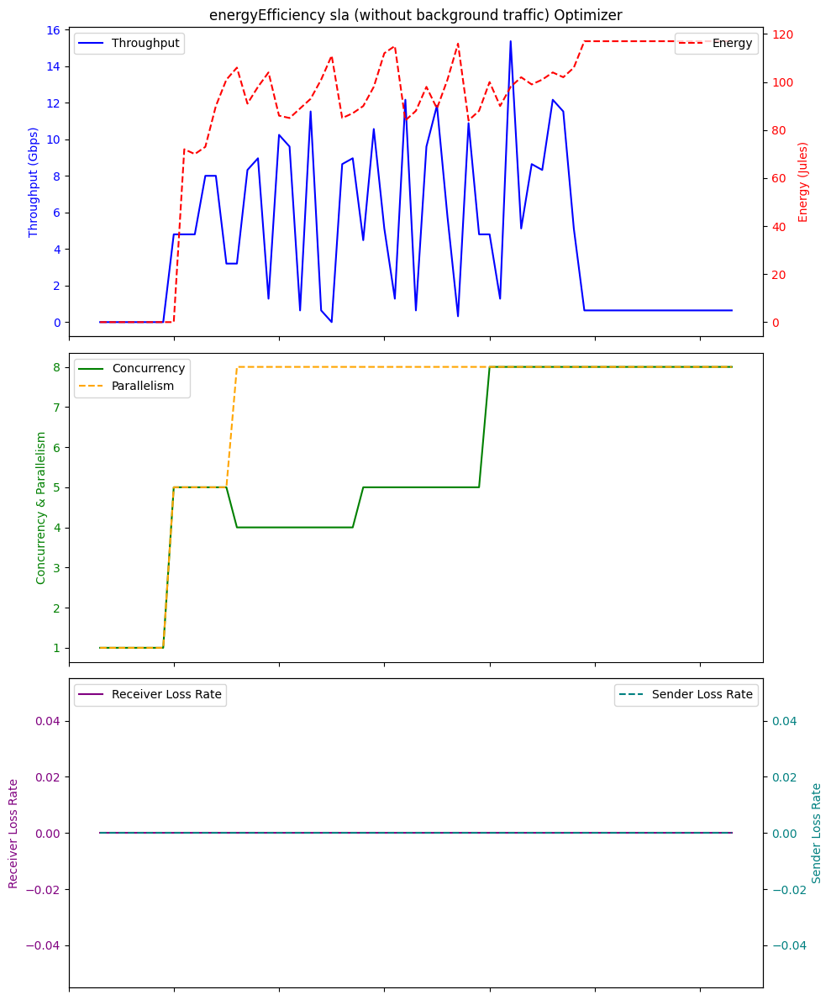

Average Throughput: 4.343606557377048
Total Energy: 87.90163934426229
Total loss rate: 0.0


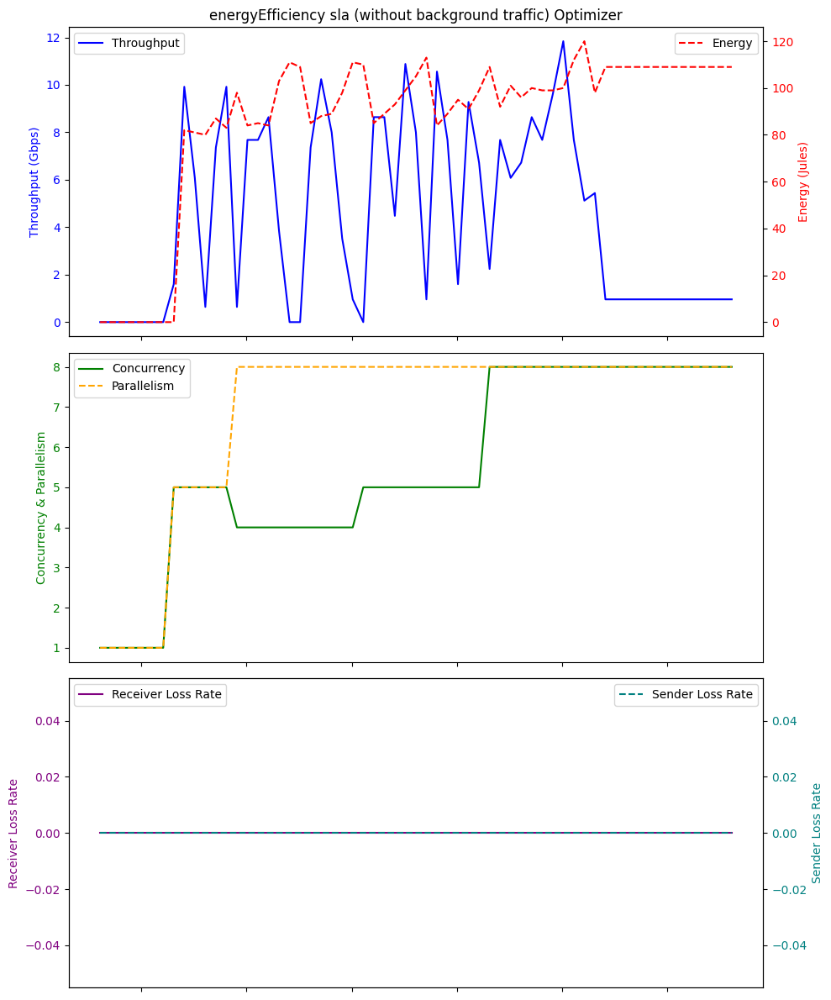

Average Throughput: 4.306885245901638
Total Energy: 86.11475409836065
Total loss rate: 0.0


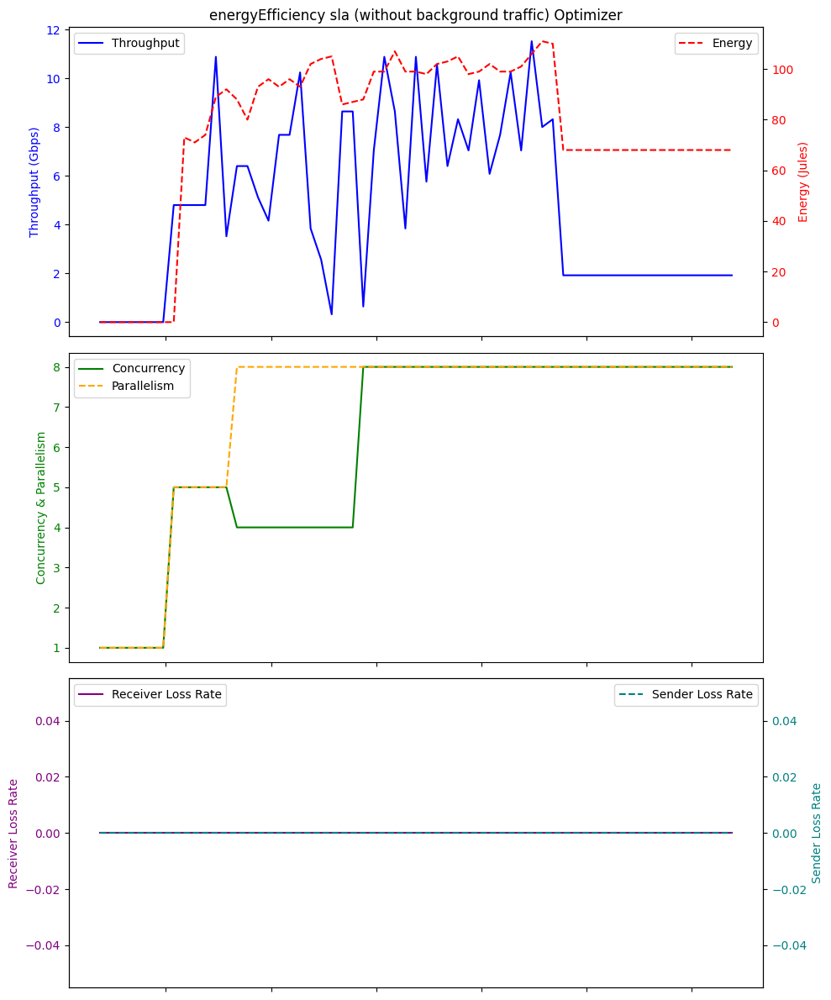

Average Throughput: 4.700327868852461
Total Energy: 75.44262295081967
Total loss rate: 0.0


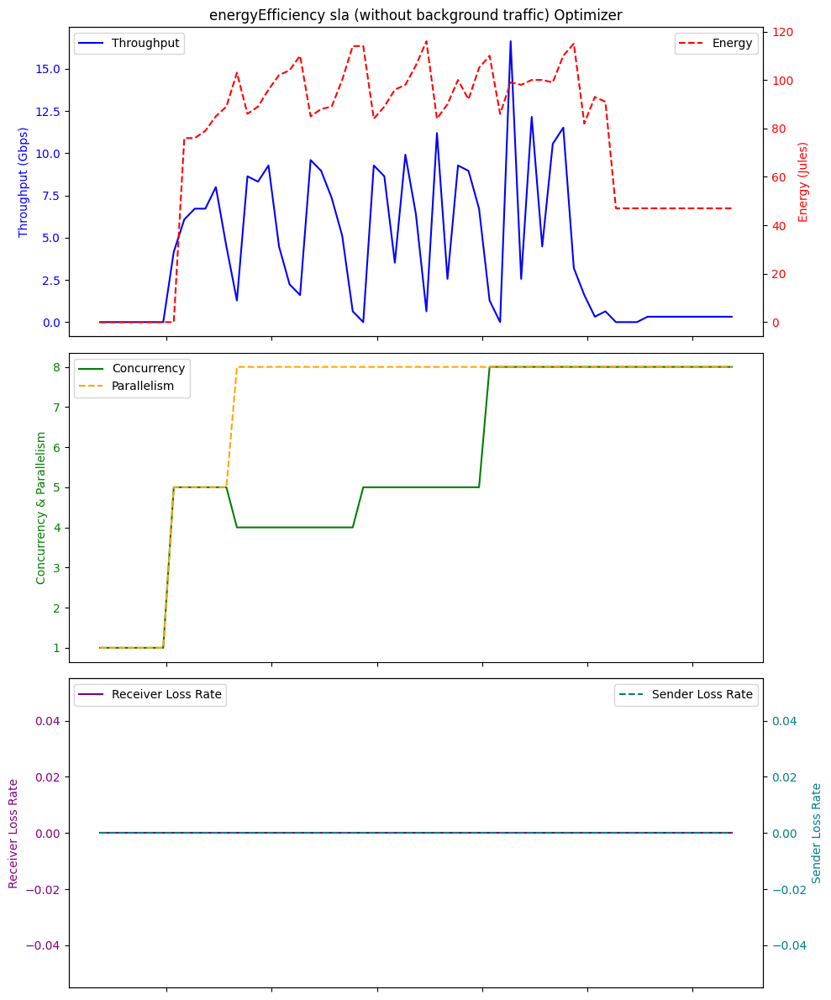

Average Throughput: 4.076065573770491
Total Energy: 73.63934426229508
Total loss rate: 0.0


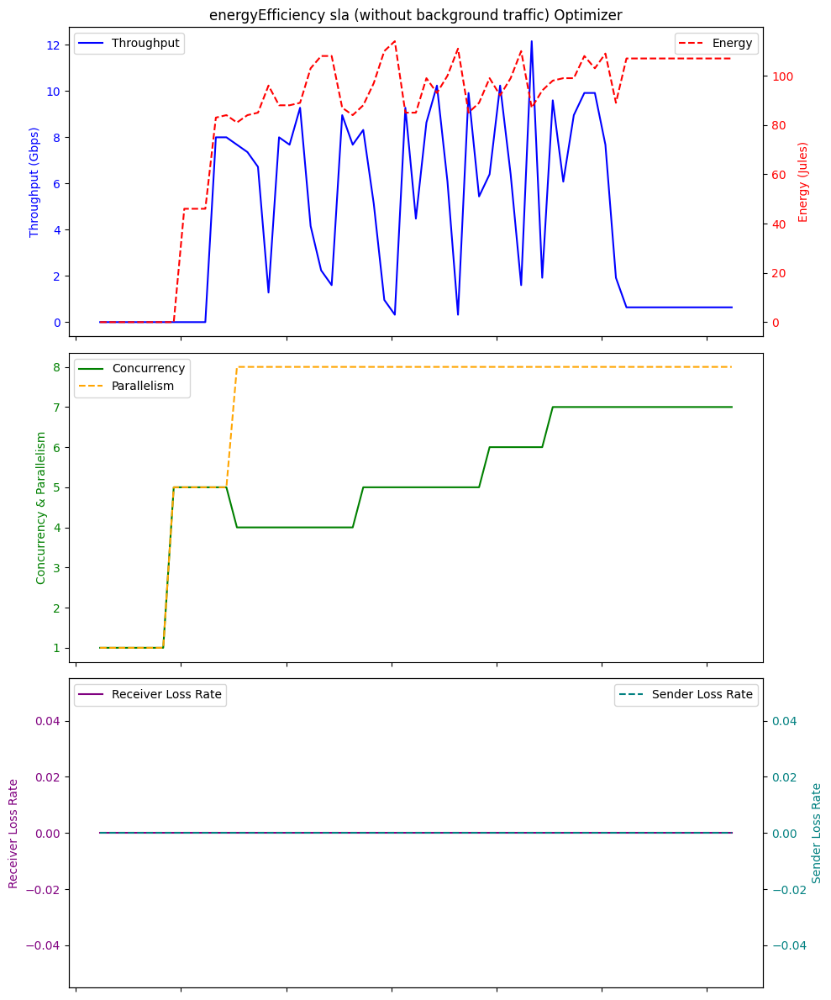

Average Throughput: 4.22295081967213
Total Energy: 82.37704918032787
Total loss rate: 0.0


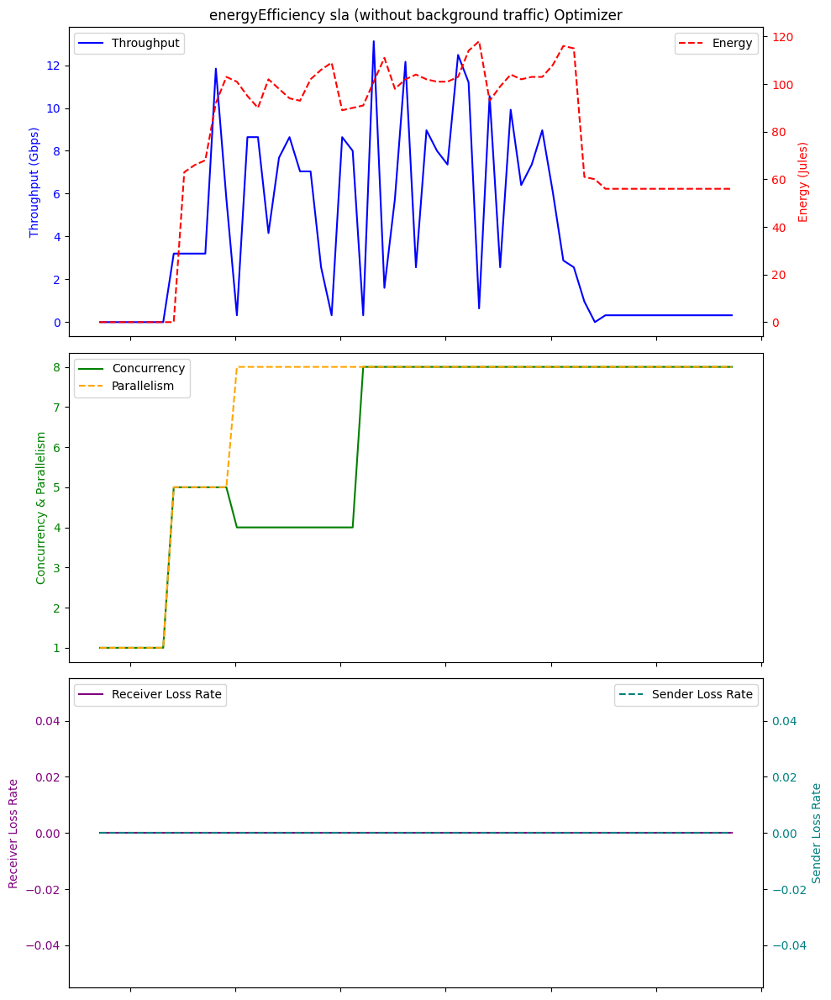

Average Throughput: 4.076065573770491
Total Energy: 75.39344262295081
Total loss rate: 0.0


In [5]:
directory = './logFileDir/ppo_energyEfficiency_sla_MA_ID/'
dfs = process_log_files(directory,"ppo_energyEfficiency_sla_MA_ID_")

ppo_energyEfficiency_sla_MA_ID_throughput_list=[]
ppo_energyEfficiency_sla_MA_ID_energy_list=[]
ppo_energyEfficiency_sla_MA_ID_plr_list=[]
# Print or process the dataframes as needed
for df in dfs:
    # print(df)
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)


    # Top plot with Throughput and Energy
    ax1.plot(df['Time'], df['Throughput'], label='Throughput', color='blue')
    ax1.set_ylabel('Throughput (Gbps)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title('energyEfficiency sla (without background traffic) Optimizer')

    ax2_twin = ax1.twinx()
    ax2_twin.plot(df['Time'], df['Energy'], label='Energy', color='red', linestyle='--')
    ax2_twin.set_ylabel('Energy (Jules)', color='red')
    ax2_twin.tick_params(axis='y', labelcolor='red')

    # Bottom plot with Concurrency, Parallelism, and CC
    ax2.plot(df['Time'], df['Concurrency'], label='Concurrency', color='green')
    ax2.plot(df['Time'], df['Parallelism'], label='Parallelism', color='orange', linestyle='--')
    ax2.set_ylabel('Concurrency & Parallelism', color='green')
    ax2.tick_params(axis='y', labelcolor='green')



    # Bottom plot with Receiver Loss Rate and Sender Loss Rate
    ax3.plot(df['Time'], df['LossRate'], label='Receiver Loss Rate', color='purple', linestyle='-')
    ax3.set_ylabel('Receiver Loss Rate', color='purple')
    ax3.tick_params(axis='y', labelcolor='purple')

    ax4_twin = ax3.twinx()
    ax4_twin.plot(df['Time'], df['SenderLR'], label='Sender Loss Rate', color='teal', linestyle='--')
    ax4_twin.set_ylabel('Sender Loss Rate', color='teal')
    ax4_twin.tick_params(axis='y', labelcolor='teal')

    # Formatting the x-axis to show time correctly
#     ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: (datetime.min + timedelta(seconds=x)).strftime('%H:%M:%S')))
#     ax2.set_xticklabels([])
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])
    # Fix for overlapping layouts
    fig.tight_layout()

    # Legend
    ax1.legend(loc='upper left')
    ax2_twin.legend(loc='upper right')
    ax2.legend(loc='upper left')
    ax3.legend(loc='upper left')
    ax4_twin.legend(loc='upper right')
#     plt.savefig('withBT.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()

    average_throughput = df['Throughput'].mean()
    print("Average Throughput:", average_throughput)
    total_energy = df['Energy'].mean()
    print("Total Energy:", total_energy)
    total_plr = df['SenderLR'].mean()
    print("Total loss rate:", total_plr)

    ppo_energyEfficiency_sla_MA_ID_throughput_list.append(average_throughput)
    ppo_energyEfficiency_sla_MA_ID_energy_list.append(total_energy)
    ppo_energyEfficiency_sla_MA_ID_plr_list.append(total_plr)


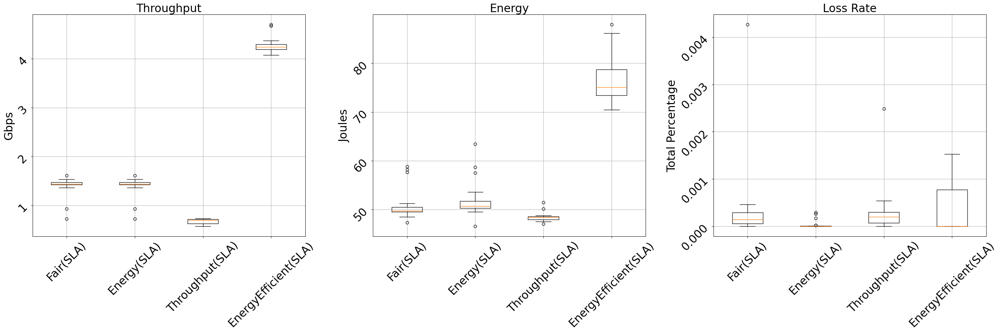

In [6]:
result_dictionary={"Throughput":[ppo_score_sla_MA_ID_throughput_list,ppo_score_sla_MA_ID_throughput_list,ppo_throughput_sla_MA_ID_throughput_list,ppo_energyEfficiency_sla_MA_ID_throughput_list],"Energy":[ppo_score_sla_MA_ID_energy_list,ppo_energy_sla_MA_ID_energy_list,ppo_throughput_sla_MA_ID_energy_list,ppo_energyEfficiency_sla_MA_ID_energy_list],"lossRate":[ppo_score_sla_MA_ID_plr_list,ppo_energy_sla_MA_ID_plr_list,ppo_throughput_sla_MA_ID_plr_list,ppo_energyEfficiency_sla_MA_ID_plr_list]}
import matplotlib.pyplot as plt

labels = ['Fair(SLA)','Energy(SLA)','Throughput(SLA)','EnergyEfficient(SLA)']

# Assuming result_dictionary is already defined with the relevant data
# result_dictionary = {...}

# Creating subplots
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# Font size for the ticks
tick_font_size = 24  # You can change this value as needed

# Plotting Throughput
axes[0].boxplot(result_dictionary['Throughput'], labels=labels)
axes[0].set_title('Throughput',fontsize=24)
axes[0].set_ylabel('Gbps',fontsize=24)
axes[0].tick_params(axis='both', which='major', labelsize=tick_font_size,labelrotation=45)  # Set tick font size
axes[0].grid(True)  # Adding grid

# Plotting Energy
axes[1].boxplot(result_dictionary['Energy'], labels=labels)
axes[1].set_title('Energy',fontsize=24)
axes[1].set_ylabel('Joules',fontsize=24)
axes[1].tick_params(axis='both', which='major', labelsize=tick_font_size,labelrotation=45)  # Set tick font size
axes[1].grid(True)  # Adding grid

# Plotting Loss Rate
axes[2].boxplot(result_dictionary['lossRate'], labels=labels)
axes[2].set_title('Loss Rate',fontsize=24)
axes[2].set_ylabel('Total Percentage',fontsize=24)
axes[2].tick_params(axis='both', which='major', labelsize=tick_font_size,labelrotation=45)  # Set tick font size
axes[2].grid(True)  # Adding grid

plt.tight_layout()
plt.show()
